In [1]:
#Amo evaluation
#FM 28.11.2025
import sys
sys.path.extend(['src', '../src']) 
# Import all ML orchestration functions
from amo.ml_orchestration import (
    ml_exp_with_timing,  # Main experiment function with timing preservation
    extract_timing_structure,
    save_midi_with_exact_timing_structure,
    KerasClassifierWrapper,
    build_lstm_classifier,
    build_transformer_classifier,
    clf_predict,
    defineXy,           # Data preparation function
    split_and_encode    # Train/test split with encoding
)
# Import MIDI processing functions  
from amo.midi2df2midi import midi_to_dataframe, save_midi_from_df
from amo.mappings import fill_quaterna_columns, learn_quaterna_mapping
# Import amo funtion
from amo.ml_orchestration import amo_with_doublings_multiclass

import pandas as pd
import numpy as np
from collections import defaultdict


from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier

import matplotlib.pyplot as plt



/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(
2026-03-23 23:05:02.062085: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774303502.077491   50652 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been

In [2]:
# amo_with_doublings
# Args:
  #      filein (str): Path to the source MIDI file to learn orchestration style from.
  #      fileout (str): Path to the target MIDI file to be orchestrated.
  #      ytarget (str, optional): The target variable for the model ('track-channel' or 'program').
  #                               Defaults to "track-channel".
  #      model (str, optional): The name of the machine learning model to use for orchestration.
  #     ("XGBoost","RandomForest", "DecisionTree", "NearestNeighbors", "MLP3", "NaiveBayes", "MLP1", "AdaBoost", "LSTMClassifier", "TransformerClassifier")
  #                             Defaults to "XGBoost".

In [3]:
def transpose(note, inverse=False, n_semitones=12):
    # Example: transpose pitch
    if inverse:
        n_semitones = - n_semitones
    new_note = note.copy()
    new_note['pitch'] = note['pitch'] + n_semitones
    return [ new_note ]

In [ ]:
transformations = [
    (transpose, {'n_semitones': 12}),
    (transpose, {'n_semitones': 24}),
    (transpose, {'n_semitones': 36}),
    (transpose, {'n_semitones': -12}),
    (transpose, {'n_semitones': -24}),
    (transpose, {'n_semitones': -36}),
    #(split_duration, {'smallest_unit': 0.25}),
]

In [5]:
"""
Prompt by GV
create a python function to read the path of .mid files which contain the string "orch". Files are inside folders like "folder_name1/la_mer_1_orch.mid", "folder_name2/symphony_9_2_orch.mid", etc.
"""
import os

def find_orch_mid_files(root_dir='.'):
    result = []
    for dirpath, _, filenames in os.walk(root_dir):
        for name in filenames:
            if name.lower().endswith('.mid') and 'orch' in name.lower():
                result.append(os.path.join(dirpath, name))
    return result

In [6]:
#get the parent directory
cwd = os.getcwd()
parent = os.path.normpath(os.path.join(cwd, '..', '..'))
path_AMO = parent + '/AutomaticMusicOrchestration'
model_path = path_AMO + '/'
#print(parent)#.../test
#print(path_AMO)

In [7]:
root_dir=model_path + 'LOP_database_06_09_17/hand_picked_Spotify'
#root_dir=parent+'/music/LOP_database_06_09_17/hand_picked_Spotify'
filenames = find_orch_mid_files(root_dir)
len(filenames)

55

In [8]:
model_names = [
        "XGBoost",
        "XGBoost5",
        "XGBoost10",
        "XGBoost20",
        "XGBoost50",
        "RandomForest",
        "RandomForest10",
        "RandomForest13",
        "RandomForest16",
        "RandomForest20",
        "DecisionTree",
        #"LSTMClassifier",      # Added
        "NearestNeighbors",
        #"MLP3",   
        #"TransformerClassifier", # Added
        "NaiveBayes",
        #"MLP1",
        "AdaBoost",
        "Dummy0",
        "Dummy1",
        "DummyUnif",      
    ]


model_names_short = [
    'XGB',
    'XGB5',
    'XGB10',
    'XGB20',
    'XGB50',
    'RF',
    'RF10',
    'RF13',
    'RF16',
    'RF20',
    'DT',
    #'LSTM*',
    'NN',
    #'MLP3*',
    #'TF',
    'NB',
    #'MLP1',
    'AB',
    'D0',
    'D1',
    'DU',
    ]

classifiers = [
    XGBClassifier(),
    XGBClassifier(n_estimators = 5),
    XGBClassifier(n_estimators = 10),
    XGBClassifier(n_estimators = 20),
    XGBClassifier(n_estimators = 50),
    RandomForestClassifier(),
    RandomForestClassifier(max_depth=10),
    RandomForestClassifier(max_depth=13),
    RandomForestClassifier(max_depth=16),
    RandomForestClassifier(max_depth=20),
    DecisionTreeClassifier(),
    #KerasClassifierWrapper(build_lstm_classifier),      # Added LSTM
    KNeighborsClassifier(1),
    #MLPClassifier(hidden_layer_sizes=(128,128,128)),
    #KerasClassifierWrapper(build_transformer_classifier),# Added Transformer
    GaussianNB(),
    #MLPClassifier(),
    AdaBoostClassifier(),
    DummyClassifier(strategy='constant', constant=0),
    DummyClassifier(strategy='constant', constant=1),
    DummyClassifier(strategy='uniform'),
]

In [9]:
# Reduce for testing purposes, remove this cell for the actual experiment
N_files = len(filenames)
N_models = len(classifiers)

filenames = filenames[:N_files]

model_names = model_names[:N_models]
classifiers = classifiers[:N_models]
model_names_short = model_names_short[:N_models]

In [10]:
# Initialize metrics collectors
s = (len(filenames),len(model_names))
ml_metrics = dict()
base_metrics_names = ["time",
                      "accuracy (train)",
                      "accuracy (test)",
                      "precision (train)",
                      "precision (test)",
                      "recall (train)",
                      "recall (test)",
                      "f1 (train)",
                      "f1 (test)",
                      ] #, "n_events", "n_classes"]
ml_metrics_names = base_metrics_names.copy()

for func, kwargs in transformations:
    trans_target_name = f"{func.__name__}_{kwargs}"
    for bmn in base_metrics_names:
        ml_metrics_names.append(f"{bmn} ({trans_target_name})")

for mn in ml_metrics_names:
    ml_metrics[mn] = np.zeros(s)

In [ ]:
# Multiclass, with transformations
error_collection = []
for i, filein in enumerate(filenames):    
    for u, (model_name, clf) in enumerate(zip(model_names, classifiers)):
        try: 
            metrics = amo_with_doublings_multiclass(filein,fileout=None,model=model_name, tol=0.2, transformations=transformations, model_path=model_path)
            print(metrics)
            for mn in ml_metrics_names:
                # ml_metrics["accuracy"][i,u] = metrics["accuracy"]
                ml_metrics[mn][i,u] = metrics[mn]
        except Exception as e:
            print("Error")
            error_collection.append(f"Error with {filein} and model {model_name}: {e}")

print("\n????????? ERRORS ??????????")
for error in error_collection:
    print(error)


========= PREPROCESSING =========
[PREPROCESSING] Computing and caching results...
{'transformed': 308, 'direct': 39, 'none': 3973}
Original size: (4320, 15)
Dropping [901, 902, 903, 905, 906, 907, 909, 911, 913, 915, 916, 917, 919, 921, 923, 925, 927, 929, 930, 932, 936, 945, 946, 949, 479, 960, 711, 713, 715, 487, 968, 496, 498, 500, 502, 504, 506, 508, 510, 512, 514, 516, 518, 520, 522, 524, 526, 1375, 1376, 1379, 1193, 1381, 1384, 1385, 2762, 2763, 527, 528, 1284, 1285, 3108, 3109, 992, 741, 2765, 529, 1286, 1287, 3110, 3111, 994, 995, 1200, 2767, 1288, 1289, 3112, 3113, 996, 997, 1202, 2768, 533, 1290, 1291, 3114, 998, 999, 2770, 535, 536, 1292, 1293, 3116, 1000, 1001, 2771, 2772, 537, 1294, 1295, 3118, 1002, 1003, 1339, 2773, 540, 1296, 1297, 3120, 3121, 1005, 753, 2774, 541, 542, 1298, 1299, 3122, 3123, 1006, 1007, 1212, 755, 2775, 543, 1300, 1301, 3124, 3125, 1008, 1009, 1214, 757, 2776, 1302, 1303, 3126, 3127, 1010, 1011, 1216, 759, 2777, 1304, 1305, 3128, 3129, 1012, 1013, 7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 2.3996663093566895, 'accuracy (test)': np.float64(0.8499245852187028), 'accuracy (train)': np.float64(0.9130844645550528), 'precision (test)': 0.8763961280714817, 'precision (train)': 0.9348880597014926, 'recall (test)': 0.8616398243045388, 'recall (train)': 0.9223265230995766, 'f1 (test)': 0.8689553340716132, 'f1 (train)': 0.9285648105253405, "time (transpose_{'n_semitones': 12})": 0.0925137996673584, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9986190570132176, "precision (test) (transpose_{'n_semitones': 12})": 0.9981072555205046, "precision (train) (transpose_{'n_semitones': 12})": 0.998608775090691, "recall (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "recall (train) (transpose_{'n_semitones': 12})": 0.9986190570132176, "f1 (test) (transpose_{'n_semitones': 12})": 0.99776409552

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0289
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 0.5153961181640625, 'accuracy (test)': np.float64(0.7669683257918553), 'accuracy (train)': np.float64(0.7528280542986425), 'precision (test)': 0.9099405267629567, 'precision (train)': 0.9050279329608939, 'recall (test)': 0.7840409956076134, 'recall (train)': 0.7752622860298177, 'f1 (test)': 0.8423122296500196, 'f1 (train)': 0.8351343313175374, "time (transpose_{'n_semitones': 12})": 0.03335070610046387, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9968454258675079, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9911225093706846, "precision (test) (transpose_{'n_semitones': 12})": 0.9968554403885634, "precision (train) (t

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8053
Score on Test (20%): 0.8462
Precision (micro): 0.8987
Recall (micro): 0.8704
F1-Score (micro): 0.8843
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   1   15]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1198   14]
 [  19   95]]
--- Class: 17_12 Violine II ---
[[1196   29]
 [  25   76]]
--- Class: 18_13 Viola ---
[[1213    8]
 [  28   77]]
--- Class: 19_14 Violoncelle ---
[[1224   11]
 [  35   56]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1238    5]
 [   6   77]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1228   14]
 [  16   68]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.6568
Score on Test (20%): 0.8544
Precision (micro): 0.8871
Recall (micro): 0.8682
F1-Score (micro): 0.8775
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   1   15]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   1   13]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   1    5]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1198   14]
 [  21   93]]
--- Class: 17_12 Violine II ---
[[1200   25]
 [  25   76]]
--- Class: 18_13 Viola ---
[[1210   11]
 [  29   76]]
--- Class: 19_14 Violoncelle ---
[[1217   18]
 [  33   58]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1237    6]
 [   7   76]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1221   21]
 [  20   64]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0408
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 1.6568248271942139, 'accuracy (test)': np.float64(0.8544494720965309), 'accuracy (train)': np.float64(0.8953619909502263), 'precision (test)': 0.887060583395662, 'precision (train)': 0.9263493253373314, 'recall (test)': 0.8682284040995608, 'recall (train)': 0.909810417817044, 'f1 (test)': 0.877543470218276, 'f1 (train)': 0.9180053858296964, "time (transpose_{'n_semitones': 12})": 0.0595393180847168, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9970408364568949, "precision (test) (transpose_{'n_semitones': 12})": 0.9981072555205046, "precision (train) (trans

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1941
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.531177997589111, 'accuracy (test)': np.float64(0.8152337858220211), 'accuracy (train)': np.float64(0.9994343891402715), 'precision (test)': 0.8385416666666666, 'precision (train)': 1.0, 'recall (test)': 0.8250366032210834, 'recall (train)': 0.9994478188845941, 'f1 (test)': 0.8317343173431734, 'f1 (train)': 0.9997238331952499, "time (transpose_{'n_semitones': 12})": 0.36858129501342773, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpose_{'n_semitones': 12})":

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2061
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.281413316726685, 'accuracy (test)': np.float64(0.8371040723981901), 'accuracy (train)': np.float64(0.9015837104072398), 'precision (test)': 0.8865030674846626, 'precision (train)': 0.9370998116760829, 'recall (test)': 0.8462664714494875, 'recall (train)': 0.9158844100865083, 'f1 (test)': 0.8659176029962546, 'f1 (train)': 0.9263706599646281, "time (transpose_{'n_semitones': 12})": 0.3506159782409668, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9970408364568949, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1932
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.3475661277771, 'accuracy (test)': np.float64(0.8371040723981901), 'accuracy (train)': np.float64(0.9524886877828054), 'precision (test)': 0.8704819277108434, 'precision (train)': 0.9666357738646896, 'recall (test)': 0.8462664714494875, 'recall (train)': 0.9598748389471746, 'f1 (test)': 0.858203414996288, 'f1 (train)': 0.963243442925748, "time (transpose_{'n_semitones': 12})": 0.3529622554779053, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9992108897218386, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpo

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1899
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.432061672210693, 'accuracy (test)': np.float64(0.8295625942684767), 'accuracy (train)': np.float64(0.9741704374057315), 'precision (test)': 0.8604651162790697, 'precision (train)': 0.9825861430159318, 'recall (test)': 0.8396778916544656, 'recall (train)': 0.9762562120375483, 'f1 (test)': 0.8499444238606891, 'f1 (train)': 0.9794109500507802, "time (transpose_{'n_semitones': 12})": 0.3588099479675293, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2111
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.394568681716919, 'accuracy (test)': np.float64(0.8152337858220211), 'accuracy (train)': np.float64(0.9930241327300151), 'precision (test)': 0.8468468468468469, 'precision (train)': 0.9974164975087655, 'recall (test)': 0.8257686676427526, 'recall (train)': 0.9948463095895453, 'f1 (test)': 0.8361749444032617, 'f1 (train)': 0.9961297456690011, "time (transpose_{'n_semitones': 12})": 0.3584914207458496, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.3816
Score on Test (20%): 0.7911
Precision (micro): 0.8031
Recall (micro): 0.7972
F1-Score (micro): 0.8001
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1309    1]
 [   0   16]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   1    7]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1212    2]
 [   2  110]]
--- Class: 16_11 Violine I ---
[[1189   23]
 [  29   85]]
--- Class: 17_12 Violine II ---
[[1178   47]
 [  36   65]]
--- Class: 18_13 Viola ---
[[1181   40]
 [  32   73]]
--- Class: 19_14 Violoncelle ---
[[1192   43]
 [  32   59]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1232   11]
 [  12   71]]
--- Class: 2_1 2 Flauti ---
[[1199    3]
 [   4  120]]
--- Class: 3_2 2 Oboi ---
[[1214   28]
 [  25   59]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4506
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 9.38157057762146, 'accuracy (test)': np.float64(0.7911010558069381), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8030973451327433, 'precision (train)': 1.0, 'recall (test)': 0.7972181551976574, 'recall (train)': 1.0, 'f1 (test)': 0.8001469507714916, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.442657470703125, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9952681388012619, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9957162766394047, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2867
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.77279257774353, 'accuracy (test)': np.float64(0.4947209653092006), 'accuracy (train)': np.float64(0.48642533936651583), 'precision (test)': 0.8859223300970874, 'precision (train)': 0.8926535782140596, 'recall (test)': 0.5344070278184481, 'recall (train)': 0.5188661881097, 'f1 (test)': 0.6666666666666666, 'f1 (train)': 0.656268187638226, "time (transpose_{'n_semitones': 12})": 0.2856428623199463, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9905362776025236, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9820477411718288, "precision (test) (transpose_{'n_semitones': 12})": 0.9811621172466638, "precision (train) (transpo

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0306
Score on Test Set (20% split): 0.9429
Precision (weighted): 0.9429
Recall (weighted): 0.9429
F1-Score (weighted): 0.9429
Confusion Matrix:
 [[30  1]
 [ 1  3]]
transpose_{'n_semitones': 24}
0    0.988571
1    0.011429
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 175
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0126
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1610
Score on Test (20%): 0.7750
Precision (micro): 0.9412
Recall (micro): 0.7805
F1-Score (micro): 0.8533
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 4  1]]
--- Class: 16_12 Violini II. ---
[[35  0]
 [ 2  3]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 1  3]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.811429
1    0.182857
2    0.005714
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 175
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0264
Score

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2007
Score on Test (20%): 0.8000
Precision (micro): 0.9167
Recall (micro): 0.8049
F1-Score (micro): 0.8571
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 4  1]]
--- Class: 16_12 Violini II. ---
[[34  1]
 [ 1  4]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 1  3]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.811429
1    0.182857
2    0.005714
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 175
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.0431
Score

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8854
Score on Test (20%): 0.8750
Precision (micro): 0.9231
Recall (micro): 0.8780
F1-Score (micro): 0.9000
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 3  2]]
--- Class: 16_12 Violini II. ---
[[35  0]
 [ 0  5]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[38  1]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.811429
1    0.182857
2    0.005714
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 175
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1125
Sc

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1420
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.8853530883789062, 'accuracy (test)': np.float64(0.875), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.92307692307

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1149
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.8673522472381592, 'accuracy (test)': np.float64(0.85), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.921052631578

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1152
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.8771307468414307, 'accuracy (test)': np.float64(0.85), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.921052631578

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1153
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.8751406669616699, 'accuracy (test)': np.float64(0.875), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.92307692307

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.1137
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.8810083866119385, 'accuracy (test)': np.float64(0.85), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.921052631578

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5712
Score on Test (20%): 0.8000
Precision (micro): 0.9189
Recall (micro): 0.8293
F1-Score (micro): 0.8718
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 3  2]]
--- Class: 16_12 Violini II. ---
[[34  1]
 [ 2  3]]
--- Class: 17_13 Viole ---
[[35  0]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[39  1]
 [ 0  0]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.811429
1    0.182857
2    0.005714
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 175
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 175
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.5711970329284668, 'accuracy (test)': np.float64(0.8), 'accuracy (train)': np.float64(0.8625), 'precision (test)': 0.918918918918919, 'precision (train)': 0.9447852760736196, 'recall (test)': 0.8292682926829268, 'recall (train)': 0.9005847953216374, 'f1 (test)': 0.8717948717948718, 'f1 (train)': 0.9221556886227545, "time (transpose_{'n_semitones': 12})": 0.0845484733581543, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8, "accuracy (train) (transpose_{'n_semitones': 12})": 0.7928571428571428, "precision (test) (transpose_{'n_semito

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0462
Score on Test (20%): 0.8125
Precision (micro): 0.8438
Recall (micro): 0.8438
F1-Score (micro): 0.8438
Confusion Matrices for Individual Classes:
--- Class: 1_0 Trumpet in Bb ---
[[20  0]
 [ 4  8]]
--- Class: 2_1 Trumpet in Bb ---
[[24  5]
 [ 1  2]]
--- Class: 3_2 Trumpet in Bb ---
[[25  0]
 [ 0  7]]
--- Class: 4_3 Trombone ---
[[22  0]
 [ 0 10]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.733333
1    0.266667
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 120
Last onset at 152.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0161
Score on Test Set (20% split): 0.7500
Precision (weighted): 0.7045
Recall (weighted): 0.7500
F1-Score (weighted): 0.7000
Confusion Matrix:
 [[17  1]
 [ 5  1]]
transpose_{'n_semitones': 24}
0    0.966667
1    0.033333
Name: pr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


{'time': 0.0919497013092041, 'accuracy (test)': np.float64(0.84375), 'accuracy (train)': np.float64(0.9354838709677419), 'precision (test)': 0.8709677419354839, 'precision (train)': 0.9918032786885246, 'recall (test)': 0.84375, 'recall (train)': 0.9453125, 'f1 (test)': 0.8571428571428571, 'f1 (train)': 0.968, "time (transpose_{'n_semitones': 12})": 0.02471160888671875, "accuracy (test) (transpose_{'n_semitones': 12})": 0.7083333333333334, "accuracy (train) (transpose_{'n_semitones': 12})": 0.96875, "precision (test) (transpose_{'n_semitones': 12})": 0.6547619047619048, "precision (train) (transpose_{'n_semitones': 12})": 0.9686267605633804, "recall (test) (transpose_{'n_semitones': 12})": 0.7083333333333334, "recall (train) (transpose_{'n_semitones': 12})": 0.96875, "f1 (test) (transpose_{'n_semitones': 12})": 0.6709401709401709, "f1 (train) (transpose_{'n_semitones': 12})": 0.9685544430538172, "time (transpose_{'n_semitones': 24})": 0.01993274688720703, "accuracy (test) (transpose_{'n

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4507
Score on Test (20%): 0.7500
Precision (micro): 0.8065
Recall (micro): 0.7812
F1-Score (micro): 0.7937
Confusion Matrices for Individual Classes:
--- Class: 1_0 Trumpet in Bb ---
[[20  0]
 [ 6  6]]
--- Class: 2_1 Trumpet in Bb ---
[[23  6]
 [ 1  2]]
--- Class: 3_2 Trumpet in Bb ---
[[25  0]
 [ 0  7]]
--- Class: 4_3 Trombone ---
[[22  0]
 [ 0 10]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.733333
1    0.266667
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 120
Last onset at 152.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1117
Score on Test Set (20% split): 0.6250
Precision (weighted): 0.5357
Recall (weighted): 0.6250
F1-Score (weighted): 0.5769
Confusion Matrix:
 [[15  3]
 [ 6  0]]
transpose_{'n_semitones': 24}
0    0.966667
1    0.033333
Name:

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1254
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4506714344024658, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8064516129032258, 'precision (train)': 1.0, 'recall (test)': 0.7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1104
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4485454559326172, 'accuracy (test)': np.float64(0.78125), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8181818181818182, 'precision (train)': 1.0, 'recall (test)': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1139
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4442126750946045, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7941176470588235, 'precision (train)': 1.0, 'recall (test)': 0.8

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1178
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4453718662261963, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7878787878787878, 'precision (train)': 1.0, 'recall (test)': 0.8

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1116
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.47552037239074707, 'accuracy (test)': np.float64(0.75), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7941176470588235, 'precision (train)': 1.0, 'recall (test)': 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0060
Score on Test Set (20% split): 0.7500
Precision (weighted): 0.5625
Recall (weighted): 0.7500
F1-Score (weighted): 0.6429
Confusion Matrix:
 [[18  0]
 [ 6  0]]
transpose_{'n_semitones': 24}
0    0.966667
1    0.033333
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 120
Last onset at 152.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy0 ---------
Train Time (sec): 0.0037
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
L

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6153
Score on Test (20%): 0.6144
Precision (micro): 0.8726
Recall (micro): 0.6089
F1-Score (micro): 0.7173
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2737   18]
 [  54  114]]
--- Class: 11_7 Trombone 3 ---
[[2834    1]
 [  15   73]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   2  196]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2729   21]
 [  45  128]]
--- Class: 18_12 Violine II ---
[[2712   24]
 [ 154   33]]
--- Class: 19_13 Viola ---
[[2721    0]
 [ 202    0]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   5  127]]
--- Class: 20_14 Violoncelle ---
[[2763   28]
 [  71   61]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   8   74]]
--- Class: 2_1 2 Flauti ---
[[2748    0]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2671   5

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6593
Score on Test (20%): 0.6452
Precision (micro): 0.8528
Recall (micro): 0.6578
F1-Score (micro): 0.7427
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2737   18]
 [  52  116]]
--- Class: 11_7 Trombone 3 ---
[[2835    0]
 [  11   77]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   2  196]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2735   15]
 [  45  128]]
--- Class: 18_12 Violine II ---
[[2682   54]
 [ 127   60]]
--- Class: 19_13 Viola ---
[[2721    0]
 [ 202    0]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2755   36]
 [  59   73]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   5   77]]
--- Class: 2_1 2 Flauti ---
[[2748    0]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2651   7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8969
Score on Test (20%): 0.6558
Precision (micro): 0.8482
Recall (micro): 0.6690
F1-Score (micro): 0.7480
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2739   16]
 [  50  118]]
--- Class: 11_7 Trombone 3 ---
[[2833    2]
 [   9   79]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   0  198]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2735   15]
 [  47  126]]
--- Class: 18_12 Violine II ---
[[2685   51]
 [ 126   61]]
--- Class: 19_13 Viola ---
[[2716    5]
 [ 188   14]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2758   33]
 [  58   74]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   5   77]]
--- Class: 2_1 2 Flauti ---
[[2748    0]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2649   7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.2963
Score on Test (20%): 0.6733
Precision (micro): 0.8133
Recall (micro): 0.6847
F1-Score (micro): 0.7435
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2739   16]
 [  40  128]]
--- Class: 11_7 Trombone 3 ---
[[2834    1]
 [   6   82]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   0  198]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2724   26]
 [  42  131]]
--- Class: 18_12 Violine II ---
[[2688   48]
 [ 109   78]]
--- Class: 19_13 Viola ---
[[2692   29]
 [ 171   31]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2749   42]
 [  55   77]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   5   77]]
--- Class: 2_1 2 Flauti ---
[[2747    1]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2641   8

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 10.7562
Score on Test (20%): 0.6675
Precision (micro): 0.6801
Recall (micro): 0.6627
F1-Score (micro): 0.6713
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2725   30]
 [  42  126]]
--- Class: 11_7 Trombone 3 ---
[[2832    3]
 [   4   84]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   0  198]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   0  103]]
--- Class: 17_11 Violine I ---
[[2717   33]
 [  43  130]]
--- Class: 18_12 Violine II ---
[[2639   97]
 [ 109   78]]
--- Class: 19_13 Viola ---
[[2575  146]
 [ 161   41]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2727   64]
 [  58   74]]
--- Class: 21_15 Contrabasse ---
[[2838    3]
 [   3   79]]
--- Class: 2_1 2 Flauti ---
[[2744    4]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2634   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2426
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.756179571151733, 'accuracy (test)': np.float64(0.667464933287718), 'accuracy (train)': np.float64(0.9995723205884869), 'precision (test)': 0.6801346801346801, 'precision (train)': 1.0, 'recall (test)': 0.6627296587926509, 'recall (train)': 0.999589457262501, 'f1 (test)': 0.6713193752077102, 'f1 (train)': 0.9997946864862646, "time (transpose_{'n_semitones': 12})": 0.7901599407196045, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9088330632090762, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9057704202742384, "precision (train) (transpose_{'n_semitones': 12})": 1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2351
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 9.773157835006714, 'accuracy (test)': np.float64(0.660964762230585), 'accuracy (train)': np.float64(0.7253442819262681), 'precision (test)': 0.8425460636515912, 'precision (train)': 0.9106295149638803, 'recall (test)': 0.6601049868766404, 'recall (train)': 0.7245258231381887, 'f1 (test)': 0.7402501839587933, 'f1 (train)': 0.8069870593076959, "time (transpose_{'n_semitones': 12})": 0.6765789985656738, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9270664505672609, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9476243541687772, "precision (test) (transpose_{'n_semitones': 12})": 0.9205175587151527, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2464
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.135990858078003, 'accuracy (test)': np.float64(0.6691755046185426), 'accuracy (train)': np.float64(0.8076298007013942), 'precision (test)': 0.7951010886469674, 'precision (train)': 0.9506232023010547, 'recall (test)': 0.6709317585301837, 'recall (train)': 0.8141062484604648, 'f1 (test)': 0.7277580071174378, 'f1 (train)': 0.8770843469414835, "time (transpose_{'n_semitones': 12})": 0.765385627746582, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9238249594813615, "accuracy (train) (transpose_{'n_semitones': 12})": 0.970418397325499, "precision (test) (transpose_{'n_semitones': 12})": 0.9181952551687688, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2341
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.534821510314941, 'accuracy (test)': np.float64(0.6671228190215532), 'accuracy (train)': np.float64(0.8855529894790864), 'precision (test)': 0.754275092936803, 'precision (train)': 0.9839047012821679, 'recall (test)': 0.6656824146981627, 'recall (train)': 0.888414483947779, 'f1 (test)': 0.707215057511328, 'f1 (train)': 0.9337245426303072, "time (transpose_{'n_semitones': 12})": 0.7258472442626953, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9153160453808752, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9879444838415561, "precision (test) (transpose_{'n_semitones': 12})": 0.9106532245933366, "precision (train) (trans

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2398
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.886232137680054, 'accuracy (test)': np.float64(0.6654122476907287), 'accuracy (train)': np.float64(0.9689504747241467), 'precision (test)': 0.7016325112886419, 'precision (train)': 0.9985615163310205, 'recall (test)': 0.6627296587926509, 'recall (train)': 0.9689629690450776, 'f1 (test)': 0.6816264552049941, 'f1 (train)': 0.9835396091178064, "time (transpose_{'n_semitones': 12})": 0.7527792453765869, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9116693679092382, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9976699422550906, "precision (test) (transpose_{'n_semitones': 12})": 0.9079773224108539, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 20.8252
Score on Test (20%): 0.6524
Precision (micro): 0.6480
Recall (micro): 0.6486
F1-Score (micro): 0.6483
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2720   35]
 [  43  125]]
--- Class: 11_7 Trombone 3 ---
[[2828    7]
 [  10   78]]
--- Class: 12_8 Tuba ---
[[2848    5]
 [   1   69]]
--- Class: 13_10 Timpani ---
[[2810    8]
 [  10   95]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   1  197]]
--- Class: 15_9 Piatti ---
[[2864   10]
 [   8   41]]
--- Class: 16_10 Gran Cassa ---
[[2817    3]
 [   4   99]]
--- Class: 17_11 Violine I ---
[[2713   37]
 [  47  126]]
--- Class: 18_12 Violine II ---
[[2625  111]
 [ 105   82]]
--- Class: 19_13 Viola ---
[[2571  150]
 [ 154   48]]
--- Class: 1_0 Piccolo ---
[[2786    5]
 [   9  123]]
--- Class: 20_14 Violoncelle ---
[[2697   94]
 [  64   68]]
--- Class: 21_15 Contrabasse ---
[[2824   17]
 [  22   60]]
--- Class: 2_1 2 Flauti ---
[[2732   16]
 [  12  163]]
--- Class: 3_2 2 Oboi ---
[[2627  1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8374
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 20.825244903564453, 'accuracy (test)': np.float64(0.6524119055764626), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.647984267453294, 'precision (train)': 1.0, 'recall (test)': 0.6486220472440944, 'recall (train)': 1.0, 'f1 (test)': 0.6483030004918839, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.8804423809051514, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8833063209076175, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.877421154475797, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones':

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0143
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.2183375358581543, 'accuracy (test)': np.float64(0.37461512145056447), 'accuracy (train)': np.float64(0.37490377213240955), 'precision (test)': 0.4272067252579289, 'precision (train)': 0.4285782488303256, 'recall (test)': 0.7335958005249343, 'recall (train)': 0.7370884309056572, 'f1 (test)': 0.5399661917411254, 'f1 (train)': 0.5420075471698114, "time (transpose_{'n_semitones': 12})": 0.013576507568359375, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8221231766612642, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8193698713402897, "precision (test) (transpose_{'n_semitones': 12})": 0.8350217236001756, "precision (train)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5223
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
{'time': 11.78617811203003, 'accuracy (test)': np.float64(0.5774888812863497), 'accuracy (train)': np.float64(0.5894277649473955), 'precision (test)': 0.8471094123268036, 'precision (train)': 0.8382266931804889, 'recall (test)': 0.5816929133858267, 'recall (train)': 0.5883898513835291, 'f1 (test)': 0.6897490760552422, 'f1 (train)': 0.6914318795831725, "time (transpose_{'n_semitones': 12})": 0.5084834098815918, "accuracy (test) (transpose_{'n_semitones': 12})": 0.88290113452188, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8901833654138385, "precision (test) (transpose_{'n_semitones': 12})": 0.8500460408938513, "precision (train) (trans

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0055
Score on Test Set (20% split): 0.0284
Precision (weighted): 0.0008
Recall (weighted): 0.0284
F1-Score (weighted): 0.0016
Confusion Matrix:
 [[   0 2398]
 [   0   70]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12339
Last onset at 717.1083333333333
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.967420
1    0.030959
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12339
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0047
Score on Test Set (20% split): 0.0280
Precision (weighted): 0.0008
Recall (weighted): 0.0280
F1-Score (weighted): 0.0015
Confusion Matrix:
 [[   0 2393    0]
 [   0   69    0]
 [   0    6    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name:

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5122
Score on Test (20%): 0.6958
Precision (micro): 0.9323
Recall (micro): 0.6927
F1-Score (micro): 0.7949
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violin II ---
[[311   3]
 [ 15   3]]
--- Class: 11_15 Viola ---
[[302   6]
 [  9  15]]
--- Class: 12_0 Violoncello ---
[[308   4]
 [  6  14]]
--- Class: 13_1 Contrabass ---
[[320   0]
 [  3   9]]
--- Class: 1_1 3 Flutes ---
[[327   0]
 [  5   0]]
--- Class: 1_2 3 Flutes ---
[[328   0]
 [  3   1]]
--- Class: 1_3 3 Flutes ---
[[329   0]
 [  3   0]]
--- Class: 2_4 2 Oboes ---
[[327   1]
 [  3   1]]
--- Class: 3_5 English Horn ---
[[328   0]
 [  3   1]]
--- Class: 4_6 2 Clarinets in A ---
[[315   0]
 [ 16   1]]
--- Class: 4_7 2 Clarinets in A ---
[[325   0]
 [  7   0]]
--- Class: 5_2 Bass Clarinet in Bb ---
[[329   0]
 [  3   0]]
--- Class: 6_10 2 Bassoons ---
[[329   0]
 [  3   0]]
--- Class: 6_8 2 Bassoons ---
[[324   2]
 [  6   0]]
--- Class: 7_11 4 Horns in F ---
[[328   0]
 [  3   1]]
--- Class: 7_12 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3605
Score on Test (20%): 0.7530
Precision (micro): 0.8963
Recall (micro): 0.7486
F1-Score (micro): 0.8158
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violin II ---
[[308   6]
 [ 14   4]]
--- Class: 11_15 Viola ---
[[302   6]
 [  9  15]]
--- Class: 12_0 Violoncello ---
[[308   4]
 [  6  14]]
--- Class: 13_1 Contrabass ---
[[320   0]
 [  2  10]]
--- Class: 1_1 3 Flutes ---
[[327   0]
 [  4   1]]
--- Class: 1_2 3 Flutes ---
[[328   0]
 [  3   1]]
--- Class: 1_3 3 Flutes ---
[[329   0]
 [  3   0]]
--- Class: 2_4 2 Oboes ---
[[326   2]
 [  2   2]]
--- Class: 3_5 English Horn ---
[[326   2]
 [  2   2]]
--- Class: 4_6 2 Clarinets in A ---
[[314   1]
 [ 12   5]]
--- Class: 4_7 2 Clarinets in A ---
[[325   0]
 [  7   0]]
--- Class: 5_2 Bass Clarinet in Bb ---
[[329   0]
 [  1   2]]
--- Class: 6_10 2 Bassoons ---
[[329   0]
 [  2   1]]
--- Class: 6_8 2 Bassoons ---
[[323   3]
 [  4   2]]
--- Class: 7_11 4 Horns in F ---
[[328   0]
 [  3   1]]
--- Class: 7_12 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4512
Score on Test (20%): 0.7892
Precision (micro): 0.8969
Recall (micro): 0.8017
F1-Score (micro): 0.8466
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violin II ---
[[305   9]
 [ 10   8]]
--- Class: 11_15 Viola ---
[[303   5]
 [  7  17]]
--- Class: 12_0 Violoncello ---
[[309   3]
 [  3  17]]
--- Class: 13_1 Contrabass ---
[[320   0]
 [  2  10]]
--- Class: 1_1 3 Flutes ---
[[327   0]
 [  3   2]]
--- Class: 1_2 3 Flutes ---
[[327   1]
 [  2   2]]
--- Class: 1_3 3 Flutes ---
[[329   0]
 [  1   2]]
--- Class: 2_4 2 Oboes ---
[[326   2]
 [  2   2]]
--- Class: 3_5 English Horn ---
[[326   2]
 [  2   2]]
--- Class: 4_6 2 Clarinets in A ---
[[314   1]
 [  9   8]]
--- Class: 4_7 2 Clarinets in A ---
[[325   0]
 [  6   1]]
--- Class: 5_2 Bass Clarinet in Bb ---
[[329   0]
 [  1   2]]
--- Class: 6_10 2 Bassoons ---
[[329   0]
 [  2   1]]
--- Class: 6_8 2 Bassoons ---
[[323   3]
 [  4   2]]
--- Class: 7_11 4 Horns in F ---
[[328   0]
 [  2   2]]
--- Class: 7_12 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0748
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 0.45119190216064453, 'accuracy (test)': np.float64(0.7891566265060241), 'accuracy (train)': np.float64(0.9230188679245283), 'precision (test)': 0.896875, 'precision (train)': 0.9793887704335466, 'recall (test)': 0.8016759776536313, 'recall (train)': 0.9399727148703957, 'f1 (test)': 0.8466076696165191, 'f1 (train)': 0.9592760180995475, "time (transpose_{'n_semitones': 12})": 0.05158805847167969, "accuracy (test) (transpose_{'n_semitones': 12})": 0.90625, "accuracy (train) (transpose_{'n_se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0206
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -12}
0    0.984006
1    0.015994
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0434
Score on Test Set (20% split): 0.9965
Precision (weighted): 0.9965
Recall (weighted): 0.9965
F1-Score (weighted): 0.9962
Confusion Matrix:
 [[285   0]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0224
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1285
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -12}
0    0.984006
1    0.015994
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1396
Score on Test Set (20% split): 0.9931
Precision (weighted): 0.9931
Recall (weighted): 0.9931
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[284   1]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1433
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.6536
Score on Test (20%): 0.7952
Precision (micro): 0.9196
Recall (micro): 0.7989
F1-Score (micro): 0.8550
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violin II ---
[[306   8]
 [ 10   8]]
--- Class: 11_15 Viola ---
[[303   5]
 [  5  19]]
--- Class: 12_0 Violoncello ---
[[311   1]
 [  2  18]]
--- Class: 13_1 Contrabass ---
[[319   1]
 [  2  10]]
--- Class: 1_1 3 Flutes ---
[[327   0]
 [  4   1]]
--- Class: 1_2 3 Flutes ---
[[327   1]
 [  3   1]]
--- Class: 1_3 3 Flutes ---
[[329   0]
 [  2   1]]
--- Class: 2_4 2 Oboes ---
[[326   2]
 [  1   3]]
--- Class: 3_5 English Horn ---
[[327   1]
 [  2   2]]
--- Class: 4_6 2 Clarinets in A ---
[[315   0]
 [ 13   4]]
--- Class: 4_7 2 Clarinets in A ---
[[325   0]
 [  6   1]]
--- Class: 5_2 Bass Clarinet in Bb ---
[[329   0]
 [  0   3]]
--- Class: 6_10 2 Bassoons ---
[[329   0]
 [  2   1]]
--- Class: 6_8 2 Bassoons ---
[[325   1]
 [  5   1]]
--- Class: 7_11 4 Horns in F ---
[[328   0]
 [  3   1]]
--- Class: 7_12 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1442
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -12}
0    0.984006
1    0.015994
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1313
Score on Test Set (20% split): 0.9931
Precision (weighted): 0.9931
Recall (weighted): 0.9931
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[284   1]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1456
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 2.653585910797119, 'accuracy (test)': np.float64(0.7951807228915663), 'accuracy (train)': np.float64(0.9947169811320755), 'precision (test)': 0.9196141479099679, 'precision (train)': 0.999315537303217, 'recall (test)': 0.7988826815642458, 'recall (train)': 0.9959072305593452, 'f1 (test)': 0.8550074738415545, 'f1 (train)': 0.9976084728390844, "time (transpose_{'n_semitones': 12})": 0.18741655349731445, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9027777777777778, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9704347826086956, "precision (test) (transpose_{'n_semitones': 12})": 0.8910984848484849, "precision (train) (transpose_{'n_sem

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1380
Score on Test Set (20% split): 0.9931
Precision (weighted): 0.9931
Recall (weighted): 0.9931
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[284   1]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1373
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 2.6987075805664062, 'accuracy (test)': np.float64(0.8132530120481928), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.921875, 'precision (train)': 1.0, 'recall (test)': 0.8240223463687151, 'recall

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.7360
Score on Test (20%): 0.8133
Precision (micro): 0.9327
Recall (micro): 0.8128
F1-Score (micro): 0.8687
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violin II ---
[[307   7]
 [  8  10]]
--- Class: 11_15 Viola ---
[[304   4]
 [  3  21]]
--- Class: 12_0 Violoncello ---
[[311   1]
 [  2  18]]
--- Class: 13_1 Contrabass ---
[[320   0]
 [  2  10]]
--- Class: 1_1 3 Flutes ---
[[327   0]
 [  4   1]]
--- Class: 1_2 3 Flutes ---
[[327   1]
 [  3   1]]
--- Class: 1_3 3 Flutes ---
[[329   0]
 [  2   1]]
--- Class: 2_4 2 Oboes ---
[[326   2]
 [  1   3]]
--- Class: 3_5 English Horn ---
[[327   1]
 [  2   2]]
--- Class: 4_6 2 Clarinets in A ---
[[315   0]
 [ 11   6]]
--- Class: 4_7 2 Clarinets in A ---
[[325   0]
 [  6   1]]
--- Class: 5_2 Bass Clarinet in Bb ---
[[329   0]
 [  0   3]]
--- Class: 6_10 2 Bassoons ---
[[329   0]
 [  2   1]]
--- Class: 6_8 2 Bassoons ---
[[326   0]
 [  5   1]]
--- Class: 7_11 4 Horns in F ---
[[328   0]
 [  3   1]]
--- Class: 7_12 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1400
Score on Test Set (20% split): 0.9931
Precision (weighted): 0.9931
Recall (weighted): 0.9931
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[284   1]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1447
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 2.7359678745269775, 'accuracy (test)': np.float64(0.8132530120481928), 'accuracy (train)': np.float64(0.999245283018868), 'precision (test)': 0.9326923076923077, 'precision (train)': 1.0, 'recall (test)': 0.8128491620111732, 'recall (train)': 0.9993178717598908, 'f1 (test)': 0.8686567164179104, 'f1 (train)': 0.9996588195155237, "time (transpose_{'n_semitones': 12})": 0.19873285293579102, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9131944444444444, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9991304347826087, "precision (test) (transpose_{'n_semitones': 12})": 0.9088728586467604, "precision (train) (transpose_{'n_semitones': 12})": 0.9991313158010662, "recall (test) (transpose_{'n_semitones': 12})": 0.9131944444444444, "recall (train) (transpose_{'n_semitones': 12})": 0.9991304347826087, "f1 (test) (transpose_{'n_semitones': 12})": 0.9058202831484624, "f1 (train) (transpo

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1434
Score on Test Set (20% split): 0.9931
Precision (weighted): 0.9931
Recall (weighted): 0.9931
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[284   1]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1395
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 2.7653181552886963, 'accuracy (test)': np.float64(0.8192771084337349), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9278996865203761, 'precision (train)': 1.0, 'recall (test)': 0.8268156424581006, 'recall (train)': 1.0, 'f1 (test)': 0.8744460856720827, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.20039629936218262, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9131944444444444, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9088728586467604, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9131944444444444, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9058202831484624, "f1 (train) (transpose_{'n_semitones': 12})": 1.0, "time (transpose_{'n_semitones': 24})": 0.1632730960845947

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1078
Score on Test Set (20% split): 0.9861
Precision (weighted): 0.9903
Recall (weighted): 0.9861
F1-Score (weighted): 0.9878
Confusion Matrix:
 [[282   3]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.1101
Score on Test Set (20% split): 0.9931
Precision (weighted): 1.0000
Recall (weighted): 0.9931
F1-Score (weighted): 0.9965
Confusion Matrix:
 [[286   2]
 [  0   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 2.1570937633514404, 'accuracy (test)': np.float64(0.8524096385542169), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8535911602209945, 'precision (train)': 1.0, 'recall (test)': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.3114
Score on Test (20%): 0.6446
Precision (micro): 0.8556
Recall (micro): 0.6788
F1-Score (micro): 0.7570
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violin II ---
[[305   9]
 [ 15   3]]
--- Class: 11_15 Viola ---
[[302   6]
 [ 17   7]]
--- Class: 12_0 Violoncello ---
[[307   5]
 [ 12   8]]
--- Class: 13_1 Contrabass ---
[[320   0]
 [  1  11]]
--- Class: 1_1 3 Flutes ---
[[327   0]
 [  5   0]]
--- Class: 1_2 3 Flutes ---
[[328   0]
 [  4   0]]
--- Class: 1_3 3 Flutes ---
[[329   0]
 [  3   0]]
--- Class: 2_4 2 Oboes ---
[[326   2]
 [  2   2]]
--- Class: 3_5 English Horn ---
[[325   3]
 [  4   0]]
--- Class: 4_6 2 Clarinets in A ---
[[315   0]
 [ 17   0]]
--- Class: 4_7 2 Clarinets in A ---
[[325   0]
 [  7   0]]
--- Class: 5_2 Bass Clarinet in Bb ---
[[329   0]
 [  1   2]]
--- Class: 6_10 2 Bassoons ---
[[329   0]
 [  2   1]]
--- Class: 6_8 2 Bassoons ---
[[323   3]
 [  5   1]]
--- Class: 7_11 4 Horns in F ---
[[328   0]
 [  3   1]]
--- Class: 7_12 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1239
Score on Test Set (20% split): 0.9931
Precision (weighted): 0.9931
Recall (weighted): 0.9931
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[284   1]
 [  1   2]]
transpose_{'n_semitones': -24}
0    0.995132
1    0.004868
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.1327
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1438
Last onset at 103.5
Only one label in target variable
{'time': 2.3113653659820557, 'accuracy (test)': np.float64(0.6445783132530121), 'accuracy (train)': np.float64(0.6505660377358491), 'precision (test)': 0.8556338028169014, 'precision (train)': 0.8892988929889298, 'recall (t

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': 24}
0    0.961752
1    0.033380
3    0.004868
Name: proportion, dtype: float64
Labels [0 1 3]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1 3]
y_train, test size: 0 , labels: [0 1 3]
--------- Dummy0 ---------
Train Time (sec): 0.0044
Score on Test Set (20% split): 0.9583
Precision (weighted): 0.9184
Recall (weighted): 0.9583
F1-Score (weighted): 0.9379
Confusion Matrix:
 [[276   0   0]
 [  9   0   0]
 [  3   0   0]]
transpose_{'n_semitones': 46}
0    0.998609
1    0.001391
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1438
Last onset at 103.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy0 ---------
Train Time (sec): 0.0043
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[288]]
transpose_{'n_semitones': -12}
0    0.984006
1    0.015994
Name: proportion, dtype: float64


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4054
Score on Test Set (20% split): 0.9735
Precision (weighted): 0.9736
Recall (weighted): 0.9735
F1-Score (weighted): 0.9734
Confusion Matrix:
 [[845  10   1]
 [ 14  74   0]
 [  0   0   1]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.1788
Score on Test Set (20% split): 0.9937
Precision (weighted): 0.9935
Recall (weighted): 0.9937
F1-Score (weighted): 0.9934
Confusion Matrix:
 [[915   1]
 [  5  24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4504
Score on Test (20%): 0.7358
Precision (micro): 0.8933
Recall (micro): 0.7663
F1-Score (micro): 0.8250
Confusion Matrices for Individual Classes:
--- Class: 10_10 Trumpets 1&2 in E ---
[[1033    0]
 [   4    0]]
--- Class: 11_11 Trumpets 1&2 in C ---
[[1020    4]
 [   1   12]]
--- Class: 12_12 Trombones 1&2 ---
[[1027    4]
 [   5    1]]
--- Class: 13_13 Bass Trombone & Tuba ---
[[1031    0]
 [   5    1]]
--- Class: 14_14 Timpani ---
[[964   0]
 [  2  71]]
--- Class: 15_15 Solo Violin ---
[[1035    1]
 [   1    0]]
--- Class: 16_0 Violins 1 ---
[[894  23]
 [ 38  82]]
--- Class: 17_1 Violins 2 ---
[[849  16]
 [ 49 123]]
--- Class: 18_2 Solo Viola ---
[[1037]]
--- Class: 19_3 Violas ---
[[835  15]
 [ 19 168]]
--- Class: 1_0 Flutes 1&2 ---
[[968   7]
 [  8  54]]
--- Class: 20_4 Solo Cello ---
[[1033    1]
 [   2    1]]
--- Class: 21_5 Cellos ---
[[832   6]
 [ 21 178]]
--- Class: 22_6 Basses ---
[[979   1]
 [ 12  45]]
--- Class: 2_1 Oboes 1&2 (Cor Anglais) ---
[[962

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1587
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9937
Recall (weighted): 0.9968
F1-Score (weighted): 0.9952
Confusion Matrix:
 [[942   0]
 [  3   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
{'time': 0.4503951072692871, 'accuracy (test)': np.float64(0.7357762777242044), 'accuracy (train)': np.float64(0.8071911196911197), 'precision (test)': 0.8932926829268293, 'precision (train)': 0.956575682382134, 'recall (test)': 0.7663469921534438, 'recall (train)': 0.8380434782608696, 'f1 (test)': 0.8249648052557484, 'f1 (train)': 0.8933951332560834, "time (transpose_{'n_semitones': 12})": 0.027469873428344727, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9746031746031746, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9851694915254238, "precision (test) (transpose_{'n_semitones': 12})": 0.9728274143996996, "precision (train) (

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0518
Score on Test Set (20% split): 0.9831
Precision (weighted): 0.9791
Recall (weighted): 0.9831
F1-Score (weighted): 0.9792
Confusion Matrix:
 [[919   0   0]
 [ 14  10   0]
 [  0   2   0]]
transpose_{'n_semitones': -24}
0    0.99767
1    0.00233
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.1422
Score on Test Set (20% split): 0.9979
Precision (weighted): 0.9979
Recall (weighted): 0.9979
F1-Score (weighted): 0.9974
Confusion Matrix:
 [[942   0]
 [  2   1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
{'time': 0.5788946151733398, 'accuracy (test)': np.float64(0.781099324975892), 'accuracy (train)': np.float64(0.8846525096525096), 'precision (test)': 0.9038272816486752, 'precision (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2830
Score on Test Set (20% split): 0.9746
Precision (weighted): 0.9731
Recall (weighted): 0.9746
F1-Score (weighted): 0.9738
Confusion Matrix:
 [[847   9   0]
 [ 14  74   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.2499
Score on Test Set (20% split): 0.9926
Precision (weighted): 0.9924
Recall (weighted): 0.9926
F1-Score (weighted): 0.9924
Confusion Matrix:
 [[914   2]
 [  5  24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3430
Score on Test Set (20% split): 0.9799
Precision (weighted): 0.9784
Recall (weighted): 0.9799
F1-Score (weighted): 0.9789
Confusion Matrix:
 [[852   4   0]
 [ 14  74   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2881
Score on Test Set (20% split): 0.9947
Precision (weighted): 0.9947
Recall (weighted): 0.9947
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[916   0]
 [  5  24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3220
Score on Test Set (20% split): 0.9767
Precision (weighted): 0.9751
Recall (weighted): 0.9767
F1-Score (weighted): 0.9757
Confusion Matrix:
 [[850   6   0]
 [ 15  73   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.3049
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9958
Recall (weighted): 0.9958
F1-Score (weighted): 0.9956
Confusion Matrix:
 [[916   0]
 [  4  25]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3348
Score on Test Set (20% split): 0.9746
Precision (weighted): 0.9731
Recall (weighted): 0.9746
F1-Score (weighted): 0.9738
Confusion Matrix:
 [[847   9   0]
 [ 14  74   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2799
Score on Test Set (20% split): 0.9937
Precision (weighted): 0.9935
Recall (weighted): 0.9937
F1-Score (weighted): 0.9934
Confusion Matrix:
 [[915   1]
 [  5  24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3298
Score on Test Set (20% split): 0.9767
Precision (weighted): 0.9753
Recall (weighted): 0.9767
F1-Score (weighted): 0.9760
Confusion Matrix:
 [[848   8   0]
 [ 13  75   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.3011
Score on Test Set (20% split): 0.9937
Precision (weighted): 0.9935
Recall (weighted): 0.9937
F1-Score (weighted): 0.9935
Confusion Matrix:
 [[914   2]
 [  4  25]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3313
Score on Test Set (20% split): 0.9757
Precision (weighted): 0.9741
Recall (weighted): 0.9757
F1-Score (weighted): 0.9748
Confusion Matrix:
 [[848   8   0]
 [ 14  74   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.3032
Score on Test Set (20% split): 0.9947
Precision (weighted): 0.9947
Recall (weighted): 0.9947
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[916   0]
 [  5  24]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2]
--------- DecisionTree ---------
Train Time (sec): 0.0110
Score on Test Set (20% split): 0.9598
Precision (weighted): 0.9637
Recall (weighted): 0.9598
F1-Score (weighted): 0.9614
Confusion Matrix:
 [[831  23   2]
 [ 12  76   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DecisionTree ---------
Train Time (sec): 0.0096
Score on Test Set (20% split): 0.9937
Precision (weighted): 0.9946
Recall (weighted): 0.9937
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[913   2   1]
 [  3  26   0]
 [  0   0   0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3411
Score on Test Set (20% split): 0.9619
Precision (weighted): 0.9635
Recall (weighted): 0.9619
F1-Score (weighted): 0.9625
Confusion Matrix:
 [[837  18   1]
 [ 16  71   1]
 [  0   0   1]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.3833
Score on Test Set (20% split): 0.9831
Precision (weighted): 0.9866
Recall (weighted): 0.9831
F1-Score (weighted): 0.9843
Confusion Matrix:
 [[903  13]
 [  3  26]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 5

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NaiveBayes ---------
Train Time (sec): 0.0078
Score on Test Set (20% split): 0.9926
Precision (weighted): 0.9936
Recall (weighted): 0.9926
F1-Score (weighted): 0.9931
Confusion Matrix:
 [[938   4]
 [  3   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
{'time': 0.09516644477844238, 'accuracy (test)': np.float64(0.32979749276759884), 'accuracy (train)': np.float64(0.3359073359073359), 'precision (test)': 0.6034236804564908, 'precision (train)': 0.5974906748050186, 'recall (test)': 0.3687881429816914, 'recall (train)': 0.38304347826086954, 'f1 (test)': 0.4577922077922078, 'f1 (train)': 0.46681679692674527, "time (transpose_{'n_semitones': 12})": 0.008005380630493164, "accuracy (test) (transpose_{'n_semitones': 12})": 0.912169312169

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2417
Score on Test Set (20% split): 0.9418
Precision (weighted): 0.9397
Recall (weighted): 0.9418
F1-Score (weighted): 0.9407
Confusion Matrix:
 [[831  25   0]
 [ 29  59   0]
 [  1   0   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2572
Score on Test Set (20% split): 0.9704
Precision (weighted): 0.9610
Recall (weighted): 0.9704
F1-Score (weighted): 0.9615
Confusion Matrix:
 [[913   3]
 [ 25   4]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_t

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0057
Score on Test Set (20% split): 0.0931
Precision (weighted): 0.0087
Recall (weighted): 0.0931
F1-Score (weighted): 0.0159
Confusion Matrix:
 [[  0 856   0]
 [  0  88   0]
 [  0   1   0]]
transpose_{'n_semitones': 24}
0    0.974582
1    0.025207
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0046
Score on Test Set (20% split): 0.0307
Precision (weighted): 0.0009
Recall (weighted): 0.0307
F1-Score (weighted): 0.0018
Confusion Matrix:
 [[  0 916]
 [  0  29]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4721
Last onset at 503.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.973523
1    0.024571
2    0.001906
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4721
Last onset at 503.5
y_tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0110
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0580
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0111
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0154
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46}
0  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2988
Score on Test (20%): 0.6757
Precision (micro): 0.7568
Recall (micro): 0.6829
F1-Score (micro): 0.7179
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[24  4]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 2  3]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0199
Score on Test Set (20% split): 0.8889
Precision (we

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8856
Score on Test (20%): 0.5676
Precision (micro): 0.6857
Recall (micro): 0.5854
F1-Score (micro): 0.6316
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 1  2]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1089
Score on Test Set (20% split): 0.9444
Precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1430
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1089
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46}


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9110
Score on Test (20%): 0.5135
Precision (micro): 0.6486
Recall (micro): 0.5854
F1-Score (micro): 0.6154
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1160
Score on Test Set (20% split): 0.9167
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1239
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1259
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9161
Score on Test (20%): 0.4054
Precision (micro): 0.5946
Recall (micro): 0.5366
F1-Score (micro): 0.5641
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[29  3]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[29  2]
 [ 2  4]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1086
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1537
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1156
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9194
Score on Test (20%): 0.4865
Precision (micro): 0.6571
Recall (micro): 0.5610
F1-Score (micro): 0.6053
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[24  4]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1077
Score on Test Set (20% split): 0.9167
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1147
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1105
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9249
Score on Test (20%): 0.4865
Precision (micro): 0.6571
Recall (micro): 0.5610
F1-Score (micro): 0.6053
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[24  4]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1069
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1552
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1078
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': 24}
0    0.988636
1    0.011364
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0044
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35  0]
 [ 0  1]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0068
Score on Test Set (20% split): 0.9722
Precision (weighted): 1.0000
Recall (weight

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6416
Score on Test (20%): 0.5676
Precision (micro): 0.7297
Recall (micro): 0.6585
F1-Score (micro): 0.6923
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 0  2]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 3  8]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.0777
Score on Test Set (20% split): 0.9444
Precision (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.1202
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
{'time': 0.6415901184082031, 'accuracy (test)': np.float64(0.5675675675675675), 'accuracy (train)': np.float64(0.6986301369863014), 'precision (test)': 0.7297297297297297, 'precision (train)': 0.8421052631578947, 'recall (test)': 0.6585365853658537, 'recall (train)': 0.7852760736196319, 'f1 (test)': 0.6923076923076923, 'f1 (train)': 0.8126984126984127, "time (transpose_{'n_semitones': 12})": 0.0776968002319336, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9444444444444444

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8292
Score on Test Set (20% split): 0.8913
Precision (weighted): 0.8869
Recall (weighted): 0.8913
F1-Score (weighted): 0.8874
Confusion Matrix:
 [[1408   25    6    0    0    0    1    0]
 [  48  279   30    3    0    0    0    0]
 [  11   63  162    8    1    1    0    0]
 [   2    1    5   31    1    0    0    0]
 [   0    0    9    5    5    0    0    0]
 [   0    0    4    1    0    1    0    0]
 [   0    0    0    3    0    1    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost ---------
Train Time (sec): 0.6468
Score on Test Set (20% split): 0.9603
Precision (weighted): 0.9563
Recall

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0997
Score on Test Set (20% split): 0.9579
Precision (weighted): 0.9423
Recall (weighted): 0.9579
F1-Score (weighted): 0.9487
Confusion Matrix:
 [[1971    3    1    0    0    0    0    0    0]
 [  28   41    4    0    1    0    0    0    0]
 [  22    3   15    0    0    0    0    0    0]
 [  11    0    3    0    0    0    0    0    0]
 [   3    2    2    0    0    0    0    0    0]
 [   2    1    0    0    0    0    1    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0    0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 10576
Last onset at 740.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.934096
1    0.059096
2    0.005390
3    0.001229
4    0.000095
5    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , la

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2564
Score on Test Set (20% split): 0.9603
Precision (weighted): 0.9468
Recall (weighted): 0.9603
F1-Score (weighted): 0.9525
Confusion Matrix:
 [[1966    8    1    0    0    0    0    0]
 [  19   50    4    0    1    0    0    0]
 [  22    3   15    0    0    0    0    0]
 [  11    0    3    0    0    0    0    0]
 [   3    2    2    0    0    0    0    0]
 [   2    1    0    0    0    1    0    0]
 [   0    0    1    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 10576
Last onset at 740.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.934096
1    0.059096
2    0.005390
3    0.001229
4    0.000095
5    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- XGBoost10 ----

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2868
Score on Test Set (20% split): 0.9594
Precision (weighted): 0.9508
Recall (weighted): 0.9594
F1-Score (weighted): 0.9531
Confusion Matrix:
 [[1964    9    1    1    0    0    0    0    0]
 [  22   47    4    0    1    0    0    0    0]
 [  19    4   17    0    0    0    0    0    0]
 [   9    0    3    1    1    0    0    0    0]
 [   3    2    2    0    0    0    0    0    0]
 [   1    1    0    0    0    1    1    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0    0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 10576
Last onset at 740.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.934096
1    0.059096
2    0.005390
3    0.001229
4    0.000095
5    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , la

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6274
Score on Test Set (20% split): 0.8908
Precision (weighted): 0.8865
Recall (weighted): 0.8908
F1-Score (weighted): 0.8869
Confusion Matrix:
 [[1406   25    8    0    0    0    1    0]
 [  53  282   22    2    1    0    0    0]
 [  13   61  162    9    0    1    0    0]
 [   3    1    5   29    1    1    0    0]
 [   0    0    9    4    5    1    0    0]
 [   0    0    3    2    0    1    0    0]
 [   0    0    0    4    0    0    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost50 ---------
Train Time (sec): 0.3962
Score on Test Set (20% split): 0.9608
Precision (weighted): 0.9567
Reca

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8374
Score on Test Set (20% split): 0.8781
Precision (weighted): 0.8731
Recall (weighted): 0.8781
F1-Score (weighted): 0.8749
Confusion Matrix:
 [[1405   28    6    1    0    0    0    0]
 [  48  257   50    4    1    0    0    0]
 [   8   59  163   12    4    0    0    0]
 [   4    1    3   28    1    1    2    0]
 [   0    0   11    4    4    0    0    0]
 [   1    0    3    1    0    1    0    0]
 [   1    0    0    2    0    1    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest ---------
Train Time (sec): 0.5449
Score on Test Set (20% split): 0.9627
Precision (weighted): 0.9603
R

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6737
Score on Test Set (20% split): 0.8809
Precision (weighted): 0.8746
Recall (weighted): 0.8809
F1-Score (weighted): 0.8735
Confusion Matrix:
 [[1406   25    9    0    0    0    0    0]
 [  65  278   16    1    0    0    0    0]
 [  17   67  155    7    0    0    0    0]
 [   5    2   10   23    0    0    0    0]
 [   0    0   12    5    2    0    0    0]
 [   1    0    2    3    0    0    0    0]
 [   0    0    0    4    0    0    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest10 ---------
Train Time (sec): 0.5402
Score on Test Set (20% split): 0.9612
Precision (weighted): 0.9536

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7385
Score on Test Set (20% split): 0.9012
Precision (weighted): 0.8960
Recall (weighted): 0.9012
F1-Score (weighted): 0.8958
Confusion Matrix:
 [[1421   15    4    0    0    0    0    0]
 [  43  285   30    2    0    0    0    0]
 [  11   57  166   10    2    0    0    0]
 [   5    2    2   31    0    0    0    0]
 [   0    0   11    5    3    0    0    0]
 [   2    0    2    1    0    1    0    0]
 [   1    0    0    3    0    0    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest13 ---------
Train Time (sec): 0.5493
Score on Test Set (20% split): 0.9631
Precision (weighted): 0.9593

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7848
Score on Test Set (20% split): 0.8951
Precision (weighted): 0.8905
Recall (weighted): 0.8951
F1-Score (weighted): 0.8909
Confusion Matrix:
 [[1412   22    5    1    0    0    0    0]
 [  44  285   27    4    0    0    0    0]
 [   9   59  163   12    3    0    0    0]
 [   4    1    3   30    0    0    2    0]
 [   0    0   11    5    3    0    0    0]
 [   2    0    2    1    0    1    0    0]
 [   1    0    0    2    0    1    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest16 ---------
Train Time (sec): 0.5482
Score on Test Set (20% split): 0.9612
Precision (weighted): 0.9580

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8221
Score on Test Set (20% split): 0.8785
Precision (weighted): 0.8734
Recall (weighted): 0.8785
F1-Score (weighted): 0.8749
Confusion Matrix:
 [[1406   27    6    1    0    0    0    0]
 [  48  258   48    5    1    0    0    0]
 [   8   61  162   12    3    0    0    0]
 [   4    1    3   29    1    0    2    0]
 [   0    0   12    4    3    0    0    0]
 [   1    0    2    2    0    1    0    0]
 [   1    0    0    2    0    1    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest20 ---------
Train Time (sec): 0.5494
Score on Test Set (20% split): 0.9627
Precision (weighted): 0.9605

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7330
Score on Test Set (20% split): 0.8176
Precision (weighted): 0.8186
Recall (weighted): 0.8176
F1-Score (weighted): 0.8177
Confusion Matrix:
 [[1325   74   32    6    3    0    0    0]
 [  78  225   50    4    3    0    0    0]
 [  30   50  149   12    5    0    0    0]
 [   1    1    6   25    3    1    3    0]
 [   0    0    7    7    5    0    0    0]
 [   0    1    3    1    0    1    0    0]
 [   1    0    1    1    0    1    0    0]
 [   1    0    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- NearestNeighbors ---------
Train Time (sec): 0.7682
Score on Test Set (20% split): 0.9405
Precision (weighted): 0.94

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0122
Score on Test Set (20% split): 0.9957
Precision (weighted): 0.9915
Recall (weighted): 0.9957
F1-Score (weighted): 0.9936
Confusion Matrix:
 [[2107    0    0]
 [   7    0    0]
 [   2    0    0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 10576
Last onset at 740.0
Only one label in target variable
{'time': 0.34065961837768555, 'accuracy (test)': np.float64(0.02616690240452617), 'accuracy (train)': np.float64(0.03324491600353669), 'precision (test)': 0.24464094319399785, 'precision (train)': 0.2501422975190009, 'recall (test)': 0.3991256830601093, 'recall (train)': 0.41024655428038, 'f1 (test)': 0.30334745410748404, 'f1 (train)': 0.3107866383793003, "time (transpose_{'n_semitones': 12})": 0.016029834747314453, "accuracy (test) (transpose_{'n_semitones': 12})": 0.5264650283553876, "accuracy (train) (transpose_{'n_semitones': 12})": 0.5333333333333333, "precision (test) (transpose_{'n_semitones': 12})": 0.6

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4641
Score on Test Set (20% split): 0.7552
Precision (weighted): 0.7422
Recall (weighted): 0.7552
F1-Score (weighted): 0.7478
Confusion Matrix:
 [[1313   67   59    1    0    0    0    0]
 [ 113  159   86    2    0    0    0    0]
 [  50   73  109   14    0    0    0    0]
 [   9    5    9   17    0    0    0    0]
 [   0    2   10    7    0    0    0    0]
 [   1    0    2    3    0    0    0    0]
 [   0    0    0    4    0    0    0    0]
 [   0    1    0    0    0    0    0    0]]
transpose_{'n_semitones': 24}
0    0.935231
1    0.035079
2    0.016831
3    0.006713
4    0.003309
5    0.001891
6    0.000567
8    0.000284
9    0.000095
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- AdaBoost ---------
Train Time (sec): 0.4957
Score on Test Set (20% split): 0.9310
Precision (weighted): 0.9143
Recal

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- Dummy0 ---------
Train Time (sec): 0.0054
Score on Test Set (20% split): 0.9258
Precision (weighted): 0.8571
Recall (weighted): 0.9258
F1-Score (weighted): 0.8901
Confusion Matrix:
 [[1959    0    0    0    0]
 [ 142    0    0    0    0]
 [  10    0    0    0    0]
 [   4    0    0    0    0]
 [   1    0    0    0    0]]
transpose_{'n_semitones': -24}
0    0.997825
1    0.001986
2    0.000189
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 10576
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy0 ---------
Train Time (sec): 0.0052
Score on Test Set (20% split): 0.9957
Precision (weighted): 0.9915
Recall (weighted): 0.9957
F1-Score (weighted): 0.9936
Confusion Matrix:
 [[2107    0    0]
 [   7    0    0]
 [   2    0    0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 10576
Last onset at 740.0
O

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 0.07607698440551758, 'accuracy (test)': np.float64(0.7245657568238213), 'accuracy (train)': np.float64(0.7277812305779987), 'precision (test)': 0.9136363636363637, 'precision (train)': 0.9251856082238721, 'recall (test)': 0.7613636363636364, 'recall (train)': 0.7758620689655172, 'f1 (test)': 0.8305785123966942, 'f1 (train)': 0.843969783797864, "time (transpose_{'n_semitones': 12})": 0.016370058059692383, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9727520435967303, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9849829351535836, "precision (test) (transpose_{'n_semitones': 12})": 0.9623918316016408, "precision (train) (transpose_{'n_semitones': 12})": 0.9778026718015221, "recall (test) (transpose_{'n_semitones': 12})": 0.9727520435967303, "recall (train) (transpose_{'n_semitones': 12})": 0.9849829351535

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0771
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[367]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.852620
1    0.144651
2    0.002729
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 ---------
Train Time (sec): 0.0601
Score on Test Set (20% split): 0.9074
Precision (weighted): 0.8974
Recall (weighted): 0.9074
F1-Score (weighted): 0.9017
Confusion Matrix:
 [[305  12   0]
 [ 20  28   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test si

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2500
Score on Test Set (20% split): 0.9264
Precision (weighted): 0.9170
Recall (weighted): 0.9264
F1-Score (weighted): 0.9185
Confusion Matrix:
 [[312   5   0]
 [ 20  28   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1753
Score on Test Set (20% split): 0.9728
Precision (weighted): 0.9697
Recall (weighted): 0.9728
F1-Score (weighted): 0.9706
Confusion Matrix:
 [[350   3]
 [  7   7]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 1.198660135269165, 'accuracy (test)': np.float64(0.8089330024813896), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.927536231884058, 'preci

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2141
Score on Test Set (20% split): 0.9128
Precision (weighted): 0.9008
Recall (weighted): 0.9128
F1-Score (weighted): 0.9034
Confusion Matrix:
 [[310   7   0]
 [ 23  25   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.2248
Score on Test Set (20% split): 0.9728
Precision (weighted): 0.9697
Recall (weighted): 0.9728
F1-Score (weighted): 0.9706
Confusion Matrix:
 [[350   3]
 [  7   7]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 1.158489465713501, 'accuracy (test)': np.float64(0.8064516129032258), 'accuracy (train)': np.float64(0.925419515226849), 'precision (test)': 0.9302325

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2244
Score on Test Set (20% split): 0.9155
Precision (weighted): 0.9041
Recall (weighted): 0.9155
F1-Score (weighted): 0.9068
Confusion Matrix:
 [[310   7   0]
 [ 22  26   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.1756
Score on Test Set (20% split): 0.9728
Precision (weighted): 0.9697
Recall (weighted): 0.9728
F1-Score (weighted): 0.9706
Confusion Matrix:
 [[350   3]
 [  7   7]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 1.2218196392059326, 'accuracy (test)': np.float64(0.8014888337468983), 'accuracy (train)': np.float64(0.9844623990055935), 'precision (test)': 0.91853

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2485
Score on Test Set (20% split): 0.9237
Precision (weighted): 0.9139
Recall (weighted): 0.9237
F1-Score (weighted): 0.9170
Confusion Matrix:
 [[310   7   0]
 [ 19  29   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.1751
Score on Test Set (20% split): 0.9673
Precision (weighted): 0.9651
Recall (weighted): 0.9673
F1-Score (weighted): 0.9661
Confusion Matrix:
 [[348   5]
 [  7   7]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 1.2321343421936035, 'accuracy (test)': np.float64(0.7990074441687345), 'accuracy (train)': np.float64(0.9987569919204475), 'precision (test)': 0.92561

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2313
Score on Test Set (20% split): 0.9128
Precision (weighted): 0.9008
Recall (weighted): 0.9128
F1-Score (weighted): 0.9034
Confusion Matrix:
 [[310   7   0]
 [ 23  25   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2073
Score on Test Set (20% split): 0.9728
Precision (weighted): 0.9697
Recall (weighted): 0.9728
F1-Score (weighted): 0.9706
Confusion Matrix:
 [[350   3]
 [  7   7]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 1.2427186965942383, 'accuracy (test)': np.float64(0.8014888337468983), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9237113402061856, 'p

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1380
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[367]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.852620
1    0.144651
2    0.002729
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.1449
Score on Test Set (20% split): 0.8610
Precision (weighted): 0.8204
Recall (weighted): 0.8610
F1-Score (weighted): 0.8306
Confusion Matrix:
 [[308   9   0]
 [ 40   8   0]
 [  1   1   0]]
transpose_{'n_semitones': -24}
0    0.964520
1    0.034934
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test siz

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2]
Number of events: 1832
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DummyUnif ---------
Train Time (sec): 0.0052
Score on Test Set (20% split): 0.2997
Precision (weighted): 0.9188
Recall (weighted): 0.3488
F1-Score (weighted): 0.4963
Confusion Matrix:
 [[124 108 121]
 [  6   4   4]
 [  0   0   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1832
Last onset at 280.0
Only one label in target variable
{'time': 0.007372856140136719, 'accuracy (test)': np.float64(0.01488833746898263), 'accuracy (train)': np.float64(0.018645121193287758), 'precision (test)': 0.20922570016474465, 'precision (train)': 0.22144329896907217, 'recall (test)': 0.4810606060606061, 'recall (train)': 0.514367816091954, 'f1 (test)': 0.29161882893226176, 'f1 (train)': 0.3095993081579706, "time (transpose_{'n_semitones': 12})": 0.004117488861083984, "accuracy (test) (transpose_{'n_se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6582
Score on Test (20%): 0.3167
Precision (micro): 0.8086
Recall (micro): 0.3544
F1-Score (micro): 0.4928
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3157    6]
 [  15  422]]
--- Class: 11_10 Violin 1 ---
[[3006   59]
 [ 278  257]]
--- Class: 12_11 Violin 2 ---
[[3055   13]
 [ 478   54]]
--- Class: 13_12 Viola ---
[[2988   17]
 [ 548   47]]
--- Class: 14_14 Cello ---
[[3072   17]
 [ 337  174]]
--- Class: 15_15 Contrabass ---
[[3334   24]
 [  49  193]]
--- Class: 16_13 Pizz ---
[[3464   13]
 [  22  101]]
--- Class: 1_0 Flutes ---
[[3129   75]
 [ 201  195]]
--- Class: 2_1 Oboes ---
[[3274   38]
 [ 205   83]]
--- Class: 3_2 Clarinets ---
[[3086    3]
 [ 506    5]]
--- Class: 4_3 Bassoons ---
[[3187   26]
 [ 266  121]]
--- Class: 5_4 Horns ---
[[3177   15]
 [ 333   75]]
--- Class: 6_5 Trumpets ---
[[3326   63]
 [ 122   89]]
--- Class: 7_6 Trombone 1 ---
[[3372   59]
 [  96   73]]
--- Class: 8_6 Trombone 2 ---
[[3486   25]
 [  56   33]]
--- 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6639
Score on Test (20%): 0.3833
Precision (micro): 0.7860
Recall (micro): 0.4467
F1-Score (micro): 0.5696
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3157    6]
 [  13  424]]
--- Class: 11_10 Violin 1 ---
[[2989   76]
 [ 226  309]]
--- Class: 12_11 Violin 2 ---
[[3032   36]
 [ 416  116]]
--- Class: 13_12 Viola ---
[[2927   78]
 [ 445  150]]
--- Class: 14_14 Cello ---
[[3064   25]
 [ 301  210]]
--- Class: 15_15 Contrabass ---
[[3334   24]
 [  30  212]]
--- Class: 16_13 Pizz ---
[[3471    6]
 [  18  105]]
--- Class: 1_0 Flutes ---
[[3123   81]
 [ 161  235]]
--- Class: 2_1 Oboes ---
[[3258   54]
 [ 190   98]]
--- Class: 3_2 Clarinets ---
[[3069   20]
 [ 483   28]]
--- Class: 4_3 Bassoons ---
[[3165   48]
 [ 205  182]]
--- Class: 5_4 Horns ---
[[3135   57]
 [ 264  144]]
--- Class: 6_5 Trumpets ---
[[3326   63]
 [ 115   96]]
--- Class: 7_6 Trombone 1 ---
[[3370   61]
 [  92   77]]
--- Class: 8_6 Trombone 2 ---
[[3484   27]
 [  51   38]]
--- 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8802
Score on Test (20%): 0.4714
Precision (micro): 0.8051
Recall (micro): 0.5309
F1-Score (micro): 0.6399
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3158    5]
 [   8  429]]
--- Class: 11_10 Violin 1 ---
[[2977   88]
 [ 175  360]]
--- Class: 12_11 Violin 2 ---
[[3014   54]
 [ 345  187]]
--- Class: 13_12 Viola ---
[[2928   77]
 [ 382  213]]
--- Class: 14_14 Cello ---
[[3051   38]
 [ 254  257]]
--- Class: 15_15 Contrabass ---
[[3339   19]
 [  26  216]]
--- Class: 16_13 Pizz ---
[[3473    4]
 [  11  112]]
--- Class: 1_0 Flutes ---
[[3128   76]
 [ 146  250]]
--- Class: 2_1 Oboes ---
[[3251   61]
 [ 166  122]]
--- Class: 3_2 Clarinets ---
[[3053   36]
 [ 392  119]]
--- Class: 4_3 Bassoons ---
[[3172   41]
 [ 193  194]]
--- Class: 5_4 Horns ---
[[3114   78]
 [ 207  201]]
--- Class: 6_5 Trumpets ---
[[3341   48]
 [ 102  109]]
--- Class: 7_6 Trombone 1 ---
[[3378   53]
 [  91   78]]
--- Class: 8_6 Trombone 2 ---
[[3490   21]
 [  51   38]]
--- 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.5498
Score on Test (20%): 0.5847
Precision (micro): 0.8214
Recall (micro): 0.6594
F1-Score (micro): 0.7315
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3158    5]
 [   7  430]]
--- Class: 11_10 Violin 1 ---
[[2998   67]
 [ 131  404]]
--- Class: 12_11 Violin 2 ---
[[2974   94]
 [ 210  322]]
--- Class: 13_12 Viola ---
[[2915   90]
 [ 247  348]]
--- Class: 14_14 Cello ---
[[3021   68]
 [ 177  334]]
--- Class: 15_15 Contrabass ---
[[3345   13]
 [  23  219]]
--- Class: 16_13 Pizz ---
[[3472    5]
 [   9  114]]
--- Class: 1_0 Flutes ---
[[3134   70]
 [ 123  273]]
--- Class: 2_1 Oboes ---
[[3259   53]
 [ 138  150]]
--- Class: 3_2 Clarinets ---
[[2996   93]
 [ 288  223]]
--- Class: 4_3 Bassoons ---
[[3160   53]
 [ 153  234]]
--- Class: 5_4 Horns ---
[[3127   65]
 [ 139  269]]
--- Class: 6_5 Trumpets ---
[[3348   41]
 [  77  134]]
--- Class: 7_6 Trombone 1 ---
[[3382   49]
 [  80   89]]
--- Class: 8_6 Trombone 2 ---
[[3497   14]
 [  46   43]]
--- 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 15.7106
Score on Test (20%): 0.6683
Precision (micro): 0.8100
Recall (micro): 0.7519
F1-Score (micro): 0.7799
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3158    5]
 [  11  426]]
--- Class: 11_10 Violin 1 ---
[[2993   72]
 [  99  436]]
--- Class: 12_11 Violin 2 ---
[[2976   92]
 [ 131  401]]
--- Class: 13_12 Viola ---
[[2902  103]
 [ 163  432]]
--- Class: 14_14 Cello ---
[[2977  112]
 [ 138  373]]
--- Class: 15_15 Contrabass ---
[[3341   17]
 [  20  222]]
--- Class: 16_13 Pizz ---
[[3472    5]
 [  10  113]]
--- Class: 1_0 Flutes ---
[[3120   84]
 [ 121  275]]
--- Class: 2_1 Oboes ---
[[3256   56]
 [  93  195]]
--- Class: 3_2 Clarinets ---
[[2979  110]
 [ 187  324]]
--- Class: 4_3 Bassoons ---
[[3126   87]
 [ 104  283]]
--- Class: 5_4 Horns ---
[[3115   77]
 [  92  316]]
--- Class: 6_5 Trumpets ---
[[3337   52]
 [  62  149]]
--- Class: 7_6 Trombone 1 ---
[[3385   46]
 [  68  101]]
--- Class: 8_6 Trombone 2 ---
[[3474   37]
 [  42   47]]
---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2331
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 15.710554122924805, 'accuracy (test)': np.float64(0.6683333333333333), 'accuracy (train)': np.float64(0.9998610918183081), 'precision (test)': 0.81, 'precision (train)': 1.0, 'recall (test)': 0.7519111758281762, 'recall (train)': 0.999909905851615, 'f1 (test)': 0.7798754011704738, 'f1 (train)': 0.9999549508964771, "time (transpose_{'n_semitones': 12})": 1.065361738204956, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8876500857632933, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.8841775571943017, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.8876500857632933, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.8853688107102

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2216
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 13.401941537857056, 'accuracy (test)': np.float64(0.4822222222222222), 'accuracy (train)': np.float64(0.5835532712876789), 'precision (test)': 0.8311543810848401, 'precision (train)': 0.9178038515495472, 'recall (test)': 0.5438660356752821, 'recall (train)': 0.6483625388531015, 'f1 (test)': 0.6574980745956651, 'f1 (train)': 0.7599060214883451, "time (transpose_{'n_semitones': 12})": 0.7476339340209961, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8374785591766724, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8865658839927093, "precision (test) (transpose_{'n_semitones': 12})": 0.8311571182454864, "precision (train) (transpose_{'n_semitones': 12})": 0.8897568203518446, "recall (test) (transpose_{'n_semitones': 12})": 0.8374785591766724, "recall (train) (transpose_{'n_semitones': 12})": 0.88

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2211
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 14.665480852127075, 'accuracy (test)': np.float64(0.6038888888888889), 'accuracy (train)': np.float64(0.7928184470065287), 'precision (test)': 0.8356882406563355, 'precision (train)': 0.9605147552845108, 'recall (test)': 0.6674554058973425, 'recall (train)': 0.8371998738681923, 'f1 (test)': 0.7421574580044525, 'f1 (train)': 0.8946279002599403, "time (transpose_{'n_semitones': 12})": 0.8702459335327148, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8687821612349914, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9483220756942211, "precision (test) (transpose_{'n_semitones': 12})": 0.8648697064573232, "precision (train) (transpose_{'n_semitones': 12})": 0.9494031310911651, "recall (test) (transpose_{'n_semitones': 12})": 0.8687821612349914, "recall (train) (transpose_{'n_semitones': 12})": 0.94

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2240
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 15.12480354309082, 'accuracy (test)': np.float64(0.6530555555555555), 'accuracy (train)': np.float64(0.922350326434227), 'precision (test)': 0.8245938720954143, 'precision (train)': 0.9836579883873384, 'recall (test)': 0.7298871496177648, 'recall (train)': 0.9463038875625028, 'f1 (test)': 0.7743555083518393, 'f1 (train)': 0.9646194466766158, "time (transpose_{'n_semitones': 12})": 0.9474902153015137, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8850771869639794, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9848825989064007, "precision (test) (transpose_{'n_semitones': 12})": 0.8812588422612322, "precision (train) (transpose_{'n_semitones': 12})": 0.9850896021341313, "recall (test) (transpose_{'n_semitones': 12})": 0.8850771869639794, "recall (train) (transpose_{'n_semitones': 12})": 0.9848

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2308
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 15.492270231246948, 'accuracy (test)': np.float64(0.6608333333333334), 'accuracy (train)': np.float64(0.9840950131962772), 'precision (test)': 0.8123393316195373, 'precision (train)': 0.9974135583991288, 'recall (test)': 0.7477247906807426, 'recall (train)': 0.9901797378260282, 'f1 (test)': 0.778693962657568, 'f1 (train)': 0.9937834844135001, "time (transpose_{'n_semitones': 12})": 0.9857726097106934, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8833619210977701, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9984989814516994, "precision (test) (transpose_{'n_semitones': 12})": 0.8799274439622905, "precision (train) (transpose_{'n_semitones': 12})": 0.998502194239648, "recall (test) (transpose_{'n_semitones': 12})": 0.8833619210977701, "recall (train) (transpose_{'n_semitones': 12})": 0.9984

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 19.5705
Score on Test (20%): 0.6781
Precision (micro): 0.7455
Recall (micro): 0.7437
F1-Score (micro): 0.7446
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3150   13]
 [  17  420]]
--- Class: 11_10 Violin 1 ---
[[2970   95]
 [  85  450]]
--- Class: 12_11 Violin 2 ---
[[2935  133]
 [ 125  407]]
--- Class: 13_12 Viola ---
[[2846  159]
 [ 169  426]]
--- Class: 14_14 Cello ---
[[2939  150]
 [ 121  390]]
--- Class: 15_15 Contrabass ---
[[3348   10]
 [  16  226]]
--- Class: 16_13 Pizz ---
[[3442   35]
 [  28   95]]
--- Class: 1_0 Flutes ---
[[3107   97]
 [ 119  277]]
--- Class: 2_1 Oboes ---
[[3215   97]
 [ 101  187]]
--- Class: 3_2 Clarinets ---
[[2900  189]
 [ 193  318]]
--- Class: 4_3 Bassoons ---
[[3093  120]
 [  98  289]]
--- Class: 5_4 Horns ---
[[3088  104]
 [ 125  283]]
--- Class: 6_5 Trumpets ---
[[3323   66]
 [  76  135]]
--- Class: 7_6 Trombone 1 ---
[[3364   67]
 [  80   89]]
--- Class: 8_6 Trombone 2 ---
[[3471   40]
 [  34   55]]
---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8070
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 19.57049298286438, 'accuracy (test)': np.float64(0.6780555555555555), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7454844006568144, 'precision (train)': 1.0, 'recall (test)': 0.7437204222788496, 'recall (train)': 1.0, 'f1 (test)': 0.7446013667425968, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.8221230506896973, "accuracy (test) (transpose_{'n_semitones': 12})": 0.87778730703259, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.8753502581083134, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.87778730703259, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.8763924876733585, "f1 (train) (transpose_{'n_se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 11.1347
Score on Test (20%): 0.1492
Precision (micro): 0.7536
Recall (micro): 0.1904
F1-Score (micro): 0.3040
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[3150   13]
 [  28  409]]
--- Class: 11_10 Violin 1 ---
[[2942  123]
 [ 363  172]]
--- Class: 12_11 Violin 2 ---
[[3068    0]
 [ 532    0]]
--- Class: 13_12 Viola ---
[[3005    0]
 [ 595    0]]
--- Class: 14_14 Cello ---
[[3054   35]
 [ 480   31]]
--- Class: 15_15 Contrabass ---
[[3327   31]
 [  79  163]]
--- Class: 16_13 Pizz ---
[[3461   16]
 [  94   29]]
--- Class: 1_0 Flutes ---
[[3106   98]
 [ 219  177]]
--- Class: 2_1 Oboes ---
[[3312    0]
 [ 288    0]]
--- Class: 3_2 Clarinets ---
[[3089    0]
 [ 511    0]]
--- Class: 4_3 Bassoons ---
[[3196   17]
 [ 337   50]]
--- Class: 5_4 Horns ---
[[3192    0]
 [ 408    0]]
--- Class: 6_5 Trumpets ---
[[3389    0]
 [ 211    0]]
--- Class: 7_6 Trombone 1 ---
[[3431    0]
 [ 169    0]]
--- Class: 8_6 Trombone 2 ---
[[3511    0]
 [  89    0]]
---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4606
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2332]]
{'time': 11.134721517562866, 'accuracy (test)': np.float64(0.14916666666666667), 'accuracy (train)': np.float64(0.14279761077927489), 'precision (test)': 0.7536023054755043, 'precision (train)': 0.7450026073353033, 'recall (test)': 0.19038951583545685, 'recall (train)': 0.1930717599891887, 'f1 (test)': 0.3039814007555943, 'f1 (train)': 0.30666857469948483, "time (transpose_{'n_semitones': 12})": 0.5407388210296631, "accuracy (test) (transpose_{'n_semitones': 12})": 0.6732418524871355, "accuracy (train) (transpose_{'n_semitones': 12})": 0.6920767663771845, "precision (test) (transpose_{'n_semitones': 12})": 0.6377491748837572, "precision (train) (transpose_{'n_semitones': 12})": 0.6602240652890216, "recall (test) (transpose_{'n_semitones': 12})": 0.6732418524871355, "recall (train) (transpose_{'n_semitones': 12})": 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- Dummy1 ---------
Train Time (sec): 0.0045
Score on Test Set (20% split): 0.0729
Precision (weighted): 0.0053
Recall (weighted): 0.0729
F1-Score (weighted): 0.0099
Confusion Matrix:
 [[   0 2091    0    0    0]
 [   0  170    0    0    0]
 [   0   55    0    0    0]
 [   0   12    0    0    0]
 [   0    4    0    0    0]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 11659
Last onset at 1392.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.895102
1    0.054379
2    0.033451
3    0.013723
4    0.002230
5    0.001029
6    0.000086
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6]
Number of events: 11659
Last onset at 1392.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6]
--------- Dummy1 ---------
Train Time (sec): 0.0049
Score on Test Set (20% split): 0.0532
Precision (weighted): 0.0028
Recall (weig

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3755
Score on Test (20%): 0.6866
Precision (micro): 0.8726
Recall (micro): 0.6827
F1-Score (micro): 0.7660
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  1   1]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[245   2]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[249   2]
 [ 14   3]]
--- Class: 17_13 Viola ---
[[258   1]
 [  7   2]]
--- Class: 18_14 Violoncelle ---
[[252   0]
 [  8   8]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  1   3]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  1  22]]
--- Class: 2_2 2 Oboi ---
[[222  10]
 [ 13  23]]
--- Class: 3_3 2 Clarinetti in A ---
[[219   9]
 [ 22  18]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  7   2]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6187
Score on Test (20%): 0.7164
Precision (micro): 0.8277
Recall (micro): 0.7269
F1-Score (micro): 0.7741
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[248   3]
 [ 12   5]]
--- Class: 17_13 Viola ---
[[254   5]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  6  10]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[217  15]
 [ 14  22]]
--- Class: 3_3 2 Clarinetti in A ---
[[218  10]
 [ 20  20]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6668
Score on Test (20%): 0.7425
Precision (micro): 0.8240
Recall (micro): 0.7601
F1-Score (micro): 0.7908
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[249   2]
 [ 12   5]]
--- Class: 17_13 Viola ---
[[254   5]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  6  10]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[216  16]
 [ 12  24]]
--- Class: 3_3 2 Clarinetti in A ---
[[217  11]
 [ 13  27]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[256   3]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7634
Score on Test (20%): 0.7351
Precision (micro): 0.8120
Recall (micro): 0.7491
F1-Score (micro): 0.7793
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  2   1]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[247   4]
 [ 11   6]]
--- Class: 17_13 Viola ---
[[251   8]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  5  11]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[216  16]
 [ 11  25]]
--- Class: 3_3 2 Clarinetti in A ---
[[218  10]
 [ 20  20]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.6405
Score on Test (20%): 0.7761
Precision (micro): 0.8203
Recall (micro): 0.7749
F1-Score (micro): 0.7970
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  0   3]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[245   2]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[247   4]
 [  9   8]]
--- Class: 17_13 Viola ---
[[250   9]
 [  7   2]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  5  11]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[218  14]
 [ 12  24]]
--- Class: 3_3 2 Clarinetti in A ---
[[217  11]
 [ 15  25]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1226
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1188
Last onset at 135.10833333333332
Only one label in target variable
{'time': 2.6404941082000732, 'accuracy (test)': np.float64(0.7761194029850746), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8203125, 'precision (train)': 1.0, 'recall (test)': 0.7749077490774908, 'recall (train)': 1.0, 'f1 (test)': 0.7969639468690702, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15471649169921875, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9453781512605042, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9372433905068877, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})":

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1243
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1188
Last onset at 135.10833333333332
Only one label in target variable
{'time': 2.594102144241333, 'accuracy (test)': np.float64(0.7276119402985075), 'accuracy (train)': np.float64(0.942110177404295), 'precision (test)': 0.8189300411522634, 'precision (train)': 0.9798657718120806, 'recall (test)': 0.7343173431734318, 'recall (train)': 0.9471733086190918, 'f1 (test)': 0.77431906614786, 'f1 (train)': 0.9632422243166824, "time (transpose_{'n_semitones': 12})": 0.157548189163208, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9411764705882353, "accuracy (train) (transpose_{'n_semitones': 12})": 0.991578947368421, "precision (test) (transpose_{'n_semitones': 12})": 0.9343786138308534, "precision (train) (transpose

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1244
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1188
Last onset at 135.10833333333332
Only one label in target variable
{'time': 2.6116983890533447, 'accuracy (test)': np.float64(0.7425373134328358), 'accuracy (train)': np.float64(0.9878618113912232), 'precision (test)': 0.8127490039840638, 'precision (train)': 0.994408201304753, 'recall (test)': 0.7527675276752768, 'recall (train)': 0.9888785912882299, 'f1 (test)': 0.7816091954022989, 'f1 (train)': 0.991635687732342, "time (transpose_{'n_semitones': 12})": 0.15514063835144043, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9453781512605042, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9968421052631579, "precision (test) (transpose_{'n_semitones': 12})": 0.9385610207385707, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1238
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1188
Last onset at 135.10833333333332
Only one label in target variable
{'time': 2.7117300033569336, 'accuracy (test)': np.float64(0.7574626865671642), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.82, 'precision (train)': 1.0, 'recall (test)': 0.7564575645756457, 'recall (train)': 1.0, 'f1 (test)': 0.7869481765834933, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15758466720581055, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9411764705882353, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9343786138308534, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.94

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0438
Score on Test (20%): 0.7575
Precision (micro): 0.8015
Recall (micro): 0.7897
F1-Score (micro): 0.7955
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  2   1]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[243   4]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[246   5]
 [  9   8]]
--- Class: 17_13 Viola ---
[[250   9]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[250   2]
 [  4  12]]
--- Class: 19_15 Contrabasse ---
[[263   1]
 [  1   3]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[215  17]
 [  8  28]]
--- Class: 3_3 2 Clarinetti in A ---
[[219   9]
 [ 16  24]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[256   3]
 [  3   6]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 1188
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NaiveBayes ---------
Train Time (sec): 0.0062
Score on Test Set (20% split): 0.9790
Precision (weighted): 1.0000
Recall (weighted): 0.9790
F1-Score (weighted): 0.9894
Confusion Matrix:
 [[233   5]
 [  0   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1188
Last onset at 135.10833333333332
Only one label in target variable
{'time': 0.043921470642089844, 'accuracy (test)': np.float64(0.4141791044776119), 'accuracy (train)': np.float64(0.41643323996265175), 'precision (test)': 0.4408014571948998, 'precision (train)': 0.4487410071942446, 'recall (test)': 0.8929889298892989, 'recall (train)': 0.9249304911955515, 'f1 (test)': 0.5902439024390244, 'f1 (train)': 0.6042991220102937, "time (transpose_{'n_semitones': 12})": 0.006075620651245117, "accuracy (test) (transpose_{'n_semitone

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1201
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1188
Last onset at 135.10833333333332
Only one label in target variable
{'time': 2.1738052368164062, 'accuracy (test)': np.float64(0.6902985074626866), 'accuracy (train)': np.float64(0.7105508870214753), 'precision (test)': 0.8622222222222222, 'precision (train)': 0.8703296703296703, 'recall (test)': 0.7158671586715867, 'recall (train)': 0.7340129749768304, 'f1 (test)': 0.782258064516129, 'f1 (train)': 0.7963800904977375, "time (transpose_{'n_semitones': 12})": 0.1178281307220459, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9411764705882353, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9368421052631579, "precision (test) (transpose_{'n_semitones': 12})": 0.9359743897559023, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3974
Score on Test Set (20% split): 0.9741
Precision (weighted): 0.9711
Recall (weighted): 0.9741
F1-Score (weighted): 0.9713
Confusion Matrix:
 [[583   3   0   0]
 [ 10  17   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.1324
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0   0]
 [  1   0   0]
 [  1   0   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 3088
Last onset at 512.0
Only one label in target variable
{'time': 1.297846794128418, 'accuracy (test)': np.float64(0.7624190064794817), 'accuracy (train)': np.float64(0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5978
Score on Test (20%): 0.5940
Precision (micro): 0.8926
Recall (micro): 0.6569
F1-Score (micro): 0.7568
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[803   0]
 [  0 123]]
--- Class: 11_10 Violin 1 ---
[[777  11]
 [ 28 110]]
--- Class: 12_11 Violin 2 ---
[[775   6]
 [ 46  99]]
--- Class: 13_12 Viola ---
[[778   8]
 [ 68  72]]
--- Class: 14_14 Cello ---
[[781  23]
 [ 51  71]]
--- Class: 15_15 Contrabass ---
[[805   4]
 [ 15 102]]
--- Class: 16_13 Pizz ---
[[923   0]
 [  3   0]]
--- Class: 1_0 Flutes ---
[[876   5]
 [ 19  26]]
--- Class: 2_1 Oboes ---
[[854   6]
 [ 31  35]]
--- Class: 3_2 Clarinets ---
[[809  19]
 [ 38  60]]
--- Class: 4_3 Bassoons ---
[[831   5]
 [ 61  29]]
--- Class: 5_4 Horns ---
[[828   2]
 [ 36  60]]
--- Class: 6_5 Trumpets ---
[[902   6]
 [ 11   7]]
--- Class: 7_6 Trombone 1 ---
[[893   2]
 [ 14  17]]
--- Class: 8_6 Trombone 2 ---
[[910   2]
 [  5   9]]
--- Class: 9_7 Tubas ---
[[906   1]
 [  8  11]]
Running in valid

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 3088
Last onset at 512.0
Only one label in target variable
{'time': 0.5978314876556396, 'accuracy (test)': np.float64(0.593952483801296), 'accuracy (train)': np.float64(0.6418152350081038), 'precision (test)': 0.8925886143931256, 'precision (train)': 0.9478748997594226, 'recall (test)': 0.6569169960474308, 'recall (train)': 0.6931196247068022, 'f1 (test)': 0.7568306010928961, 'f1 (train)': 0.8007225922998759, "time (transpose_{'n_semitones': 12})": 0.03391432762145996, "accuracy (test) (transpose_{'n_semitones': 12})": 0.912621359223301, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9477732793522268, "precision (test) (transpose_{'n_semitones': 12})": 0.9103035551960612, "precision (train) (transpose_{'n_semitones': 12})": 0.9462621224788653, "recall (test) (transpose_{'n_semitones': 12})": 0.912621359223301, "recall (train) (transpose_{'n_semitones': 12})": 0.9477732793522268, "f1 (test) (transpose_{'n_semitones': 12})": 0.9095158787441896, "f1 (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost20 ---------
Train Time (sec): 0.0722
Score on Test Set (20% split): 0.9725
Precision (weighted): 0.9695
Recall (weighted): 0.9725
F1-Score (weighted): 0.9687
Confusion Matrix:
 [[584   2   0   0]
 [ 12  15   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0322
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0   0]
 [  1 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2667
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0   0]
 [  1   0   0]
 [  1   0   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 3088
Last onset at 512.0
Only one label in target variable
{'time': 1.0079936981201172, 'accuracy (test)': np.float64(0.7365010799136069), 'accuracy (train)': np.float64(0.9084278768233387), 'precision (test)': 0.8850574712643678, 'precision (train)': 0.9804244797032763, 'recall (test)': 0.7913043478260869, 'recall (train)': 0.9300234558248631, 'f1 (test)': 0.835559265442404, 'f1 (train)': 0.9545591333132711, "time (transpose_{'n_semitones': 12})": 0.12439656257629395, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9385113268608414, "accuracy (train) (transpose_{'n_semitones': 12})": 0.994331983805668, "precision (test) (transpose_{'n_semitones': 12})": 0.9366392430952343,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest ---------
Train Time (sec): 0.2489
Score on Test Set (20% split): 0.9725
Precision (weighted): 0.9692
Recall (weighted): 0.9725
F1-Score (weighted): 0.9693
Confusion Matrix:
 [[583   3   0   0]
 [ 11  16   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2107
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0   0]


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest10 ---------
Train Time (sec): 0.2522
Score on Test Set (20% split): 0.9725
Precision (weighted): 0.9692
Recall (weighted): 0.9725
F1-Score (weighted): 0.9693
Confusion Matrix:
 [[583   3   0   0]
 [ 11  16   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.1795
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0   0]
 [  1   0   0]
 [  1   0   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
N

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest13 ---------
Train Time (sec): 0.3167
Score on Test Set (20% split): 0.9725
Precision (weighted): 0.9692
Recall (weighted): 0.9725
F1-Score (weighted): 0.9693
Confusion Matrix:
 [[583   3   0   0]
 [ 11  16   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2201
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest16 ---------
Train Time (sec): 0.2778
Score on Test Set (20% split): 0.9725
Precision (weighted): 0.9692
Recall (weighted): 0.9725
F1-Score (weighted): 0.9693
Confusion Matrix:
 [[583   3   0   0]
 [ 11  16   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.1834
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest20 ---------
Train Time (sec): 0.2620
Score on Test Set (20% split): 0.9725
Precision (weighted): 0.9692
Recall (weighted): 0.9725
F1-Score (weighted): 0.9693
Confusion Matrix:
 [[583   3   0   0]
 [ 11  16   0   0]
 [  2   0   2   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2055
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.0705
Score on Test (20%): 0.7862
Precision (micro): 0.8293
Recall (micro): 0.8182
F1-Score (micro): 0.8237
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[801   2]
 [  0 123]]
--- Class: 11_10 Violin 1 ---
[[775  13]
 [ 26 112]]
--- Class: 12_11 Violin 2 ---
[[750  31]
 [ 30 115]]
--- Class: 13_12 Viola ---
[[747  39]
 [ 35 105]]
--- Class: 14_14 Cello ---
[[784  20]
 [ 21 101]]
--- Class: 15_15 Contrabass ---
[[807   2]
 [  6 111]]
--- Class: 16_13 Pizz ---
[[923   0]
 [  1   2]]
--- Class: 1_0 Flutes ---
[[875   6]
 [ 11  34]]
--- Class: 2_1 Oboes ---
[[842  18]
 [ 25  41]]
--- Class: 3_2 Clarinets ---
[[806  22]
 [ 23  75]]
--- Class: 4_3 Bassoons ---
[[815  21]
 [ 19  71]]
--- Class: 5_4 Horns ---
[[810  20]
 [ 14  82]]
--- Class: 6_5 Trumpets ---
[[903   5]
 [  7  11]]
--- Class: 7_6 Trombone 1 ---
[[890   5]
 [  4  27]]
--- Class: 8_6 Trombone 2 ---
[[905   7]
 [  3  11]]
--- Class: 9_7 Tubas ---
[[905   2]
 [  5  14]]
Running in valid

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2179
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[618]]
transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- NearestNeighbors ---------
Train Time (sec): 0.2467
Score on Test Set (20% split): 0.9644
Precision (weighted): 0.9649
Recall (weighted): 0.9644
F1-Score (weighted): 0.9644
Confusion Matrix:
 [[576   6   4   0]
 [ 10  17   0   0]
 [  2   0   2   0]
 [  0   0   0   1]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.5852
Score on Test (20%): 0.3294
Precision (micro): 0.8295
Recall (micro): 0.3731
F1-Score (micro): 0.5147
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[803   0]
 [  0 123]]
--- Class: 11_10 Violin 1 ---
[[776  12]
 [ 82  56]]
--- Class: 12_11 Violin 2 ---
[[769  12]
 [ 90  55]]
--- Class: 13_12 Viola ---
[[759  27]
 [100  40]]
--- Class: 14_14 Cello ---
[[775  29]
 [ 73  49]]
--- Class: 15_15 Contrabass ---
[[803   6]
 [ 25  92]]
--- Class: 16_13 Pizz ---
[[923   0]
 [  0   3]]
--- Class: 1_0 Flutes ---
[[874   7]
 [ 34  11]]
--- Class: 2_1 Oboes ---
[[860   0]
 [ 49  17]]
--- Class: 3_2 Clarinets ---
[[825   3]
 [ 96   2]]
--- Class: 4_3 Bassoons ---
[[836   0]
 [ 90   0]]
--- Class: 5_4 Horns ---
[[829   1]
 [ 80  16]]
--- Class: 6_5 Trumpets ---
[[908   0]
 [ 18   0]]
--- Class: 7_6 Trombone 1 ---
[[895   0]
 [ 31   0]]
--- Class: 8_6 Trombone 2 ---
[[912   0]
 [ 14   0]]
--- Class: 9_7 Tubas ---
[[907   0]
 [ 11   8]]
Running in valid

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -12}
0    0.958549
1    0.032707
2    0.006801
3    0.001943
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- AdaBoost ---------
Train Time (sec): 0.1775
Score on Test Set (20% split): 0.9482
Precision (weighted): 0.8991
Recall (weighted): 0.9482
F1-Score (weighted): 0.9230
Confusion Matrix:
 [[586   0   0   0]
 [ 27   0   0   0]
 [  4   0   0   0]
 [  1   0   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2587
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9935
Recall (weighted): 0.9968
F1-Score (weighted): 0.9951
Confusion Matrix:
 [[616   0   0]
 [  1   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 3]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- Dummy1 ---------
Train Time (sec): 0.0045
Score on Test Set (20% split): 0.0437
Precision (weighted): 0.0019
Recall (weighted): 0.0437
F1-Score (weighted): 0.0037
Confusion Matrix:
 [[  0 586   0   0]
 [  0  27   0   0]
 [  0   4   0   0]
 [  0   1   0   0]]
transpose_{'n_semitones': -24}
0    0.996114
1    0.002267
2    0.001619
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 3088
Last onset at 512.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0042
Score on Test Set (20% split): 0.0016
Precision (weighted): 0.0000
Recall (weighted): 0.0016
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[  0 616   0]
 [  0   1   0]
 [  0   1   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events:

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5994
Score on Test Set (20% split): 0.9379
Precision (weighted): 0.9378
Recall (weighted): 0.9379
F1-Score (weighted): 0.9376
Confusion Matrix:
 [[1090   43    2    0    0]
 [  39  538    4    2    1]
 [   8    9   67    0    0]
 [   4    0    2   24    0]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost ---------
Train Time (sec): 0.3970
Score on Test Set (20% split): 0.9777
Precision (weighted): 0.9767
Recall (weighted): 0.9777
F1-Score (weighted): 0.9771
Confusion Matrix:
 [[1666   14    3]
 [  19  129    0]
 [   4    1    1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 1.876868

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0474
Score on Test Set (20% split): 0.8574
Precision (weighted): 0.8576
Recall (weighted): 0.8574
F1-Score (weighted): 0.8544
Confusion Matrix:
 [[1058   75    2    0    0]
 [ 138  444    1    1    0]
 [  15   19   50    0    0]
 [   4    5    1   20    0]
 [   0    1    0    0    3]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost5 ---------
Train Time (sec): 0.0322
Score on Test Set (20% split): 0.9494
Precision (weighted): 0.9449
Recall (weighted): 0.9494
F1-Score (weighted): 0.9401
Confusion Matrix:
 [[1678    5    0]
 [  82   66    0]
 [   5    1    0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 0.43042

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 0.8032107353210449, 'accuracy (test)': np.float64(0.5635751682872102), 'accuracy (train)': np.float64(0.5727374719521316), 'precision (test)': 0.8850085178875639, 'precision (train)': 0.8997693436779199, 'recall (test)': 0.6086701816051553, 'recall (train)': 0.6195495235345077, 'f1 (test)': 0.7212773342589379, 'f1 (train)': 0.7338178708849936, "time (transpose_{'n_semitones': 12})": 0.04808759689331055, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9488296135002722, "accuracy (train) (transpose_{'n_semitones': 12})": 0.965146358066712, "precision (test) (transpose_{'n_semitones': 12})": 0.9455337788494512, "precision (train) (transpose_{'n_semitones': 12})": 0.9651223002478911, "recall (test) (transpose_{'n_semitones': 12})": 0.9488296135002722, "recall (train) (transpose_{'n_semitones': 12})": 0.965146358066712, "f1 (test) (transpose_{'n_semitones': 12})": 0.9442240754660618, "f1 (

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1159
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9705
Recall (weighted): 0.9722
F1-Score (weighted): 0.9701
Confusion Matrix:
 [[1675    7    1]
 [  38  110    0]
 [   4    1    1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 0.9586107730865479, 'accuracy (test)': np.float64(0.6492146596858639), 'accuracy (train)': np.float64(0.6852094240837696), 'precision (test)': 0.8926574729780097, 'precision (train)': 0.9175481421209656, 'recall (test)': 0.7015231400117165, 'recall (train)': 0.7326739820964482, 'f1 (test)': 0.7856322781695916, 'f1 (train)': 0.8147553486131739, "time (transpose_{'n_semitones': 12})": 0.07099366188049316, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9646162221012521, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9763104152484684, "precision (test) (transpose_{'n_semitones': 12})": 0.96344

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3144
Score on Test Set (20% split): 0.9309
Precision (weighted): 0.9321
Recall (weighted): 0.9309
F1-Score (weighted): 0.9303
Confusion Matrix:
 [[1082   52    1    0    0]
 [  44  539    0    0    1]
 [  12   10   62    0    0]
 [   5    2    0   23    0]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost50 ---------
Train Time (sec): 0.4615
Score on Test Set (20% split): 0.9777
Precision (weighted): 0.9762
Recall (weighted): 0.9777
F1-Score (weighted): 0.9767
Confusion Matrix:
 [[1671   10    2]
 [  24  124    0]
 [   4    1    1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 1.4722

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1894
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1837]]
transpose_{'n_semitones': -12}
0    0.613265
1    0.327924
2    0.046395
3    0.010782
4    0.001634
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4]
--------- RandomForest ---------
Train Time (sec): 0.7852
Score on Test Set (20% split): 0.9434
Precision (weighted): 0.9431
Recall (weighted): 0.9434
F1-Score (weighted): 0.9429
Confusion Matrix:
 [[1096   35    3    1    0]
 [  38  542    3    1    0]
 [  11    8   65    0    0]
 [   2    2    0   26    0]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test size:

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2024
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1837]]
transpose_{'n_semitones': -12}
0    0.613265
1    0.327924
2    0.046395
3    0.010782
4    0.001634
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4]
--------- RandomForest10 ---------
Train Time (sec): 0.6618
Score on Test Set (20% split): 0.9080
Precision (weighted): 0.9096
Recall (weighted): 0.9080
F1-Score (weighted): 0.9054
Confusion Matrix:
 [[1085   49    0    1    0]
 [  71  512    0    0    1]
 [  14   17   53    0    0]
 [   5   11    0   14    0]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test siz

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1817
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1837]]
transpose_{'n_semitones': -12}
0    0.613265
1    0.327924
2    0.046395
3    0.010782
4    0.001634
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4]
--------- RandomForest13 ---------
Train Time (sec): 0.7336
Score on Test Set (20% split): 0.9265
Precision (weighted): 0.9265
Recall (weighted): 0.9265
F1-Score (weighted): 0.9257
Confusion Matrix:
 [[1086   44    4    1    0]
 [  55  528    0    1    0]
 [  14    9   61    0    0]
 [   4    3    0   23    0]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test siz

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1879
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1837]]
transpose_{'n_semitones': -12}
0    0.613265
1    0.327924
2    0.046395
3    0.010782
4    0.001634
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4]
--------- RandomForest16 ---------
Train Time (sec): 0.7758
Score on Test Set (20% split): 0.9418
Precision (weighted): 0.9417
Recall (weighted): 0.9418
F1-Score (weighted): 0.9413
Confusion Matrix:
 [[1093   38    3    1    0]
 [  37  543    2    1    1]
 [  11    8   65    0    0]
 [   4    1    0   25    0]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test siz

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1917
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1837]]
transpose_{'n_semitones': -12}
0    0.613265
1    0.327924
2    0.046395
3    0.010782
4    0.001634
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4]
--------- RandomForest20 ---------
Train Time (sec): 0.7850
Score on Test Set (20% split): 0.9439
Precision (weighted): 0.9438
Recall (weighted): 0.9439
F1-Score (weighted): 0.9435
Confusion Matrix:
 [[1098   33    3    1    0]
 [  40  541    2    1    0]
 [  11    8   65    0    0]
 [   2    1    0   26    1]
 [   0    0    0    0    4]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test siz

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0194
Score on Test Set (20% split): 0.9706
Precision (weighted): 0.9716
Recall (weighted): 0.9706
F1-Score (weighted): 0.9710
Confusion Matrix:
 [[1655   22    6]
 [  23  125    0]
 [   3    0    3]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 0.32588768005371094, 'accuracy (test)': np.float64(0.7367240089753179), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8525547445255475, 'precision (train)': 1.0, 'recall (test)': 0.8553016988869362, 'recall (train)': 1.0, 'f1 (test)': 0.8539260125749378, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.017970561981201172, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9700598802395209, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9703841487809702, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "r

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6313
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1837]]
transpose_{'n_semitones': -12}
0    0.613265
1    0.327924
2    0.046395
3    0.010782
4    0.001634
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3 4]
y_train, test size: 0 , labels: [0 1 2 3 4]
--------- NearestNeighbors ---------
Train Time (sec): 0.6789
Score on Test Set (20% split): 0.9009
Precision (weighted): 0.9010
Recall (weighted): 0.9009
F1-Score (weighted): 0.9009
Confusion Matrix:
 [[1055   70    8    2    0]
 [  67  507    7    2    1]
 [   8    8   67    1    0]
 [   3    2    2   23    0]
 [   0    1    0    0    3]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.1761
Score on Test (20%): 0.1937
Precision (micro): 0.7332
Recall (micro): 0.2109
F1-Score (micro): 0.3276
Confusion Matrices for Individual Classes:
--- Class: 10_2 Oboe ---
[[2471    0]
 [ 203    0]]
--- Class: 11_9 Percussion ---
[[2600   17]
 [  13   44]]
--- Class: 12_0 Piccolo and flute ---
[[2632    0]
 [  42    0]]
--- Class: 13_15 Double Bass ---
[[2510   15]
 [  18  131]]
--- Class: 14_14 Cello ---
[[2194   93]
 [ 222  165]]
--- Class: 15_13 Viola ---
[[2240   32]
 [ 348   54]]
--- Class: 16_12 Violin II ---
[[2287   15]
 [ 349   23]]
--- Class: 17_12 Violin I ---
[[2250   46]
 [ 240  138]]
--- Class: 18_10 Timpani ---
[[2549   20]
 [  47   58]]
--- Class: 19_8 Trombone & Tuba ---
[[2647    1]
 [  23    3]]
--- Class: 2_3 English horn ---
[[2561    0]
 [ 113    0]]
--- Class: 3_4 Clarinet ---
[[2401    0]
 [ 273    0]]
--- Class: 4_1 Flute ---
[[2455    8]
 [ 193   18]]
--- Class: 5_11 Harps ---
[[2539    8]
 [  70   57]]
--- Class: 6_8 Trombones ---
[[264

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4342
Score on Test Set (20% split): 0.6494
Precision (weighted): 0.5977
Recall (weighted): 0.6494
F1-Score (weighted): 0.6180
Confusion Matrix:
 [[945 184   5   0   1]
 [338 245   1   0   0]
 [ 67  17   0   0   0]
 [  8  22   0   0   0]
 [  0   1   0   0   3]]
transpose_{'n_semitones': -24}
0    0.911239
1    0.086474
2    0.002178
3    0.000109
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 9182
Last onset at 1008.0
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- AdaBoost ---------
Train Time (sec): 0.4481
Score on Test Set (20% split): 0.9140
Precision (weighted): 0.8846
Recall (weighted): 0.9140
F1-Score (weighted): 0.8921
Confusion Matrix:
 [[1658   25    0]
 [ 127   21    0]
 [   5    1    0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 9.176089525222778, 'accuracy (te

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2 3]
--------- Dummy0 ---------
Train Time (sec): 0.0043
Score on Test Set (20% split): 0.9162
Precision (weighted): 0.8394
Recall (weighted): 0.9162
F1-Score (weighted): 0.8761
Confusion Matrix:
 [[1683    0    0]
 [ 148    0    0]
 [   6    0    0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 9182
Last onset at 1008.0
Only one label in target variable
{'time': 0.02668619155883789, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.float64(0.0), 'precision (test)': 0.0, 'precision (train)': 0.0, 'recall (test)': 0.0, 'recall (train)': 0.0, 'f1 (test)': 0.0, 'f1 (train)': 0.0, "time (transpose_{'n_semitones': 12})": 0.0042498111724853516, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8807838867719108, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8974812797821647, "precision (test) (transpose_{'n_semitones': 12})": 0.7757802551970341, "precision (train) (transpose_{'n_s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.3928
Score on Test Set (20% split): 0.9932
Precision (weighted): 0.9932
Recall (weighted): 0.9932
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[434   0]
 [  3   1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 0.9701597690582275, 'accuracy (test)': np.float64(0.5972762645914397), 'accuracy (train)': np.float64(0.9250608272506082), 'precision (test)': 0.7648221343873518, 'precision (train)': 0.9852084267144778, 'recall (test)': 0.6526138279932546, 'recall (train)': 0.9417309340188518, 'f1 (test)': 0.7042766151046406, 'f1 (train)': 0.9629791894852135, "time (transpose_{'n_semitones': 12})": 0.1507887840270996, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9657534246575342, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semiton

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5250
Score on Test (20%): 0.5117
Precision (micro): 0.8538
Recall (micro): 0.5514
F1-Score (micro): 0.6701
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violins 2 ---
[[433   4]
 [ 55  22]]
--- Class: 11_11 Violas ---
[[426  13]
 [ 44  31]]
--- Class: 12_12 Cellos ---
[[472   3]
 [  9  30]]
--- Class: 13_13 Double Basses ---
[[503   1]
 [  1   9]]
--- Class: 1_0 Flute 1 ---
[[459   3]
 [ 16  36]]
--- Class: 2_1 Flute 2 ---
[[487   4]
 [ 18   5]]
--- Class: 3_2 2 Oboes ---
[[480   2]
 [  8  24]]
--- Class: 4_3 2 Clarinets in A ---
[[447  10]
 [ 18  39]]
--- Class: 5_4 Bassoon 1,2 ---
[[473   2]
 [ 20  19]]
--- Class: 6_5 Horns in E 12, 34 ---
[[455   8]
 [ 22  29]]
--- Class: 7_6 2 Trumpets in E ---
[[510   0]
 [  4   0]]
--- Class: 8_8 Timpani ---
[[474   0]
 [  1  39]]
--- Class: 9_10 Violins 1 ---
[[414   6]
 [ 50  44]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5614
Score on Test (20%): 0.5486
Precision (micro): 0.8380
Recall (micro): 0.6020
F1-Score (micro): 0.7007
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violins 2 ---
[[432   5]
 [ 53  24]]
--- Class: 11_11 Violas ---
[[426  13]
 [ 43  32]]
--- Class: 12_12 Cellos ---
[[473   2]
 [  8  31]]
--- Class: 13_13 Double Basses ---
[[503   1]
 [  1   9]]
--- Class: 1_0 Flute 1 ---
[[457   5]
 [ 12  40]]
--- Class: 2_1 Flute 2 ---
[[482   9]
 [ 16   7]]
--- Class: 3_2 2 Oboes ---
[[480   2]
 [  7  25]]
--- Class: 4_3 2 Clarinets in A ---
[[444  13]
 [ 12  45]]
--- Class: 5_4 Bassoon 1,2 ---
[[474   1]
 [ 15  24]]
--- Class: 6_5 Horns in E 12, 34 ---
[[454   9]
 [ 19  32]]
--- Class: 7_6 2 Trumpets in E ---
[[510   0]
 [  4   0]]
--- Class: 8_8 Timpani ---
[[474   0]
 [  1  39]]
--- Class: 9_10 Violins 1 ---
[[411   9]
 [ 45  49]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0485
Score on Test Set (20% split): 0.9795
Precision (weighted): 0.9754
Recall (weighted): 0.9795
F1-Score (weighted): 0.9771
Confusion Matrix:
 [[427   3]
 [  6   2]]
transpose_{'n_semitones': -24}
0    0.993148
1    0.005939
2    0.000914
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.3454
Score on Test Set (20% split): 0.9932
Precision (weighted): 0.9932
Recall (weighted): 0.9932
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[434   0]
 [  3   1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 0.5613558292388916, 'accuracy (test)': np.float64(0.5486381322957199), 'accuracy (train)': np.float64(0.71338199513382), 'precision (test)': 0.8380281690140845, 'precision (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.7482
Score on Test (20%): 0.5778
Precision (micro): 0.7662
Recall (micro): 0.6189
F1-Score (micro): 0.6847
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violins 2 ---
[[399  38]
 [ 44  33]]
--- Class: 11_11 Violas ---
[[421  18]
 [ 43  32]]
--- Class: 12_12 Cellos ---
[[472   3]
 [  9  30]]
--- Class: 13_13 Double Basses ---
[[504   0]
 [  0  10]]
--- Class: 1_0 Flute 1 ---
[[456   6]
 [ 14  38]]
--- Class: 2_1 Flute 2 ---
[[479  12]
 [ 17   6]]
--- Class: 3_2 2 Oboes ---
[[480   2]
 [  8  24]]
--- Class: 4_3 2 Clarinets in A ---
[[450   7]
 [ 15  42]]
--- Class: 5_4 Bassoon 1,2 ---
[[471   4]
 [ 15  24]]
--- Class: 6_5 Horns in E 12, 34 ---
[[456   7]
 [ 17  34]]
--- Class: 7_6 2 Trumpets in E ---
[[510   0]
 [  4   0]]
--- Class: 8_8 Timpani ---
[[474   0]
 [  1  39]]
--- Class: 9_10 Violins 1 ---
[[405  15]
 [ 39  55]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1856
Score on Test Set (20% split): 0.9817
Precision (weighted): 0.9773
Recall (weighted): 0.9817
F1-Score (weighted): 0.9787
Confusion Matrix:
 [[428   2]
 [  6   2]]
transpose_{'n_semitones': -24}
0    0.993148
1    0.005939
2    0.000914
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2164
Score on Test Set (20% split): 0.9932
Precision (weighted): 0.9932
Recall (weighted): 0.9932
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[434   0]
 [  3   1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 2.7482335567474365, 'accuracy (test)': np.float64(0.5778210116731517), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7661795407098121, 'precision (train)': 1.0, '

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1835
Score on Test Set (20% split): 0.9817
Precision (weighted): 0.9773
Recall (weighted): 0.9817
F1-Score (weighted): 0.9787
Confusion Matrix:
 [[428   2]
 [  6   2]]
transpose_{'n_semitones': -24}
0    0.993148
1    0.005939
2    0.000914
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.1716
Score on Test Set (20% split): 0.9932
Precision (weighted): 0.9932
Recall (weighted): 0.9932
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[434   0]
 [  3   1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 2.5994973182678223, 'accuracy (test)': np.float64(0.5136186770428015), 'accuracy (train)': np.float64(0.7771289537712895), 'precision (test)': 0.84, 'precision (train)': 0.9

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2608
Score on Test Set (20% split): 0.9817
Precision (weighted): 0.9751
Recall (weighted): 0.9817
F1-Score (weighted): 0.9763
Confusion Matrix:
 [[429   1]
 [  7   1]]
transpose_{'n_semitones': -24}
0    0.993148
1    0.005939
2    0.000914
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.1579
Score on Test Set (20% split): 0.9954
Precision (weighted): 0.9955
Recall (weighted): 0.9954
F1-Score (weighted): 0.9947
Confusion Matrix:
 [[434   0]
 [  2   2]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 2.6733479499816895, 'accuracy (test)': np.float64(0.5583657587548638), 'accuracy (train)': np.float64(0.8997566909975669), 'precision (test)': 0.8117913832199547, 'precision

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1848
Score on Test Set (20% split): 0.9817
Precision (weighted): 0.9773
Recall (weighted): 0.9817
F1-Score (weighted): 0.9787
Confusion Matrix:
 [[428   2]
 [  6   2]]
transpose_{'n_semitones': -24}
0    0.993148
1    0.005939
2    0.000914
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.2008
Score on Test Set (20% split): 0.9932
Precision (weighted): 0.9932
Recall (weighted): 0.9932
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[434   0]
 [  3   1]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 2.700373411178589, 'accuracy (test)': np.float64(0.5778210116731517), 'accuracy (train)': np.float64(0.9824817518248176), 'precision (test)': 0.7817796610169492, 'precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1821
Score on Test Set (20% split): 0.9795
Precision (weighted): 0.9720
Recall (weighted): 0.9795
F1-Score (weighted): 0.9748
Confusion Matrix:
 [[428   2]
 [  7   1]]
transpose_{'n_semitones': -24}
0    0.993148
1    0.005939
2    0.000914
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.1852
Score on Test Set (20% split): 0.9954
Precision (weighted): 0.9955
Recall (weighted): 0.9954
F1-Score (weighted): 0.9947
Confusion Matrix:
 [[434   0]
 [  2   2]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 2189
Last onset at 258.0
Only one label in target variable
{'time': 2.6972155570983887, 'accuracy (test)': np.float64(0.5875486381322957), 'accuracy (train)': np.float64(0.9990267639902677), 'precision (test)': 0.7627811860940695, 'precision

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.1060
Score on Test (20%): 0.2082
Precision (micro): 0.8369
Recall (micro): 0.1990
F1-Score (micro): 0.3215
Confusion Matrices for Individual Classes:
--- Class: 10_14 Violins 2 ---
[[437   0]
 [ 77   0]]
--- Class: 11_11 Violas ---
[[439   0]
 [ 75   0]]
--- Class: 12_12 Cellos ---
[[473   2]
 [ 31   8]]
--- Class: 13_13 Double Basses ---
[[504   0]
 [  0  10]]
--- Class: 1_0 Flute 1 ---
[[458   4]
 [ 20  32]]
--- Class: 2_1 Flute 2 ---
[[490   1]
 [ 23   0]]
--- Class: 3_2 2 Oboes ---
[[475   7]
 [ 24   8]]
--- Class: 4_3 2 Clarinets in A ---
[[452   5]
 [ 37  20]]
--- Class: 5_4 Bassoon 1,2 ---
[[475   0]
 [ 39   0]]
--- Class: 6_5 Horns in E 12, 34 ---
[[460   3]
 [ 50   1]]
--- Class: 7_6 2 Trumpets in E ---
[[510   0]
 [  4   0]]
--- Class: 8_8 Timpani ---
[[473   1]
 [  1  39]]
--- Class: 9_10 Violins 1 ---
[[420   0]
 [ 94   0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0049
Score on Test Set (20% split): 0.3607
Precision (weighted): 0.8303
Recall (weighted): 0.3151
F1-Score (weighted): 0.4432
Confusion Matrix:
 [[131 149 127]
 [ 15   5   8]
 [  1   0   2]]
transpose_{'n_semitones': 46}
0    0.999086
1    0.000914
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DummyUnif ---------
Train Time (sec): 0.0048
Score on Test Set (20% split): 0.4566
Precision (weighted): 1.0000
Recall (weighted): 0.4977
F1-Score (weighted): 0.6646
Confusion Matrix:
 [[218 220]
 [  0   0]]
transpose_{'n_semitones': -12}
0    0.975331
1    0.023298
2    0.001370
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 2189
Last onset at 258.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DummyUnif ---------
Train Time (sec): 0.0041
Score on Test Set (20% split): 0.3402
Precisi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1790
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 4.607775449752808, 'accuracy (test)': np.float64(0.7247535800632323), 'accuracy (train)': np.float64(0.8605570279443902), 'precision (test)': 0.9031062477938581, 'precision (train)': 0.9724075071467042, 'recall (test)': 0.7547197640117994, 'recall (train)': 0.8795248444877464, 'f1 (test)': 0.8222722159730034, 'f1 (train)': 0.9236369360328985, "time (transpose_{'n_semitones': 12})": 0.8623802661895752, "accuracy (test) (transpose_{'n_semitones': 12})": 0.936944219886823, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9700353713996969, "precision (test) (transpose_{'n_semitones': 12})": 0.9300626049305151, "precision (train) (transpose_{'n_semitones': 12})": 0.9691721129076343, "recall (test) (transpose_{'n_semitones': 12})": 0.936944219886823, "recall (train) (transpose_{'n_semitones': 12})": 0.97003

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.4735
Score on Test (20%): 0.4065
Precision (micro): 0.8755
Recall (micro): 0.4192
F1-Score (micro): 0.5669
Confusion Matrices for Individual Classes:
--- Class: 10_9 A10-STANDARD 1   ---
[[5213    6]
 [  10  148]]
--- Class: 11_10 A11-FrenchHorns  ---
[[5247    6]
 [  69   55]]
--- Class: 12_11 A12-Trumpet      ---
[[5284    6]
 [  43   44]]
--- Class: 13_12 A13-Trumpet      ---
[[5141   26]
 [ 109  101]]
--- Class: 14_13 A14-Trombone 2   ---
[[5370    0]
 [   1    6]]
--- Class: 15_14 A15-Trombone 2   ---
[[5165   14]
 [ 112   86]]
--- Class: 16_15 A16-Trombone 2   ---
[[5361    0]
 [  14    2]]
--- Class: 17_0 B1-Tuba         ---
[[5355    1]
 [  13    8]]
--- Class: 18_1 B2-Timpani      ---
[[5141    7]
 [  24  205]]
--- Class: 19_2 B3-Piano 1      ---
[[5114    7]
 [ 209   47]]
--- Class: 1_0 A1-Piccolo      ---
[[5044   49]
 [  80  204]]
--- Class: 20_2 B4-Piano 1      ---
[[5321    1]
 [  53    2]]
--- Class: 21_4 B5-Harp         ---
[[4993   13]
 [ 178  193]]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.9320
Score on Test (20%): 0.5137
Precision (micro): 0.8918
Recall (micro): 0.5301
F1-Score (micro): 0.6649
Confusion Matrices for Individual Classes:
--- Class: 10_9 A10-STANDARD 1   ---
[[5215    4]
 [   6  152]]
--- Class: 11_10 A11-FrenchHorns  ---
[[5245    8]
 [  62   62]]
--- Class: 12_11 A12-Trumpet      ---
[[5283    7]
 [  29   58]]
--- Class: 13_12 A13-Trumpet      ---
[[5140   27]
 [  71  139]]
--- Class: 14_13 A14-Trombone 2   ---
[[5370    0]
 [   1    6]]
--- Class: 15_14 A15-Trombone 2   ---
[[5168   11]
 [ 106   92]]
--- Class: 16_15 A16-Trombone 2   ---
[[5359    2]
 [  10    6]]
--- Class: 17_0 B1-Tuba         ---
[[5356    0]
 [   8   13]]
--- Class: 18_1 B2-Timpani      ---
[[5141    7]
 [  19  210]]
--- Class: 19_2 B3-Piano 1      ---
[[5114    7]
 [ 158   98]]
--- Class: 1_0 A1-Piccolo      ---
[[5053   40]
 [  63  221]]
--- Class: 20_2 B4-Piano 1      ---
[[5321    1]
 [  53    2]]
--- Class: 21_4 B5-Harp         ---
[[4992   14]
 [ 112  259]]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 4.7903
Score on Test (20%): 0.6684
Precision (micro): 0.9054
Recall (micro): 0.6906
F1-Score (micro): 0.7835
Confusion Matrices for Individual Classes:
--- Class: 10_9 A10-STANDARD 1   ---
[[5215    4]
 [   5  153]]
--- Class: 11_10 A11-FrenchHorns  ---
[[5241   12]
 [  52   72]]
--- Class: 12_11 A12-Trumpet      ---
[[5287    3]
 [  21   66]]
--- Class: 13_12 A13-Trumpet      ---
[[5147   20]
 [  59  151]]
--- Class: 14_13 A14-Trombone 2   ---
[[5370    0]
 [   1    6]]
--- Class: 15_14 A15-Trombone 2   ---
[[5162   17]
 [  83  115]]
--- Class: 16_15 A16-Trombone 2   ---
[[5360    1]
 [   8    8]]
--- Class: 17_0 B1-Tuba         ---
[[5356    0]
 [   7   14]]
--- Class: 18_1 B2-Timpani      ---
[[5138   10]
 [  16  213]]
--- Class: 19_2 B3-Piano 1      ---
[[5107   14]
 [  83  173]]
--- Class: 1_0 A1-Piccolo      ---
[[5064   29]
 [  52  232]]
--- Class: 20_2 B4-Piano 1      ---
[[5320    2]
 [  44   11]]
--- Class: 21_4 B5-Harp         ---
[[4991   15]
 [  53  318]]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 46.0070
Score on Test (20%): 0.7296
Precision (micro): 0.9140
Recall (micro): 0.7522
F1-Score (micro): 0.8252
Confusion Matrices for Individual Classes:
--- Class: 10_9 A10-STANDARD 1   ---
[[5217    2]
 [   4  154]]
--- Class: 11_10 A11-FrenchHorns  ---
[[5243   10]
 [  46   78]]
--- Class: 12_11 A12-Trumpet      ---
[[5284    6]
 [  30   57]]
--- Class: 13_12 A13-Trumpet      ---
[[5150   17]
 [  59  151]]
--- Class: 14_13 A14-Trombone 2   ---
[[5370    0]
 [   1    6]]
--- Class: 15_14 A15-Trombone 2   ---
[[5168   11]
 [  63  135]]
--- Class: 16_15 A16-Trombone 2   ---
[[5361    0]
 [   7    9]]
--- Class: 17_0 B1-Tuba         ---
[[5356    0]
 [   8   13]]
--- Class: 18_1 B2-Timpani      ---
[[5146    2]
 [  13  216]]
--- Class: 19_2 B3-Piano 1      ---
[[5111   10]
 [  58  198]]
--- Class: 1_0 A1-Piccolo      ---
[[5069   24]
 [  47  237]]
--- Class: 20_2 B4-Piano 1      ---
[[5318    4]
 [  39   16]]
--- Class: 21_4 B5-Harp         ---
[[4991   15]
 [  45  326]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4748
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 46.007046937942505, 'accuracy (test)': np.float64(0.7295889901432026), 'accuracy (train)': np.float64(0.9997210210629097), 'precision (test)': 0.9139784946236559, 'precision (train)': 1.0, 'recall (test)': 0.7522123893805309, 'recall (train)': 0.99977516300682, 'f1 (test)': 0.8252427184466019, 'f1 (train)': 0.9998875688640707, "time (transpose_{'n_semitones': 12})": 2.2786991596221924, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9393694421988682, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.933973063253387, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9393694421988682, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4633
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 41.356489181518555, 'accuracy (test)': np.float64(0.5155291054491352), 'accuracy (train)': np.float64(0.5994327428279165), 'precision (test)': 0.9431356620633631, 'precision (train)': 0.9773063640848545, 'recall (test)': 0.513716814159292, 'recall (train)': 0.5938694446526268, 'f1 (test)': 0.6651389286737325, 'f1 (train)': 0.7388000559414479, "time (transpose_{'n_semitones': 12})": 1.742349624633789, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9177445432497979, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9302172814552805, "precision (test) (transpose_{'n_semitones': 12})": 0.916247399376393, "precision (train) (transpose_{'n_semitones': 12})": 0.9324767104173737, "recall (test) (transpose_{'n_semitones': 12})": 0.9177445432497979, "recall (train) (transpose_{'n_semitones': 12})": 0.93021

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4662
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 44.27035164833069, 'accuracy (test)': np.float64(0.6429235633252743), 'accuracy (train)': np.float64(0.7909052866508579), 'precision (test)': 0.9429371231696813, 'precision (train)': 0.9932255653148944, 'recall (test)': 0.6458702064896755, 'recall (train)': 0.7966349396687402, 'f1 (test)': 0.7666316526610645, 'f1 (train)': 0.8841339155749636, "time (transpose_{'n_semitones': 12})": 1.9724748134613037, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9359337105901374, "accuracy (train) (transpose_{'n_semitones': 12})": 0.963567458312279, "precision (test) (transpose_{'n_semitones': 12})": 0.9283212221339622, "precision (train) (transpose_{'n_semitones': 12})": 0.9633558315953666, "recall (test) (transpose_{'n_semitones': 12})": 0.9359337105901374, "recall (train) (transpose_{'n_semitones': 12})": 0.9635

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4698
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 45.28593063354492, 'accuracy (test)': np.float64(0.7020643481495258), 'accuracy (train)': np.float64(0.9287673780629563), 'precision (test)': 0.9261233815689262, 'precision (train)': 0.9980815347721822, 'recall (test)': 0.7174041297935103, 'recall (train)': 0.9357715656149291, 'f1 (test)': 0.8085106382978723, 'f1 (train)': 0.9659227168993927, "time (transpose_{'n_semitones': 12})": 2.106804370880127, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9395715440582053, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9893380495199596, "precision (test) (transpose_{'n_semitones': 12})": 0.9335182459506246, "precision (train) (transpose_{'n_semitones': 12})": 0.9893930574427242, "recall (test) (transpose_{'n_semitones': 12})": 0.9395715440582053, "recall (train) (transpose_{'n_semitones': 12})": 0.9893

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4708
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 45.49974513053894, 'accuracy (test)': np.float64(0.7251255346847685), 'accuracy (train)': np.float64(0.98874784953736), 'precision (test)': 0.9148168200685797, 'precision (train)': 0.999697519661222, 'recall (test)': 0.7476401179941002, 'recall (train)': 0.9907816832796222, 'f1 (test)': 0.8228228228228228, 'f1 (train)': 0.9952196333797568, "time (transpose_{'n_semitones': 12})": 2.188663959503174, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9381568310428456, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9995452248610409, "precision (test) (transpose_{'n_semitones': 12})": 0.9324028551520864, "precision (train) (transpose_{'n_semitones': 12})": 0.9995454576413544, "recall (test) (transpose_{'n_semitones': 12})": 0.9381568310428456, "recall (train) (transpose_{'n_semitones': 12})": 0.9995452

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.7039
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 56.38875102996826, 'accuracy (test)': np.float64(0.681048912032732), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7505686125852918, 'precision (train)': 1.0, 'recall (test)': 0.7300884955752213, 'recall (train)': 1.0, 'f1 (test)': 0.7401869158878505, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 1.6691477298736572, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9169361358124495, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9155257486621932, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9169361358124495, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9161285713234912, "f1 (train) (transpose_{'n

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 33.0392
Score on Test (20%): 0.0989
Precision (micro): 0.7161
Recall (micro): 0.1012
F1-Score (micro): 0.1773
Confusion Matrices for Individual Classes:
--- Class: 10_9 A10-STANDARD 1   ---
[[5211    8]
 [ 109   49]]
--- Class: 11_10 A11-FrenchHorns  ---
[[5253    0]
 [ 124    0]]
--- Class: 12_11 A12-Trumpet      ---
[[5290    0]
 [  87    0]]
--- Class: 13_12 A13-Trumpet      ---
[[5167    0]
 [ 210    0]]
--- Class: 14_13 A14-Trombone 2   ---
[[5370    0]
 [   6    1]]
--- Class: 15_14 A15-Trombone 2   ---
[[5179    0]
 [ 198    0]]
--- Class: 16_15 A16-Trombone 2   ---
[[5361    0]
 [  16    0]]
--- Class: 17_0 B1-Tuba         ---
[[5356    0]
 [  21    0]]
--- Class: 18_1 B2-Timpani      ---
[[5116   32]
 [  46  183]]
--- Class: 19_2 B3-Piano 1      ---
[[5121    0]
 [ 256    0]]
--- Class: 1_0 A1-Piccolo      ---
[[4957  136]
 [  87  197]]
--- Class: 20_2 B4-Piano 1      ---
[[5322    0]
 [  55    0]]
--- Class: 21_4 B5-Harp         ---
[[5006    0]
 [ 371    0]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9702
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4948]]
{'time': 33.0391526222229, 'accuracy (test)': np.float64(0.0989399293286219), 'accuracy (train)': np.float64(0.09945599107267401), 'precision (test)': 0.7160751565762005, 'precision (train)': 0.7134440278521692, 'recall (test)': 0.10117994100294986, 'recall (train)': 0.09982762497189537, 'f1 (test)': 0.1773067976221246, 'f1 (train)': 0.17514792899408285, "time (transpose_{'n_semitones': 12})": 1.1241655349731445, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8554971705739692, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8568468923698838, "precision (test) (transpose_{'n_semitones': 12})": 0.8193697749828067, "precision (train) (transpose_{'n_semitones': 12})": 0.817655865220098, "recall (test) (transpose_{'n_semitones': 12})": 0.8554971705739692, "recall (train) (transpose_{'n_semitones': 12})": 0.8

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1154
Score on Test (20%): 0.0000
Precision (micro): 0.0407
Recall (micro): 1.0000
F1-Score (micro): 0.0782
Confusion Matrices for Individual Classes:
--- Class: 10_9 A10-STANDARD 1   ---
[[   0 5219]
 [   0  158]]
--- Class: 11_10 A11-FrenchHorns  ---
[[   0 5253]
 [   0  124]]
--- Class: 12_11 A12-Trumpet      ---
[[   0 5290]
 [   0   87]]
--- Class: 13_12 A13-Trumpet      ---
[[   0 5167]
 [   0  210]]
--- Class: 14_13 A14-Trombone 2   ---
[[   0 5370]
 [   0    7]]
--- Class: 15_14 A15-Trombone 2   ---
[[   0 5179]
 [   0  198]]
--- Class: 16_15 A16-Trombone 2   ---
[[   0 5361]
 [   0   16]]
--- Class: 17_0 B1-Tuba         ---
[[   0 5356]
 [   0   21]]
--- Class: 18_1 B2-Timpani      ---
[[   0 5148]
 [   0  229]]
--- Class: 19_2 B3-Piano 1      ---
[[   0 5121]
 [   0  256]]
--- Class: 1_0 A1-Piccolo      ---
[[   0 5093]
 [   0  284]]
--- Class: 20_2 B4-Piano 1      ---
[[   0 5322]
 [   0   55]]
--- Class: 21_4 B5-Harp         ---
[[   0 5006]
 [   0  371]]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5512
Score on Test (20%): 0.5918
Precision (micro): 0.8577
Recall (micro): 0.6744
F1-Score (micro): 0.7551
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1141    0]
 [   2   28]]
--- Class: 11_7 Trombone 3 ---
[[1144   11]
 [   4   12]]
--- Class: 12_8 Tuba ---
[[1148    8]
 [  10    5]]
--- Class: 13_10 Timpani ---
[[1153    0]
 [   1   17]]
--- Class: 14_9 Triangolo ---
[[1135    1]
 [   2   33]]
--- Class: 15_9 Piatti ---
[[1158    0]
 [   2   11]]
--- Class: 16_10 Gran Cassa ---
[[1140    0]
 [   0   31]]
--- Class: 17_11 Violine I ---
[[1048    3]
 [  16  104]]
--- Class: 18_12 Violine II ---
[[1048    7]
 [  83   33]]
--- Class: 19_13 Viola ---
[[1048    3]
 [  56   64]]
--- Class: 1_0 Piccolo ---
[[1137    0]
 [   0   34]]
--- Class: 20_14 Violoncelle ---
[[1102   26]
 [  19   24]]
--- Class: 21_15 Contrabasse ---
[[1137    2]
 [   5   27]]
--- Class: 2_1 2 Flauti ---
[[1003    0]
 [   2  166]]
--- Class: 3_2 2 Oboi ---
[[1085    

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8995
Score on Test (20%): 0.6405
Precision (micro): 0.8459
Recall (micro): 0.6869
F1-Score (micro): 0.7581
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1141    0]
 [   2   28]]
--- Class: 11_7 Trombone 3 ---
[[1144   11]
 [   7    9]]
--- Class: 12_8 Tuba ---
[[1147    9]
 [  10    5]]
--- Class: 13_10 Timpani ---
[[1153    0]
 [   0   18]]
--- Class: 14_9 Triangolo ---
[[1136    0]
 [   2   33]]
--- Class: 15_9 Piatti ---
[[1158    0]
 [   0   13]]
--- Class: 16_10 Gran Cassa ---
[[1140    0]
 [   0   31]]
--- Class: 17_11 Violine I ---
[[1049    2]
 [  14  106]]
--- Class: 18_12 Violine II ---
[[1040   15]
 [  68   48]]
--- Class: 19_13 Viola ---
[[1046    5]
 [  50   70]]
--- Class: 1_0 Piccolo ---
[[1137    0]
 [   0   34]]
--- Class: 20_14 Violoncelle ---
[[1113   15]
 [  22   21]]
--- Class: 21_15 Contrabasse ---
[[1136    3]
 [   4   28]]
--- Class: 2_1 2 Flauti ---
[[1003    0]
 [   2  166]]
--- Class: 3_2 2 Oboi ---
[[1059   2

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 0.8995358943939209, 'accuracy (test)': np.float64(0.6404782237403929), 'accuracy (train)': np.float64(0.684896389660329), 'precision (test)': 0.845933014354067, 'precision (train)': 0.8907363420427553, 'recall (test)': 0.6868686868686869, 'recall (train)': 0.7298559750875827, 'f1 (test)': 0.758147512864494, 'f1 (train)': 0.8023106546854942, "time (transpose_{'n_semitones': 12})": 0.03482770919799805, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9307774227902024, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9520511454448588, "precision (test) (transpose_{'n_semitones': 12})": 0.9274417266530693, "precision (train) (transpose_{'n_semitones': 12})": 0.9500796633667337, "recall (test) (transpose_{'n_semitones': 12})": 0.9307774227902024, "recall (train) (transpose_{'n_semitones': 12})": 0.9520511454448588, "f1 (test) (transpose_{'n_semitones': 12})": 0.926519951999

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0303
Score on Test (20%): 0.6832
Precision (micro): 0.7823
Recall (micro): 0.7288
F1-Score (micro): 0.7546
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1136    5]
 [   2   28]]
--- Class: 11_7 Trombone 3 ---
[[1144   11]
 [   9    7]]
--- Class: 12_8 Tuba ---
[[1148    8]
 [  11    4]]
--- Class: 13_10 Timpani ---
[[1153    0]
 [   0   18]]
--- Class: 14_9 Triangolo ---
[[1136    0]
 [   2   33]]
--- Class: 15_9 Piatti ---
[[1158    0]
 [   0   13]]
--- Class: 16_10 Gran Cassa ---
[[1140    0]
 [   0   31]]
--- Class: 17_11 Violine I ---
[[1047    4]
 [  20  100]]
--- Class: 18_12 Violine II ---
[[1032   23]
 [  42   74]]
--- Class: 19_13 Viola ---
[[1043    8]
 [  29   91]]
--- Class: 1_0 Piccolo ---
[[1137    0]
 [   0   34]]
--- Class: 20_14 Violoncelle ---
[[1116   12]
 [  18   25]]
--- Class: 21_15 Contrabasse ---
[[1133    6]
 [   4   28]]
--- Class: 2_1 2 Flauti ---
[[1003    0]
 [   0  168]]
--- Class: 3_2 2 Oboi ---
[[1042   4

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0316
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[939]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 1.030289888381958, 'accuracy (test)': np.float64(0.6831767719897524), 'accuracy (train)': np.float64(0.8250373851741081), 'precision (test)': 0.7823185988323603, 'precision (train)': 0.9149113660062566, 'recall (test)': 0.7288267288267288, 'recall (train)': 0.8538341767224601, 'f1 (test)': 0.7546259050683829, 'f1 (train)': 0.8833182321554415, "time (transpose_{'n_semitones': 12})": 0.5654146671295166, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9616613418530351, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9922749067661162, "precision (test) (transpose_{'n_semitones': 12})": 0.9614075455065162, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 5.182034015655518, 'accuracy (test)': np.float64(0.6831767719897524), 'accuracy (train)': np.float64(0.999572740867336), 'precision (test)': 0.7410071942446043, 'precision (train)': 1.0, 'recall (test)': 0.7202797202797203, 'recall (train)': 0.9996107434799533, 'f1 (test)': 0.7304964539007093, 'f1 (train)': 0.9998053338524431, "time (transpose_{'n_semitones': 12})": 0.31339025497436523, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9488817891373802, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9486161462774582, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9488817891373802, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1608
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[939]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 4.944742441177368, 'accuracy (test)': np.float64(0.6754910333048676), 'accuracy (train)': np.float64(0.8209784234138005), 'precision (test)': 0.802405498281787, 'precision (train)': 0.9390635022450289, 'recall (test)': 0.7257187257187258, 'recall (train)': 0.8548073180225769, 'f1 (test)': 0.7621379028967769, 'f1 (train)': 0.8949566989302089, "time (transpose_{'n_semitones': 12})": 0.29100847244262695, "accuracy (test) (transpose_{'n_semitones': 12})": 0.952076677316294, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9816196057538625, "precision (test) (transpose_{'n_semitones': 12})": 0.9511586400145141, "precision (train) (trans

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1571
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[939]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 4.996063470840454, 'accuracy (test)': np.float64(0.6848847139197267), 'accuracy (train)': np.float64(0.9190343943601794), 'precision (test)': 0.7647058823529411, 'precision (train)': 0.9764083790929429, 'recall (test)': 0.7272727272727273, 'recall (train)': 0.9344102763721293, 'f1 (test)': 0.7455197132616488, 'f1 (train)': 0.954947787170562, "time (transpose_{'n_semitones': 12})": 0.31184911727905273, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9499467518636848, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9973361747469366, "precision (test) (transpose_{'n_semitones': 12})": 0.9492625070078559, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 5.158554792404175, 'accuracy (test)': np.float64(0.6806148590947908), 'accuracy (train)': np.float64(0.978209784234138), 'precision (test)': 0.7408585055643879, 'precision (train)': 0.9929314745729433, 'recall (test)': 0.7241647241647242, 'recall (train)': 0.9842351109381082, 'f1 (test)': 0.7324165029469548, 'f1 (train)': 0.98856416772554, "time (transpose_{'n_semitones': 12})": 0.3113231658935547, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9510117145899893, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9997336174746937, "precision (test) (transpose_{'n_semitones': 12})": 0.9505031742493663, "precision (train) (transpose_{'n_semitones': 12})": 0.9997340651764168, "recall (test) (transpose_{'n_semitones': 12})": 0.9510117145899893, "recall (train) (transpose_{'n_semitones': 12})": 0.999733

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1596
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[939]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
{'time': 5.215444564819336, 'accuracy (test)': np.float64(0.6789069171648164), 'accuracy (train)': np.float64(0.9978637043366801), 'precision (test)': 0.7386454183266933, 'precision (train)': 0.9992211838006231, 'recall (test)': 0.7202797202797203, 'recall (train)': 0.9988322304398599, 'f1 (test)': 0.7293469708890638, 'f1 (train)': 0.9990266692622153, "time (transpose_{'n_semitones': 12})": 0.3352680206298828, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9531416400425985, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9528655619453418, "precision (train) (transpose_{'n_semit

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 4693
Last onset at 288.10833333333335
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0041
Score on Test Set (20% split): 0.0085
Precision (weighted): 0.0001
Recall (weighted): 0.0085
F1-Score (weighted): 0.0001
Confusion Matrix:
 [[  0 931]
 [  0   8]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 4693
Last onset at 288.10833333333335
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.965907
1    0.030897
2    0.003196
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4693
Last onset at 288.10833333333335
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0039
Score on Test Set (20% split): 0.0224
Precision (weighted): 0.0005
Recall (weighted): 0.0224
F1-Score (weighted): 0.0010
Confusion Matrix:
 [[  0 916   0]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5109
Score on Test (20%): 0.7060
Precision (micro): 0.8680
Recall (micro): 0.7546
F1-Score (micro): 0.8073
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   3   69]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1174   14]
 [  44  258]]
--- Class: 14_12 Violine II ---
[[1156   45]
 [ 136  153]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  86  232]]
--- Class: 16_14 Violoncelle ---
[[1376   13]
 [  38   63]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1396   19]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1397   10]
 [  24   59]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1456    7]
 [  14   13]]
--- Class: 6_5 Corni in F III IV ---
[[1461   12]
 [   6   11]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5462
Score on Test (20%): 0.7503
Precision (micro): 0.8760
Recall (micro): 0.7968
F1-Score (micro): 0.8345
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   2   70]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1166   22]
 [  23  279]]
--- Class: 14_12 Violine II ---
[[1161   40]
 [ 115  174]]
--- Class: 15_13 Viola ---
[[1116   56]
 [  71  247]]
--- Class: 16_14 Violoncelle ---
[[1377   12]
 [  28   73]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1401   14]
 [   7   68]]
--- Class: 3_3 2 Clarinetti in A ---
[[1398    9]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1458    5]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1463   10]
 [  11    6]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.5462329387664795, 'accuracy (test)': np.float64(0.7503355704697987), 'accuracy (train)': np.float64(0.7680818929350562), 'precision (test)': 0.8759970993473531, 'precision (train)': 0.8953572723975336, 'recall (test)': 0.7968337730870713, 'recall (train)': 0.8186038799535732, 'f1 (test)': 0.8345423143350604, 'f1 (train)': 0.8552620181896925, "time (transpose_{'n_semitones': 12})": 0.03074502944946289, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9947478991596639, "precision (test) (transpose_{'n_semitones': 12})": 0.9945707815289859, "precision (train) (transpose_{'n_semitones': 12})": 0.9946755217238411, "recall (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "recall (train) (transpose_{'n_semitones': 12})": 0.9947478991596639, "f1 (test) (transpose_{'n_semitones': 12})": 0.994809210

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9671
Score on Test (20%): 0.8631
Precision (micro): 0.9017
Recall (micro): 0.8773
F1-Score (micro): 0.8893
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1173   15]
 [  17  285]]
--- Class: 14_12 Violine II ---
[[1176   25]
 [  41  248]]
--- Class: 15_13 Viola ---
[[1136   36]
 [  39  279]]
--- Class: 16_14 Violoncelle ---
[[1368   21]
 [  21   80]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1401   14]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1400    7]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1453   10]
 [  16   11]]
--- Class: 6_5 Corni in F III IV ---
[[1458   15]
 [  12    5]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1236
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.967097282409668, 'accuracy (test)': np.float64(0.8630872483221477), 'accuracy (train)': np.float64(0.9184426917267998), 'precision (test)': 0.9016949152542373, 'precision (train)': 0.94820047090481, 'recall (test)': 0.8773087071240105, 'recall (train)': 0.9348366771679655, 'f1 (test)': 0.8893346706787028, 'f1 (train)': 0.9414711530433331, "time (transpose_{'n_semitones': 12})": 0.09280800819396973, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9987745098039216, "precision (test) (transpose_{'n_semitones': 12})": 0.9954343193025763, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1733
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.800919532775879, 'accuracy (test)': np.float64(0.8590604026845637), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8811748998664887, 'precision (train)': 1.0, 'recall (test)': 0.8707124010554089, 'recall (train)': 1.0, 'f1 (test)': 0.8759124087591241, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.3287351131439209, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1708
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.714251279830933, 'accuracy (test)': np.float64(0.8463087248322148), 'accuracy (train)': np.float64(0.9266655479107233), 'precision (test)': 0.8990384615384616, 'precision (train)': 0.9633481077395158, 'recall (test)': 0.8634564643799473, 'recall (train)': 0.9369922069308573, 'f1 (test)': 0.8808882907133243, 'f1 (train)': 0.9499873917794402, "time (transpose_{'n_semitones': 12})": 0.32805418968200684, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9992997198879552, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1714
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.737738370895386, 'accuracy (test)': np.float64(0.8570469798657718), 'accuracy (train)': np.float64(0.9739889243161605), 'precision (test)': 0.8873239436619719, 'precision (train)': 0.9875020829861689, 'recall (test)': 0.8726912928759895, 'recall (train)': 0.9825899519151053, 'f1 (test)': 0.8799467908214167, 'f1 (train)': 0.9850398936170213, "time (transpose_{'n_semitones': 12})": 0.3438093662261963, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1670
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.854713439941406, 'accuracy (test)': np.float64(0.8577181208053691), 'accuracy (train)': np.float64(0.9946299714717235), 'precision (test)': 0.8816053511705686, 'precision (train)': 0.9970169042094796, 'recall (test)': 0.8693931398416886, 'recall (train)': 0.9975128502735865, 'f1 (test)': 0.8754566589173032, 'f1 (train)': 0.9972648155822628, "time (transpose_{'n_semitones': 12})": 0.33413004875183105, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (transpose_{'n_sem

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1710
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.808917045593262, 'accuracy (test)': np.float64(0.8583892617449664), 'accuracy (train)': np.float64(0.9998321866084914), 'precision (test)': 0.8794137241838774, 'precision (train)': 1.0, 'recall (test)': 0.8707124010554089, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8750414318859795, 'f1 (train)': 0.9999170881353122, "time (transpose_{'n_semitones': 12})": 0.33252930641174316, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (transpose_{'n_semitones': 12})":

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 8.8891
Score on Test (20%): 0.8309
Precision (micro): 0.8465
Recall (micro): 0.8476
F1-Score (micro): 0.8471
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   2   70]]
--- Class: 12_0 Arpa ---
[[1423    7]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1160   41]
 [  36  253]]
--- Class: 15_13 Viola ---
[[1121   51]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1349   40]
 [  31   70]]
--- Class: 17_15 Contrabasse ---
[[1460   10]
 [   7   13]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   2   64]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [  10   65]]
--- Class: 3_3 2 Clarinetti in A ---
[[1390   17]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1440   11]
 [  19   20]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  20    7]]
--- Class: 6_5 Corni in F III IV ---
[[1455   18]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5162
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 8.889050245285034, 'accuracy (test)': np.float64(0.8308724832214766), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8465085638998683, 'precision (train)': 1.0, 'recall (test)': 0.8476253298153035, 'recall (train)': 1.0, 'f1 (test)': 0.8470665787738958, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.5512583255767822, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9824929971988795, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9820951767813885, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.4451
Score on Test (20%): 0.5020
Precision (micro): 0.8363
Recall (micro): 0.5257
F1-Score (micro): 0.6456
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1162   26]
 [ 101  201]]
--- Class: 14_12 Violine II ---
[[1201    0]
 [ 289    0]]
--- Class: 15_13 Viola ---
[[1088   84]
 [ 120  198]]
--- Class: 16_14 Violoncelle ---
[[1371   18]
 [  65   36]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1389   26]
 [   4   71]]
--- Class: 3_3 2 Clarinetti in A ---
[[1407    0]
 [  83    0]]
--- Class: 4_4 2 Fagotti ---
[[1450    1]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1463    0]
 [  27    0]]
--- Class: 6_5 Corni in F III IV ---
[[1473    0]
 [  17    0]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3106
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.445126056671143, 'accuracy (test)': np.float64(0.5020134228187919), 'accuracy (train)': np.float64(0.48598758180902835), 'precision (test)': 0.8363064008394544, 'precision (train)': 0.8162190626645603, 'recall (test)': 0.5257255936675461, 'recall (train)': 0.5140109434587962, 'f1 (test)': 0.6456055083029567, 'f1 (train)': 0.6307864482653373, "time (transpose_{'n_semitones': 12})": 0.39101409912109375, "accuracy (test) (transpose_{'n_semitones': 12})": 0.969187675070028, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9616596638655462, "precision (test) (transpose_{'n_semitones': 12})": 0.964656108944259, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2439
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[213]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.972667
1    0.026390
2    0.000943
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.0870
Score on Test Set (20% split): 0.9577
Precision (weighted): 0.9491
Recall (weighted): 0.9577
F1-Score (weighted): 0.9510
Confusion Matrix:
 [[201   2]
 [  7   3]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5830
Score on Test (20%): 0.7318
Precision (micro): 0.9235
Recall (micro): 0.8177
F1-Score (micro): 0.8674
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[202   4]
 [  7   7]]
--- Class: 11_11 Cello II ---
[[183   4]
 [  6  27]]
--- Class: 12_12 Double Bass ---
[[208   3]
 [  2   7]]
--- Class: 13_13 Organ rh ---
[[122   2]
 [  1  95]]
--- Class: 14_14 Organ lh ---
[[199   0]
 [ 10  11]]
--- Class: 15_15 Pedal ---
[[187   3]
 [  1  29]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[195   2]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[188   2]
 [  9  21]]
--- Class: 4_3 Alto ---
[[216   0]
 [  3   1]]
--- Class: 5_4 Tenor ---
[[209   2]
 [  1   8]]
--- Class: 6_5 Bass ---
[[214   0]
 [  5   1]]
--- Class: 7_6 Violin ---
[[204   0]
 [  7   9]]
--- Class: 8_7 Viola I ---
[[204   3]
 [  9   4]]
--- Class: 9_8 Viola II ---
[[198   1]
 [  8  13]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4814
Score on Test (20%): 0.7727
Precision (micro): 0.9501
Recall (micro): 0.8438
F1-Score (micro): 0.8938
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[202   4]
 [  6   8]]
--- Class: 11_11 Cello II ---
[[185   2]
 [  2  31]]
--- Class: 12_12 Double Bass ---
[[210   1]
 [  2   7]]
--- Class: 13_13 Organ rh ---
[[122   2]
 [  0  96]]
--- Class: 14_14 Organ lh ---
[[199   0]
 [ 10  11]]
--- Class: 15_15 Pedal ---
[[189   1]
 [  2  28]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[195   2]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[189   1]
 [  9  21]]
--- Class: 4_3 Alto ---
[[216   0]
 [  2   2]]
--- Class: 5_4 Tenor ---
[[209   2]
 [  1   8]]
--- Class: 6_5 Bass ---
[[214   0]
 [  5   1]]
--- Class: 7_6 Violin ---
[[204   0]
 [  6  10]]
--- Class: 8_7 Viola I ---
[[206   1]
 [  8   5]]
--- Class: 9_8 Viola II ---
[[198   1]
 [  6  15]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7565
Score on Test (20%): 0.7727
Precision (micro): 0.9500
Recall (micro): 0.8411
F1-Score (micro): 0.8923
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[204   2]
 [  6   8]]
--- Class: 11_11 Cello II ---
[[184   3]
 [  6  27]]
--- Class: 12_12 Double Bass ---
[[210   1]
 [  2   7]]
--- Class: 13_13 Organ rh ---
[[123   1]
 [  0  96]]
--- Class: 14_14 Organ lh ---
[[197   2]
 [  8  13]]
--- Class: 15_15 Pedal ---
[[189   1]
 [  3  27]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[196   1]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[189   1]
 [  8  22]]
--- Class: 4_3 Alto ---
[[216   0]
 [  2   2]]
--- Class: 5_4 Tenor ---
[[209   2]
 [  1   8]]
--- Class: 6_5 Bass ---
[[214   0]
 [  3   3]]
--- Class: 7_6 Violin ---
[[204   0]
 [  6  10]]
--- Class: 8_7 Viola I ---
[[205   2]
 [  8   5]]
--- Class: 9_8 Viola II ---
[[198   1]
 [  7  14]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0900
Score on Test Set (20% split): 0.9624
Precision (weighted): 0.9567
Recall (weighted): 0.9624
F1-Score (weighted): 0.9579
Confusion Matrix:
 [[201   2]
 [  6   4]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.1077
Score on Test Set (20% split): 0.9953
Precision (weighted): 0.9906
Recall (weighted): 0.9953
F1-Score (weighted): 0.9930
Confusion Matrix:
 [[212   0]
 [  1   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
{'time': 0.7564921379089355, 'accuracy (test)': np.float64(0.7727272727272727), 'accuracy (train)': np.float64(0.9647326507394767), 'precision (test)': 0.95, 'precision (train)': 0.997939560439

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1363
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[213]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.972667
1    0.026390
2    0.000943
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1337
Score on Test Set (20% split): 0.9577
Precision (weighted): 0.9480
Recall (weighted): 0.9577
F1-Score (weighted): 0.9467
Confusion Matrix:
 [[202   1]
 [  8   2]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , label

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1379
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[213]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.972667
1    0.026390
2    0.000943
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.1323
Score on Test Set (20% split): 0.9624
Precision (weighted): 0.9639
Recall (weighted): 0.9624
F1-Score (weighted): 0.9503
Confusion Matrix:
 [[203   0]
 [  8   2]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , lab

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1364
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[213]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.972667
1    0.026390
2    0.000943
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.1346
Score on Test Set (20% split): 0.9624
Precision (weighted): 0.9639
Recall (weighted): 0.9624
F1-Score (weighted): 0.9503
Confusion Matrix:
 [[203   0]
 [  8   2]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , lab

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1359
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[213]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.972667
1    0.026390
2    0.000943
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.1338
Score on Test Set (20% split): 0.9624
Precision (weighted): 0.9639
Recall (weighted): 0.9624
F1-Score (weighted): 0.9503
Confusion Matrix:
 [[203   0]
 [  8   2]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , lab

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1351
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[213]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.972667
1    0.026390
2    0.000943
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.1375
Score on Test Set (20% split): 0.9671
Precision (weighted): 0.9682
Recall (weighted): 0.9671
F1-Score (weighted): 0.9586
Confusion Matrix:
 [[203   0]
 [  7   3]]
transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , lab

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -24}
0    0.997172
1    0.002828
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1061
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DummyUnif ---------
Train Time (sec): 0.0040
Score on Test Set (20% split): 0.5446
Precision (weighted): 0.9861
Recall (weighted): 0.5023
F1-Score (weighted): 0.6656
Confusion Matrix:
 [[107 105]
 [  1   0]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1061
Last onset at 181.29296875
Only one label in target variable
{'time': 0.011002779006958008, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.float64(0.0), 'precision (test)': 0.12461632903621854, 'precision (train)': 0.11969811320754717, 'recall (test)': 0.5286458333333334, 'recall (train)': 0.5307898259705489, 'f1 (test)': 0.20168902136115252, 'f1 (train)': 0.19534425421849982, "time (transpose_{'n_semitones': 12})": 0.00424098

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6146
Score on Test (20%): 0.7101
Precision (micro): 0.8683
Recall (micro): 0.7612
F1-Score (micro): 0.8112
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   3   69]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1174   14]
 [  44  258]]
--- Class: 14_12 Violine II ---
[[1156   45]
 [ 137  152]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  86  232]]
--- Class: 16_14 Violoncelle ---
[[1375   14]
 [  35   66]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1401   14]
 [   7   68]]
--- Class: 3_3 2 Clarinetti in A ---
[[1398    9]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  10   17]]
--- Class: 6_5 Corni in F III IV ---
[[1459   14]
 [   6   11]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0180
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.6146292686462402, 'accuracy (test)': np.float64(0.7100671140939597), 'accuracy (train)': np.float64(0.7197516361805673), 'precision (test)': 0.8683220466516177, 'precision (train)': 0.8805913570887035, 'recall (test)': 0.7612137203166227, 'recall (train)': 0.7703531752611508, 'f1 (test)': 0.8112478031634447, 'f1 (train)': 0.8217918103829486, "time (transpose_{'n_semitones': 12})": 0.05048704147338867, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9915966386554622, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9919467787114846, "precision (test) (transpose_{'n_semitones': 12})": 0.991072061480356, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0180
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.6482436656951904, 'accuracy (test)': np.float64(0.7543624161073825), 'accuracy (train)': np.float64(0.7798288303406612), 'precision (test)': 0.8690728945506015, 'precision (train)': 0.893920484934926, 'recall (test)': 0.8100263852242744, 'recall (train)': 0.8313712485491627, 'f1 (test)': 0.8385114373506316, 'f1 (train)': 0.861512027491409, "time (transpose_{'n_semitones': 12})": 0.030603647232055664, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9957983193277311, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9773
Score on Test (20%): 0.8638
Precision (micro): 0.9022
Recall (micro): 0.8760
F1-Score (micro): 0.8889
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  18  284]]
--- Class: 14_12 Violine II ---
[[1177   24]
 [  42  247]]
--- Class: 15_13 Viola ---
[[1137   35]
 [  39  279]]
--- Class: 16_14 Violoncelle ---
[[1366   23]
 [  20   81]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1400    7]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1453   10]
 [  19    8]]
--- Class: 6_5 Corni in F III IV ---
[[1457   16]
 [  12    5]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 4.9050
Score on Test (20%): 0.8591
Precision (micro): 0.8806
Recall (micro): 0.8707
F1-Score (micro): 0.8756
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1426    4]
 [   6   54]]
--- Class: 13_11 Violine I ---
[[1176   12]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1168   33]
 [  35  254]]
--- Class: 15_13 Viola ---
[[1127   45]
 [  50  268]]
--- Class: 16_14 Violoncelle ---
[[1363   26]
 [  28   73]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [   9   66]]
--- Class: 3_3 2 Clarinetti in A ---
[[1394   13]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1450   13]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1456   17]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1776
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.905042409896851, 'accuracy (test)': np.float64(0.8590604026845637), 'accuracy (train)': np.float64(0.9998321866084914), 'precision (test)': 0.8805870580386924, 'precision (train)': 1.0, 'recall (test)': 0.8707124010554089, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8756218905472637, 'f1 (train)': 0.9999170881353122, "time (transpose_{'n_semitones': 12})": 0.4108257293701172, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (transpose_{'n_semitones': 12})": 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1710
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.7790727615356445, 'accuracy (test)': np.float64(0.8469798657718121), 'accuracy (train)': np.float64(0.9221345863399899), 'precision (test)': 0.8965753424657534, 'precision (train)': 0.9608948087431693, 'recall (test)': 0.8634564643799473, 'recall (train)': 0.9330127673685956, 'f1 (test)': 0.8797043010752689, 'f1 (train)': 0.9467485488348616, "time (transpose_{'n_semitones': 12})": 0.344653844833374, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9996498599439776, "precision (test) (transpose_{'n_semitones': 12})": 0.995148381707084, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1705
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.7720091342926025, 'accuracy (test)': np.float64(0.859731543624161), 'accuracy (train)': np.float64(0.9760026850142641), 'precision (test)': 0.8885157824042982, 'precision (train)': 0.9866977053541736, 'recall (test)': 0.8726912928759895, 'recall (train)': 0.9839164317691925, 'f1 (test)': 0.8805324459234609, 'f1 (train)': 0.9853051058530511, "time (transpose_{'n_semitones': 12})": 0.3263685703277588, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1683
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.838823318481445, 'accuracy (test)': np.float64(0.8604026845637583), 'accuracy (train)': np.float64(0.9942943446887061), 'precision (test)': 0.8830213903743316, 'precision (train)': 0.9966859983429992, 'recall (test)': 0.8713720316622692, 'recall (train)': 0.9973470402918255, 'f1 (test)': 0.8771580345285525, 'f1 (train)': 0.9970164097463948, "time (transpose_{'n_semitones': 12})": 0.3333311080932617, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1829
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.851763010025024, 'accuracy (test)': np.float64(0.8583892617449664), 'accuracy (train)': np.float64(0.999496559825474), 'precision (test)': 0.8802395209580839, 'precision (train)': 0.9996684350132626, 'recall (test)': 0.8726912928759895, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8764491553494534, 'f1 (train)': 0.9997513056453619, "time (transpose_{'n_semitones': 12})": 0.33321237564086914, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9952825495624945, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 8.9433
Score on Test (20%): 0.8309
Precision (micro): 0.8464
Recall (micro): 0.8470
F1-Score (micro): 0.8467
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1417    1]
 [   2   70]]
--- Class: 12_0 Arpa ---
[[1423    7]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1160   41]
 [  36  253]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1352   37]
 [  31   70]]
--- Class: 17_15 Contrabasse ---
[[1458   12]
 [   7   13]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   2   64]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [  10   65]]
--- Class: 3_3 2 Clarinetti in A ---
[[1391   16]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1439   12]
 [  20   19]]
--- Class: 5_5 Corni in F I II ---
[[1451   12]
 [  20    7]]
--- Class: 6_5 Corni in F III IV ---
[[1454   19]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5048
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 8.943305969238281, 'accuracy (test)': np.float64(0.8308724832214766), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8464073829927489, 'precision (train)': 1.0, 'recall (test)': 0.8469656992084432, 'recall (train)': 1.0, 'f1 (test)': 0.8466864490603363, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.5619642734527588, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9831932773109243, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9826486150015561, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.5793
Score on Test (20%): 0.5034
Precision (micro): 0.8356
Recall (micro): 0.5264
F1-Score (micro): 0.6459
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1162   26]
 [ 101  201]]
--- Class: 14_12 Violine II ---
[[1201    0]
 [ 289    0]]
--- Class: 15_13 Viola ---
[[1088   84]
 [ 120  198]]
--- Class: 16_14 Violoncelle ---
[[1369   20]
 [  65   36]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1389   26]
 [   3   72]]
--- Class: 3_3 2 Clarinetti in A ---
[[1407    0]
 [  83    0]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1463    0]
 [  27    0]]
--- Class: 6_5 Corni in F III IV ---
[[1473    0]
 [  17    0]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3059
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.579299211502075, 'accuracy (test)': np.float64(0.5033557046979866), 'accuracy (train)': np.float64(0.4858197684175197), 'precision (test)': 0.8356020942408376, 'precision (train)': 0.8166007905138339, 'recall (test)': 0.5263852242744064, 'recall (train)': 0.5138451334770353, 'f1 (test)': 0.6458923512747875, 'f1 (train)': 0.6307754935884389, "time (transpose_{'n_semitones': 12})": 0.34391355514526367, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9698879551820728, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9623599439775911, "precision (test) (transpose_{'n_semitones': 12})": 0.9644713700400569, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2]
Number of events: 7140
Last onset at 280.10833333333335
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0045
Score on Test Set (20% split): 0.0371
Precision (weighted): 0.0014
Recall (weighted): 0.0371
F1-Score (weighted): 0.0027
Confusion Matrix:
 [[   0 1374    0]
 [   0   53    0]
 [   0    1    0]]
transpose_{'n_semitones': 24}
0    0.997059
1    0.002801
2    0.000140
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 7140
Last onset at 280.10833333333335
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0050
Score on Test Set (20% split): 0.0014
Precision (weighted): 0.0000
Recall (weighted): 0.0014
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 1426]
 [   0    2]]
transpose_{'n_semitones': 46}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280

In [ ]:
def return_m_std(ml_metrics, metric_name):
    print(metric_name)
    mean = np.nanmean(ml_metrics, axis=0)
    std = np.nanstd(ml_metrics, axis=0)
    print(mean)
    print(std)
    return mean, std

In [ ]:
def rank_pieces_by_metric(pieces, ml_metrics, model_index=0, descending=True):
    ml_metrics = np.array(ml_metrics, dtype=float)
    metric_column = ml_metrics[:, model_index]
    paired = list(zip(pieces, metric_column))
    ranked = sorted(paired, key=lambda x: x[1], reverse=descending)

    for piece, metric in ranked:
        piece = os.path.basename(piece)
        print(f"{metric:.2f} \t{piece}")

In [ ]:
metrics_mean = dict()
metrics_std = dict()
for mn in ml_metrics_names:
    metrics_mean[mn], metrics_std[mn] = return_m_std(ml_metrics[mn], mn)

time
[1.43483698 0.45892298]
[0.02625859 0.0397011 ]
accuracy (train)
[0.93826393 0.73888455]
[0.02517947 0.01394351]
accuracy (test)
[0.85311306 0.7274182 ]
[0.00318847 0.03955012]
precision (train)
[0.96166625 0.92952979]
[0.02677819 0.02450186]
precision (test)
[0.89263306 0.92194415]
[0.01623693 0.01200362]
recall (train)
[0.94394184 0.75405661]
[0.02161532 0.02120567]
recall (test)
[0.86318985 0.74346558]
[0.00155003 0.04057541]
f1 (train)
[0.95271579 0.83203762]
[0.02415098 0.00309671]
f1 (test)
[0.87760563 0.82221152]
[0.0086503  0.02010071]
time (transpose_{'n_semitones': 12})
[0.25942457 0.02737617]
[0.16538155 0.00792265]
accuracy (train) (transpose_{'n_semitones': 12})
[0.9986802  0.98675068]
[6.11448729e-05 4.37182737e-03]
accuracy (test) (transpose_{'n_semitones': 12})
[0.98560949 0.97892586]
[0.01202458 0.01791957]
precision (train) (transpose_{'n_semitones': 12})
[0.99867876 0.9860721 ]
[6.99877554e-05 5.12994437e-03]
precision (test) (transpose_{'n_semitones': 12})
[0.9

/tmp/ipykernel_49318/3032081143.py:3: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(ml_metrics, axis=0)
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [ ]:
output_dir = model_path + "results"
os.makedirs(output_dir, exist_ok=True)

# Combine into a DataFrame
rows = []
for metric in metrics_mean:
    means = metrics_mean[metric]
    stds = metrics_std[metric]
    
    for i, (m, s) in enumerate(zip(means, stds)):
        rows.append({
            "metric": metric,
            "index": i,
            "mean": m,
            "std": s
        })

df = pd.DataFrame(rows)

df.to_csv(os.path.join(output_dir, f"metrics (multi-label).csv"), index=False)

df = pd.DataFrame({
    "model_name": model_names,
    "model_name_short": model_names_short
})

df.to_csv(os.path.join(output_dir, "model_names (multi-label).csv"), index=False)

In [ ]:
for model_index, model_name in enumerate(model_names):
    for mn in ml_metrics_names:
        print(model_name)
        print(mn)
        rank_pieces_by_metric(filenames, ml_metrics[mn], model_index=model_index, descending=True)
        print("\n")

XGBoost
time
1.46 	swan_lake_21_orch.mid
1.41 	swan_lake_26_orch.mid


XGBoost
accuracy (train)
0.96 	swan_lake_26_orch.mid
0.91 	swan_lake_21_orch.mid


XGBoost
accuracy (test)
0.86 	swan_lake_26_orch.mid
0.85 	swan_lake_21_orch.mid


XGBoost
precision (train)
0.99 	swan_lake_26_orch.mid
0.93 	swan_lake_21_orch.mid


XGBoost
precision (test)
0.91 	swan_lake_26_orch.mid
0.88 	swan_lake_21_orch.mid


XGBoost
recall (train)
0.97 	swan_lake_26_orch.mid
0.92 	swan_lake_21_orch.mid


XGBoost
recall (test)
0.86 	swan_lake_26_orch.mid
0.86 	swan_lake_21_orch.mid


XGBoost
f1 (train)
0.98 	swan_lake_26_orch.mid
0.93 	swan_lake_21_orch.mid


XGBoost
f1 (test)
0.89 	swan_lake_26_orch.mid
0.87 	swan_lake_21_orch.mid


XGBoost
time (transpose_{'n_semitones': 12})
0.42 	swan_lake_26_orch.mid
0.09 	swan_lake_21_orch.mid


XGBoost
accuracy (train) (transpose_{'n_semitones': 12})
1.00 	swan_lake_26_orch.mid
1.00 	swan_lake_21_orch.mid


XGBoost
accuracy (test) (transpose_{'n_semitones': 12})
1.00 	swa

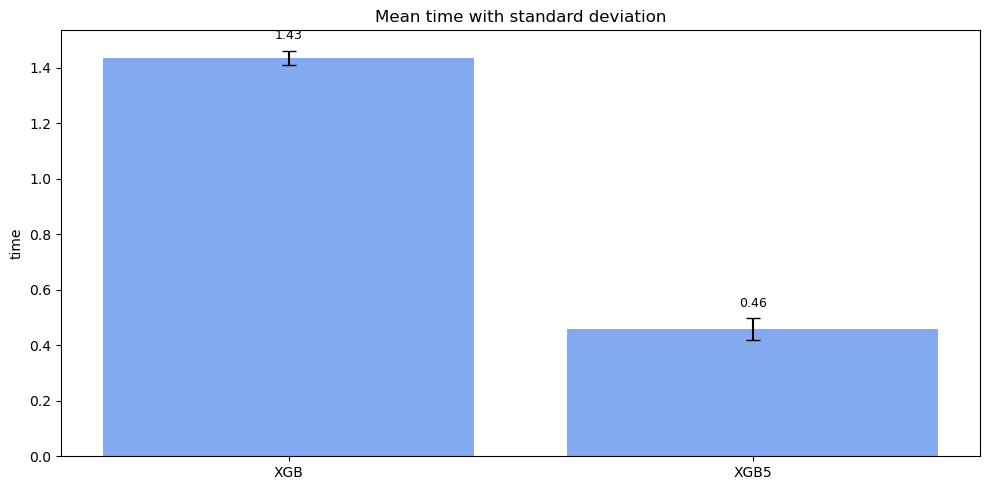

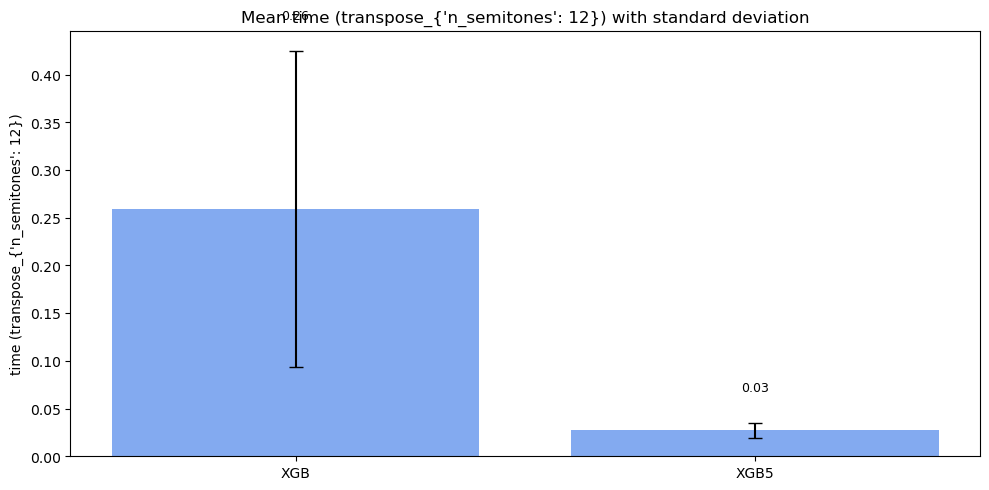

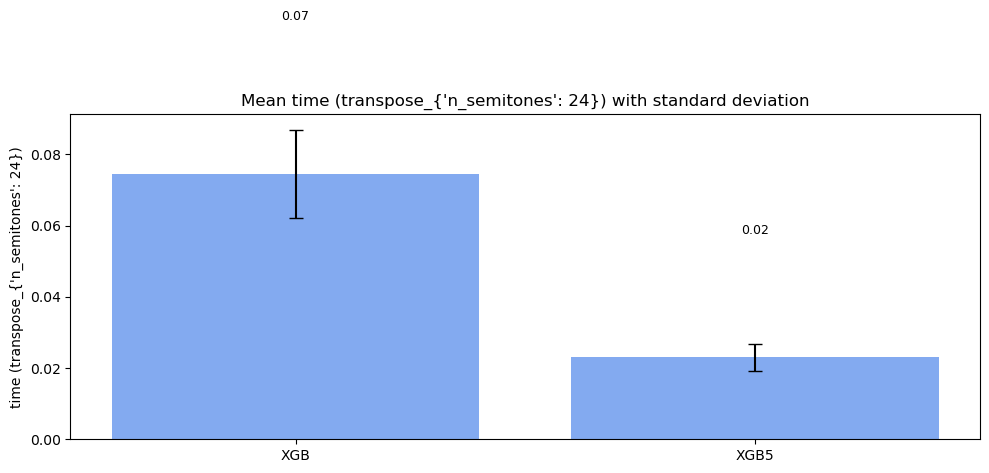

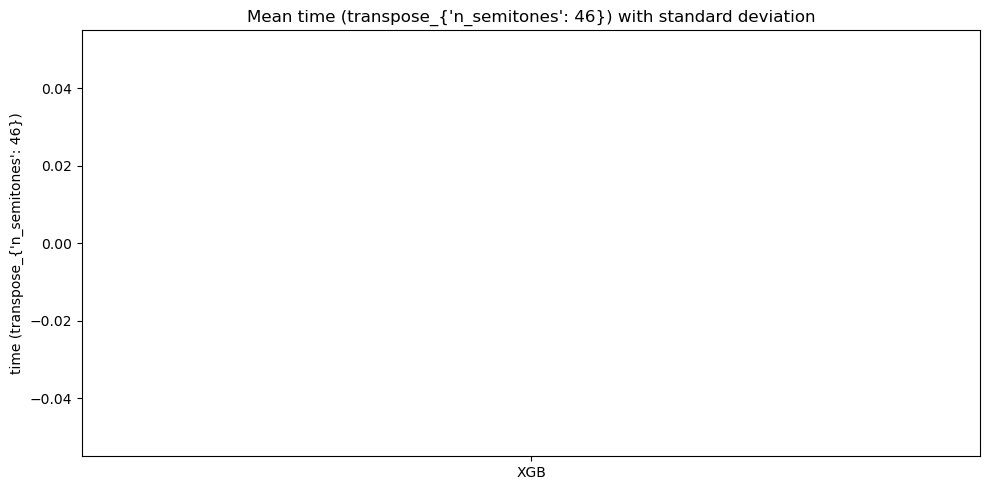

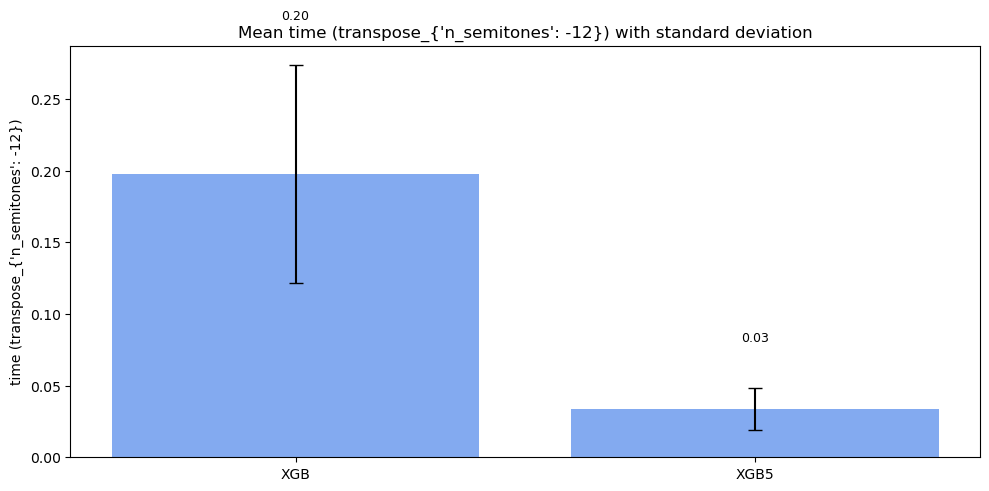

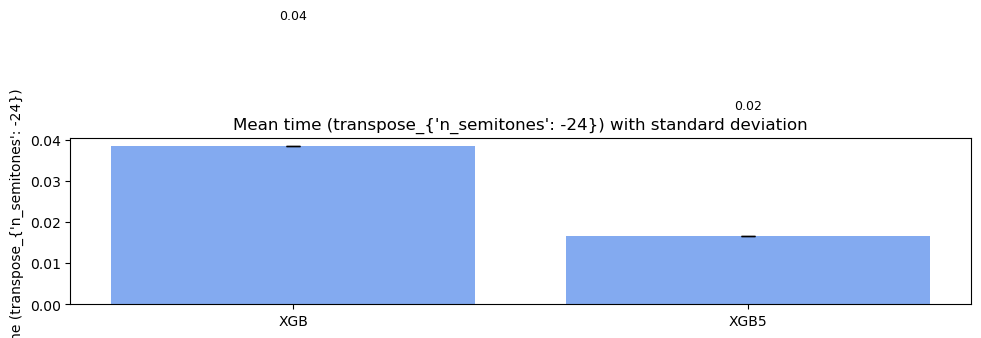

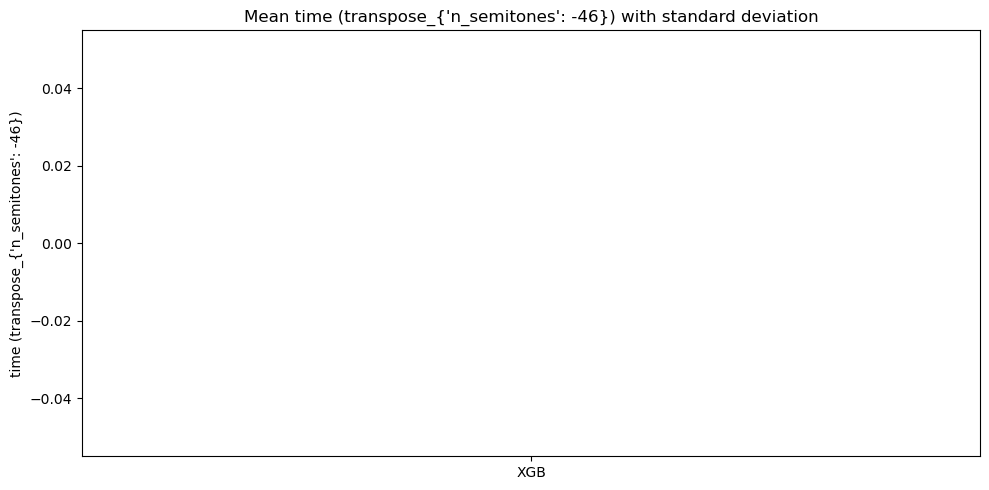

In [ ]:
for mn in ml_metrics_names:
    if "time" in mn:
        # Plot
        plt.figure(figsize=(10, 5))
        barlist = plt.bar(model_names_short, metrics_mean[mn], yerr=metrics_std[mn], capsize=5, color='cornflowerblue', alpha=0.8)

        plt.ylabel(mn)
        plt.title(f'Mean {mn} with standard deviation')
        if not "time" in mn:
            plt.ylim(0, 1.1)

        # Optional: Add mean values above bars
        for i, (mean, std) in enumerate(zip(metrics_mean[mn], metrics_std[mn])):
            plt.text(i, mean + std + 0.03, f"{mean:.2f}", ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

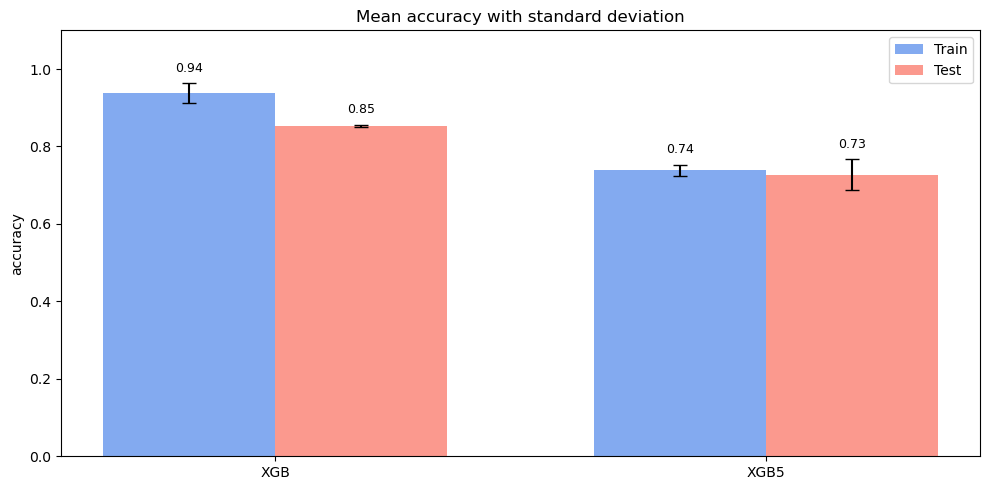

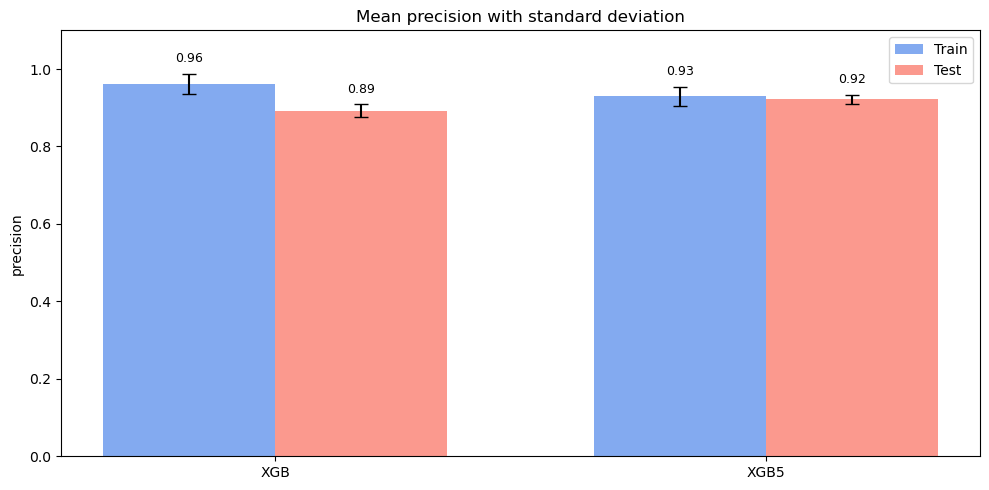

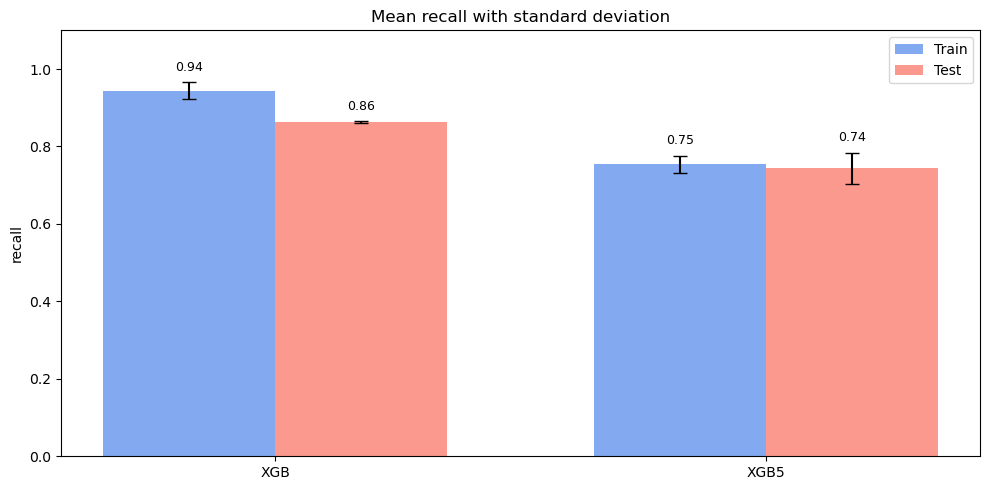

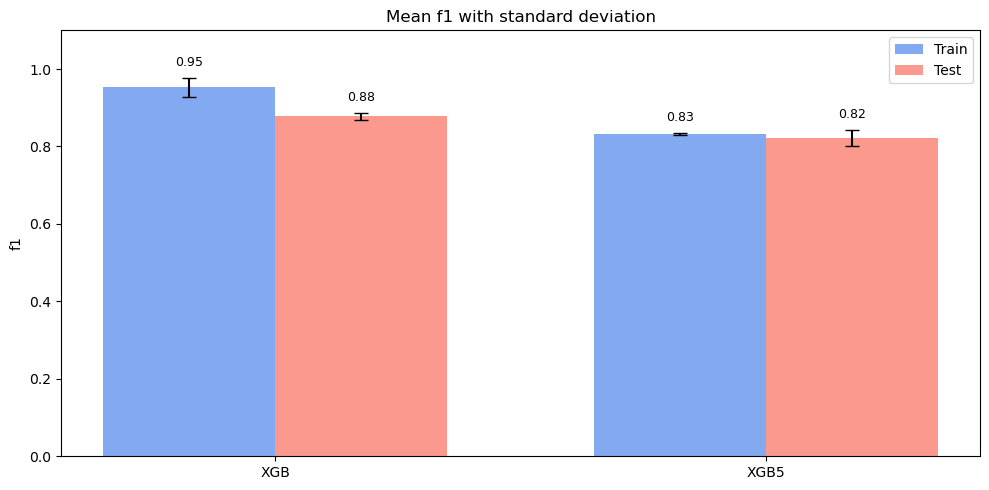

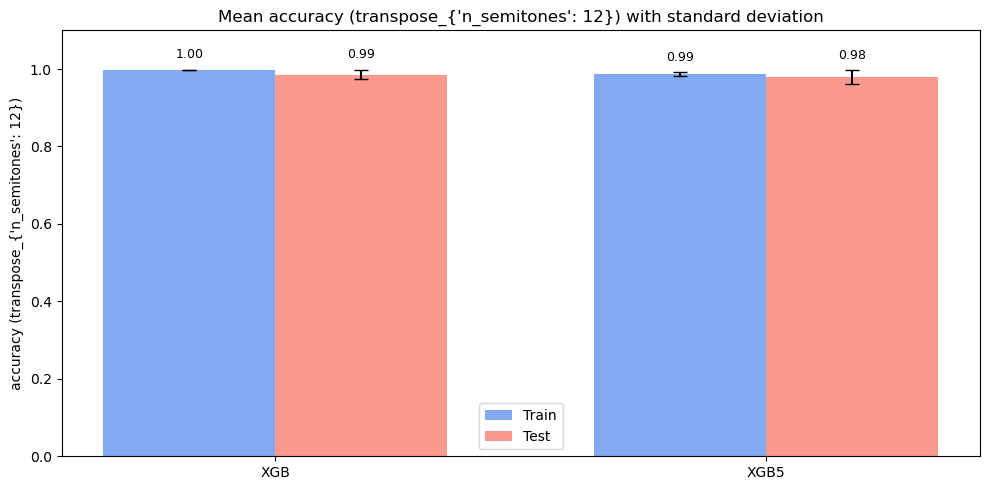

...

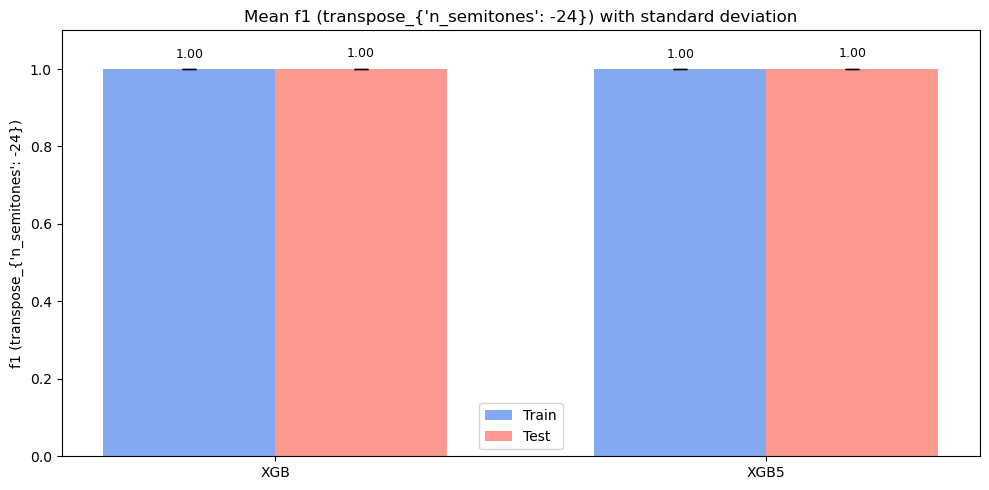

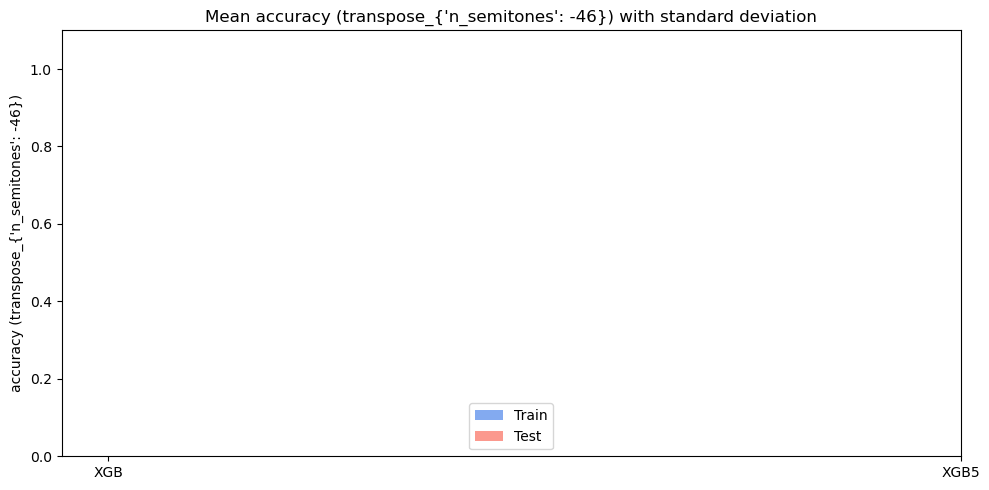

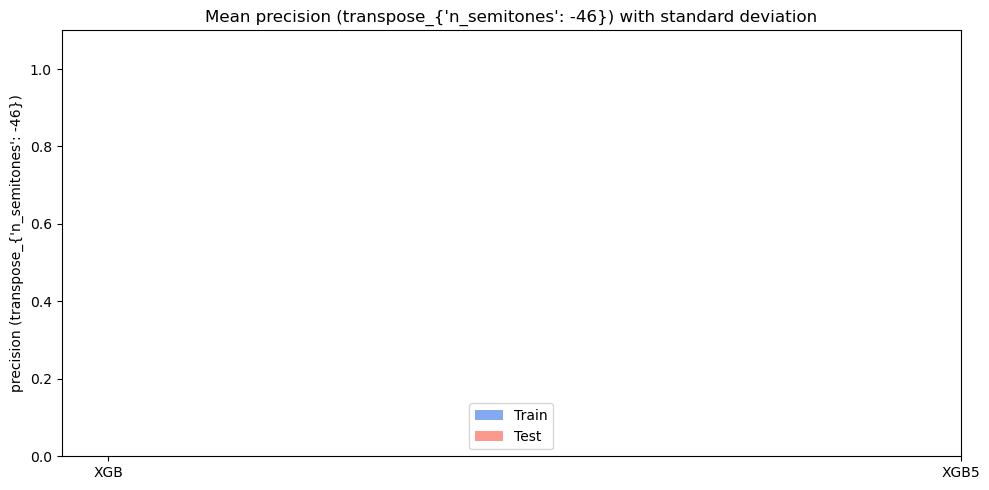

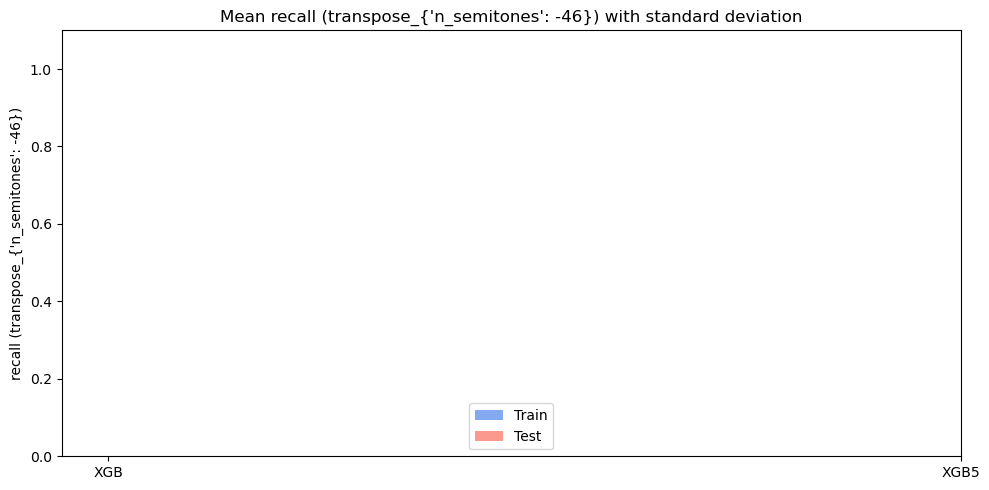

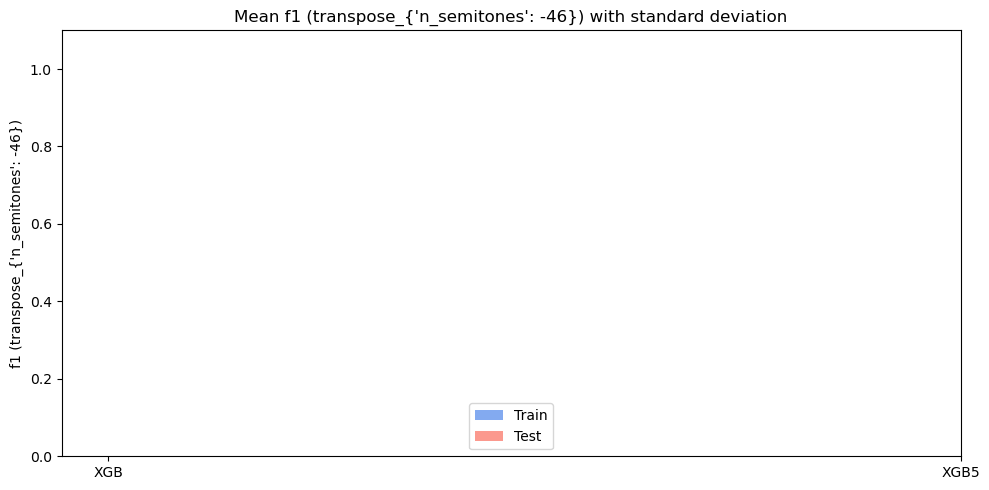

In [ ]:
for mn in ml_metrics_names:
    if "train" in mn:
        mn_train = mn
        mn_test = mn.replace("train", "test")

        # Data for the two series
        train_means = metrics_mean[mn_train]
        test_means  = metrics_mean[mn_test]
        train_stds  = metrics_std[mn_train]
        test_stds   = metrics_std[mn_test]

        x = np.arange(len(model_names_short))   # positions
        width = 0.35

        plt.figure(figsize=(10, 5))

        # Two bar groups
        plt.bar(x - width/2, train_means, width,
                yerr=train_stds, capsize=5,
                label='Train', color='cornflowerblue', alpha=0.8)

        plt.bar(x + width/2, test_means, width,
                yerr=test_stds, capsize=5,
                label='Test', color='salmon', alpha=0.8)

        # Labels & layout
        plt.xticks(x, model_names_short)
        title = mn.replace(" (train)", "")
        plt.ylabel(title)
        plt.title(f'Mean {title} with standard deviation')

        if "time" not in mn:
            plt.ylim(0, 1.1)

        # Add mean value labels above bars
        for i, (mean, std) in enumerate(zip(train_means, train_stds)):
            plt.text(x[i] - width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        for i, (mean, std) in enumerate(zip(test_means, test_stds)):
            plt.text(x[i] + width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)
            
        plt.legend()
        plt.tight_layout()
        plt.show()

In [ ]:
# Renitialize metrics collectors
s = (len(filenames),len(model_names))
ml_metrics = dict()
base_metrics_names = ["time",
                      "accuracy (train)",
                      "accuracy (test)",
                      "precision (train)",
                      "precision (test)",
                      "recall (train)",
                      "recall (test)",
                      "f1 (train)",
                      "f1 (test)",
                      ] #, "n_events", "n_classes"]
ml_metrics_names = base_metrics_names.copy()

for mn in ml_metrics_names:
    ml_metrics[mn] = np.zeros(s)

In [ ]:
# Single-class, without transformations
error_collection = []
for i, filein in enumerate(filenames):    
    for u, (model_name, clf) in enumerate(zip(model_names, classifiers)):
        try: 
            metrics = amo_with_doublings_multiclass(filein,fileout=None,model=model_name, tol=0.2, transformations=None, multiclass=False, model_path=model_path)
            print(metrics)
            for mn in ml_metrics_names:
                # ml_metrics["accuracy"][i,u] = metrics["accuracy"]
                ml_metrics[mn][i,u] = metrics[mn]
        except Exception as e:
            print("Error")
            error_collection.append(f"Error with {filein} and model {model_name}: {e}")

print("\n????????? ERRORS ??????????")
for error in error_collection:
    print(error)


========= PREPROCESSING =========
[PREPROCESSING] Computing and caching results...
Mapping: [[1 'Piccolo' 1 73]
 [2 '2 Flauti' 1 73]
 [3 '2 Oboi' 2 68]
 [4 '2 Clarinetti in B' 3 71]
 [5 '2 Fagotti' 4 70]
 [6 'Corni in F I II' 5 60]
 [7 'Corni in F III IV' 5 60]
 [8 '2 Pistoni in B' 6 56]
 [9 '2 Trombe in F' 6 56]
 [10 '2 Tromboni' 7 57]
 [11 'Trombone 3' 7 57]
 [12 'Tuba' 8 58]
 [13 'Timpani' 10 47]
 [14 'Arpa' 0 46]
 [15 'Violine I' 11 48]
 [15 'Violine I' 11 45]
 [16 'Violine II' 12 48]
 [17 'Viola' 13 48]
 [17 'Viola' 13 45]
 [18 'Violoncelle' 14 45]
 [18 'Violoncelle' 14 48]
 [19 'Contrabasse' 15 45]
 [19 'Contrabasse' 15 48]]

Define covariates and target variable. Target variable encoding
Labels ['10_7' '11_7' '12_8' '13_10' '14_0' '15_11' '16_12' '17_13' '18_14'
 '19_15' '1_1' '2_1' '3_2' '4_3' '5_4' '6_5' '7_5' '8_6' '9_6']
Number of events in filein:  4320
Last onset at 226.08333333333334
y_train, test size: 0.2 , labels: ['10_7' '11_7' '12_8' '13_10' '14_0' '15_11' '16_12' '

In [ ]:
metrics_mean = dict()
metrics_std = dict()
for mn in ml_metrics_names:
    metrics_mean[mn], metrics_std[mn] = return_m_std(ml_metrics[mn], mn)

time
[1.2816714  0.09147489]
[0.11879504 0.00986397]
accuracy (train)
[0.95767204 0.86975608]
[0.02294139 0.00227922]
accuracy (test)
[0.86797386 0.84571759]
[0.02091503 0.00428241]
precision (train)
[0.95767204 0.86975608]
[0.02294139 0.00227922]
precision (test)
[0.8713651  0.85663555]
[0.02272459 0.00290151]
recall (train)
[0.95767204 0.86975608]
[0.02294139 0.00227922]
recall (test)
[0.86797386 0.84571759]
[0.02091503 0.00428241]
f1 (train)
[0.95767204 0.86975608]
[0.02294139 0.00227922]
f1 (test)
[0.86738257 0.84317103]
[0.02060531 0.00442944]


In [ ]:
output_dir = model_path + "results"
os.makedirs(output_dir, exist_ok=True)

# Combine into a DataFrame
rows = []
for metric in metrics_mean:
    means = metrics_mean[metric]
    stds = metrics_std[metric]
    
    for i, (m, s) in enumerate(zip(means, stds)):
        rows.append({
            "metric": metric,
            "index": i,
            "mean": m,
            "std": s
        })

df = pd.DataFrame(rows)

df.to_csv(os.path.join(output_dir, f"metrics (single label).csv"), index=False)

df = pd.DataFrame({
    "model_name": model_names,
    "model_name_short": model_names_short
})

df.to_csv(os.path.join(output_dir, "model_names (single label).csv"), index=False)

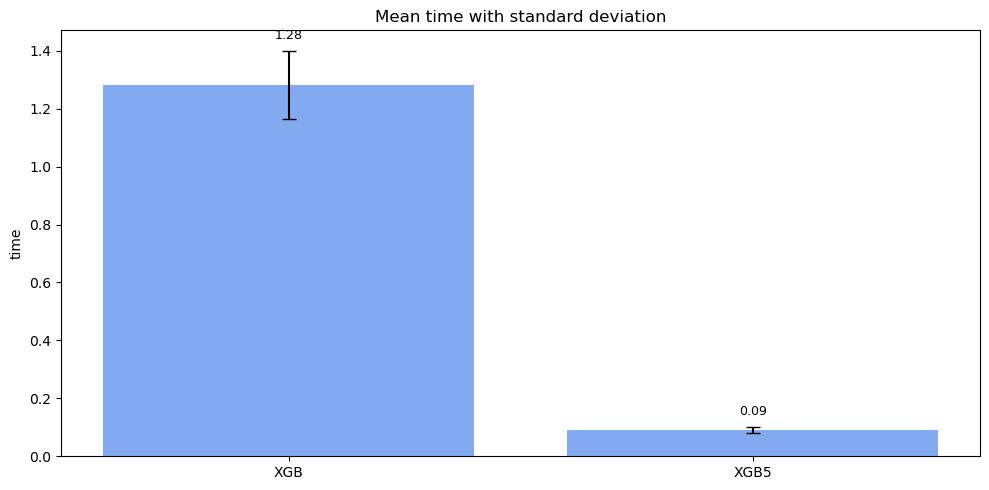

In [ ]:
for mn in ml_metrics_names:
    if "time" in mn:
        # Plot
        plt.figure(figsize=(10, 5))
        barlist = plt.bar(model_names_short, metrics_mean[mn], yerr=metrics_std[mn], capsize=5, color='cornflowerblue', alpha=0.8)

        plt.ylabel(mn)
        plt.title(f'Mean {mn} with standard deviation')
        if not "time" in mn:
            plt.ylim(0, 1.1)

        # Optional: Add mean values above bars
        for i, (mean, std) in enumerate(zip(metrics_mean[mn], metrics_std[mn])):
            plt.text(i, mean + std + 0.03, f"{mean:.2f}", ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

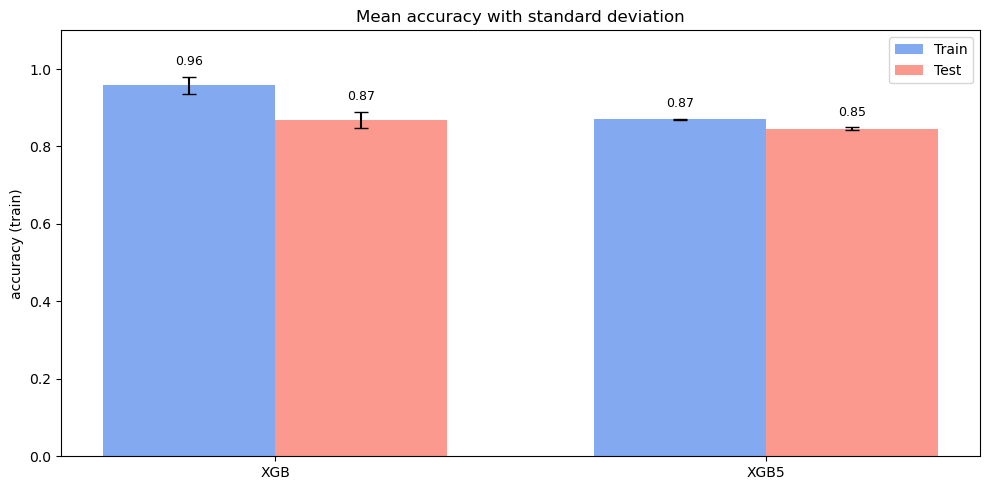

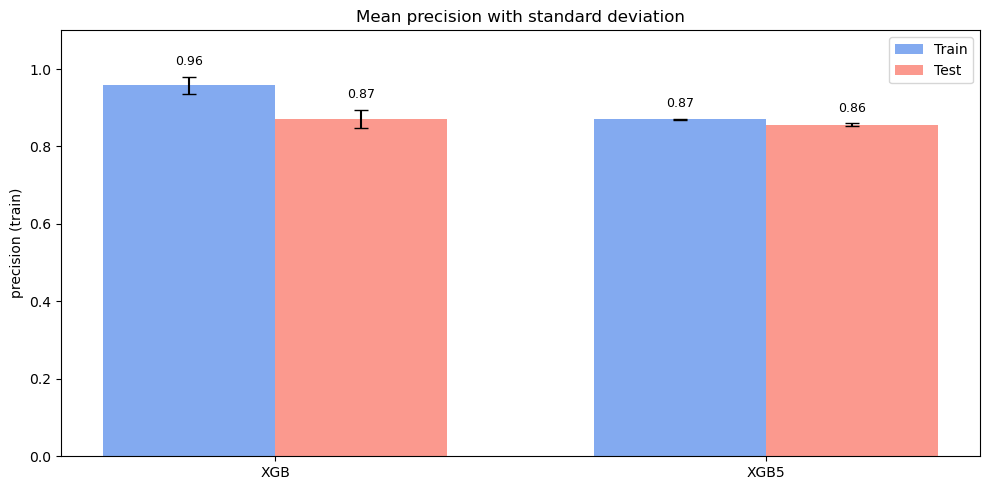

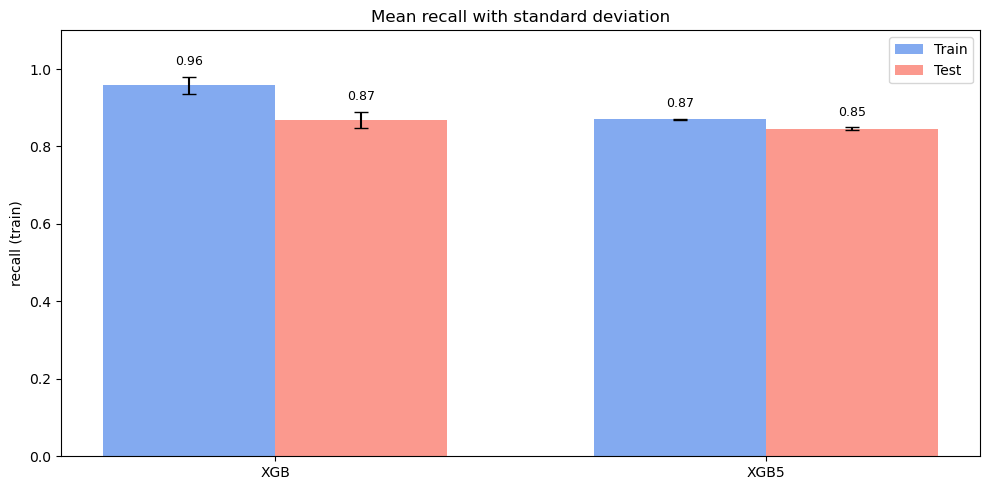

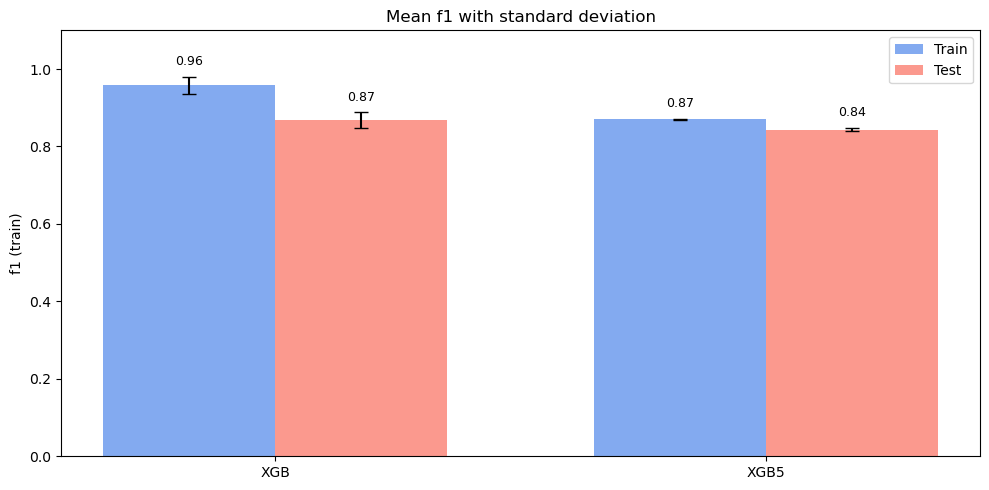

In [ ]:
for mn in ml_metrics_names:
    if "train" in mn:
        mn_train = mn
        mn_test = mn.replace("train", "test")

        # Data for the two series
        train_means = metrics_mean[mn_train]
        test_means  = metrics_mean[mn_test]
        train_stds  = metrics_std[mn_train]
        test_stds   = metrics_std[mn_test]

        x = np.arange(len(model_names_short))   # positions
        width = 0.35

        plt.figure(figsize=(10, 5))

        # Two bar groups
        plt.bar(x - width/2, train_means, width,
                yerr=train_stds, capsize=5,
                label='Train', color='cornflowerblue', alpha=0.8)

        plt.bar(x + width/2, test_means, width,
                yerr=test_stds, capsize=5,
                label='Test', color='salmon', alpha=0.8)

        # Labels & layout
        plt.xticks(x, model_names_short)
        plt.ylabel(mn)
        plt.title(f'Mean {mn.replace(" (train)", "")} with standard deviation')

        if "time" not in mn:
            plt.ylim(0, 1.1)

        # Add mean value labels above bars
        for i, (mean, std) in enumerate(zip(train_means, train_stds)):
            plt.text(x[i] - width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        for i, (mean, std) in enumerate(zip(test_means, test_stds)):
            plt.text(x[i] + width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        plt.legend()
        plt.tight_layout()
        plt.show()